# MultiModalSpectralTransformer


### Config

In [1]:
# Core libraries
import copy
import glob
import json
import os
import pickle
import random
import statistics
from argparse import Namespace
from collections import defaultdict
from datetime import datetime
import tempfile
import math
import ast
import time
import shutil
from math import ceil
import re
from typing import List, Dict, Any, Union, Tuple


# Data processing and scientific computing
import numpy as np
import pandas as pd
from tqdm import tqdm
from tqdm.autonotebook import tqdm

# Machine learning and data visualization
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.model_selection import train_test_split
import umap
from sklearn.neighbors import RadiusNeighborsRegressor
from scipy.spatial.distance import cosine
from sklearn.neighbors import NearestNeighbors

# PyTorch and related libraries
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data.distributed import DistributedSampler
from torch.optim.lr_scheduler import ReduceLROnPlateau
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.profiler import SimpleProfiler, AdvancedProfiler
from pytorch_lightning.loggers import WandbLogger

# RDKit for cheminformatics
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem, Draw, Descriptors, MolFromSmiles, MolToSmiles
from rdkit.Chem.Descriptors import MolWt
from rdkit.Chem.rdMolDescriptors import CalcMolFormula
from rdkit.DataStructs import FingerprintSimilarity, TanimotoSimilarity

# Weights & Biases for experiment tracking
import wandb

# Miscellaneous
from IPython.display import HTML, SVG, display

# Setting up environment
%matplotlib inline
torch.cuda.device_count()
#wandb.login()

# Custom utility modules
import utils_MMT.clip_functions_v15_4 as cf
import utils_MMT.MT_functions_v15_4 as mtf
import utils_MMT.validate_generate_MMT_v15_4 as vgmmt
import utils_MMT.run_batch_gen_val_MMT_v15_4 as rbgvm
import utils_MMT.clustering_visualization_v15_4 as cv
import utils_MMT.plotting_v15_4 as pt
import utils_MMT.execution_function_v15_4 as ex
import utils_MMT.train_test_functions_pl_v15_4 as ttf
import utils_MMT.ir_simulation_v15_4 as irs
import utils_MMT.helper_functions_pl_v15_4 as hf
import utils_MMT.mmt_result_test_functions_15_4 as mrtf
import utils_MMT.experiment_function_v15_4 as exp_func
from utils_MMT.mmt_result_test_functions_15_4 import *
import utils_MMT.improvement_cycle_neg_examples_v15_4 as icne
import shutil

/projects/cc/se_users/knlr326/miniconda_SE/envs/NMR_Structure_Elucidator/lib/python3.7/site-packages/ipykernel_launcher.py:26: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
INFO:rdkit:Enabling RDKit 2023.03.2 jupyter extensions
Using backend: pytorch


732
678


INFO:chemprop.paths:Using BASE_DIR: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/chemprop-IR/chemprop
INFO:chemprop.paths:Using MODELS_BASE_DIR: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/models
INFO:chemprop.paths:Using CHEMPROP_IR_MODEL_DIR: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/models/chemprop-IR
INFO:chemprop.paths:Successfully created model directories


In [2]:

def load_json_dics():
    with open('./itos.json', 'r') as f:
        itos = json.load(f)
    with open('./stoi.json', 'r') as f:
        stoi = json.load(f)
    with open('./stoi_MF.json', 'r') as f:
        stoi_MF = json.load(f)
    with open('./itos_MF.json', 'r') as f:
        itos_MF = json.load(f)    
    return itos, stoi, stoi_MF, itos_MF
    
itos, stoi, stoi_MF, itos_MF = load_json_dics()
rand_num = str(random.randint(1, 10000000))

In [3]:
IR_config_dict = {
    "gpu": list(range(torch.cuda.device_count())),
    "test_path": [os.path.abspath("./models/chemprop-ir/ir_models_data/solvation_example/solvation_spectra.csv")],
    "use_compound_names": [False],
    "preds_path": [os.path.abspath("./models/chemprop-ir/ir_models_data/ir_preds_test_2.csv")],
    "checkpoint_dir": [os.path.abspath("./models/chemprop-ir/ir_models_data/experiment_model/model_files")],
    "spectra_type": ["experimental"],
    "spectra_type_nr": [0],
    "checkpoint_path": [None],
    "batch_size": [50],
    "no_cuda": [[False]],
    "features_generator": [None],
    "features_path": [None],
    "max_data_size": [100],
    "ensemble_variance": [False],
    "ensemble_variance_conv": [0.0],
}

import os

# Determine the project root directory (where the notebook is located)
project_root = os.path.dirname(os.path.abspath('__file__'))

hyperparameters = {
    # General project information
    "project": ["MMST_V1"],  # Name of the project for wandb monitoring
    "ran_num":[rand_num],
    "device": ["cuda"], # device on which training takes place
    "gpu_num":[1], # number of GPUs for training with pytorch lightning
    "num_workers":[4], # Needs to stay 1 otherwise code crashes - ToDO
    "data_type":["sgnn"], #["sgnn", "exp", "acd", "real", "inference"], Different data types to select
    "execution_type":["validate_MMT"], #[ "plot_similarities", "simulate_real", "test_performance", "SMI_generation_MMT", "SMI_generation_MF", "data_generation", "transformer_training","transformer_improvement", "clip_training", "clip_improvement", "validate_MMT"] # different networks to select for training
    "syn_data_simulated": [False],  # For the improvment cycle a ticker that shows whether data has been simulated or not.
    "training_type":["clip"], #["clip","transformer"] # different networks to select for training

    # Encoding dicts
    "itos_path": [os.path.join(project_root, "itos.json")],
    "stoi_path": [os.path.join(project_root, "stoi.json")],
    "itos_MF_path": [os.path.join(project_root, "itos_MF.json")],
    "stoi_MF_path": [os.path.join(project_root, "stoi_MF.json")],
    
    ### Data settings
    "input_dim_1H":[2], # Imput dimensions of the 1H data
    "input_dim_13C": [1], # Imput dimensions of the 13C data
    "input_dim_HSQC": [2], # Imput dimensions of the HSQC data
    "input_dim_COSY": [2],  # Imput dimensions of the COSY data
    "input_dim_IR": [1000],  # Imput dimensions of the IR data
    "MF_vocab_size": [len(stoi_MF)],  # New, size of the vocabulary for molecular formulas
    "MS_vocab_size": [len(stoi)],  # New, size of the vocabulary for molecular formulas
    "tr_te_split":[0.9], # Train-Test split
    "padding_points_number":[64], # Padding number for the embedding layer into the network
    "data_size": [1000], # number of datapoints for the training ZINC:3975764/ PubChem1797828
    "test_size": [10], # number of datapoints for the training ZINC: 3975764
    "model_save_dir": [os.path.join(project_root, "experiments/exp_1/model_save_dir")],
    "ML_dump_folder": [os.path.join(project_root, "experiments/exp_1/dump")],
    "model_save_interval": [10000],
    
    # Option 1 SGNN
    "use_real_data": [False],
    "ref_data_type": ["1H"],
    "csv_train_path": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv")],
    "csv_1H_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv")],
    "csv_13C_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_13C_train_V8.csv")],    
    "csv_HSQC_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_HSQC_train_V8.csv")],    
    "csv_COSY_path_SGNN": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_COSY_train_V8.csv")],      
    "csv_IR_MF_path": [''],
    "csv_path_val": [os.path.join(project_root, "data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv")], 
    "IR_data_folder": [os.path.join(project_root, "data/ZINK_dataset/IR_spectra_NN")],
    "pickle_file_path": [""],
    "dl_mode": ['val'],
    "isomericSmiles": [False],
    
    #### Transformer Settings ####
    # Training and model settings
    "training_mode":["1H_13C_HSQC_COSY_IR_MF_MW"], #["edding_src_1H = torch.zeros((feature_dim, current_ba"], Modalities selected for training
    "blank_percentage":[0.0], # percentage of spectra that are blanked out during training for better generalizability of the network to various datatypes
    "batch_size":[64], # number needs to be the same as number of GPUs 
    "num_epochs": [10], # number of epochs for training
    "lr_pretraining": [1e-4], # Pretraining learning rate
    "lr_finetuning": [5e-5], # Finetuning learning rate
    "load_model": [True], # if model should be loaded from path
    "checkpoint_path":[os.path.join(project_root,"models/mmst/base_models/1_0_V8i_MMTi_RAW_MW_DROP_Loss_0.112.ckpt")], #V8
    "save_model": [True], # if model should be saved
    
    # Model architecture
    "in_size": [len(stoi)],
    "hidden_size": [128],
    "out_size": [len(stoi)],
    "num_encoder_layers": [6], #8
    "num_decoder_layers": [6], #8
    "num_heads": [16], #8  ### number of attention heads
    "forward_expansion": [4], #4
    "max_len": [128], # maximum length of the generated sequence
    "drop_out": [0.1],
    "fingerprint_size": [512], # Dimensions of encoder output for CLIP contrastive training    
    "gen_SMI_sequence":[True], # If the model generates a sequence with the SMILES current model for evaluation
    "sampling_method":["mix"], # weight_mol_weight ["multinomial", "greedy". "mix"]  
    "training_setup":["pretraining"], # ["pretraining","finetuning"]
    "smi_randomizer":[False], # if smiles are randomized or canonical during training
    
    ### SGNN Feedback
    "sgnn_feedback":[False], # if SGNN generates 1H and 13C spectrum on the fly on the generated smiles -> "gen_SMI_sequence":[True]
    "matching":["HungDist"], #["MinSum","EucDist","HungDist"], # HSQC point matching technique used
    "padding":["NN"], # ["Zero","Trunc","NN"], # HSQC padding technique used -> see publication: XXX
    # Weight feedback
    "train_weight_min":[None], # Calculate on the fly - Used for the weight loss calculation for scaling
    "train_weight_max":[None], # Calculate on the fly - Used for the weight loss calculation for scaling
    # Training Loss Weighting options
    "weight_validity": [0.0], # up to 1
    "weight_SMI": [1.0], # up to 1
    "weight_FP": [0.0], # up to 1
    "weight_MW": [0], # up to 100
    "weight_sgnn": [0.0], # up to 10
    "weight_tanimoto": [0.0], # up to 1
    "change_loss_weights":[False], # if selected the weights get ajusted along the training
    "increment":[0.01], # increment on how much it gets ajusted during training -> TODO
    "batch_frequency":[10000], # Frequency how often it gets ajusted -> TODO
    
    ### For Validation
    "beam_size": [1],  
    "multinom_runs": [1], 
    "temperature":[1],
    "gen_len":[64],
    "pkl_save_folder":[os.path.join(project_root, "exp_1/pkl_save_folder")],
    
    ### Molformer options 
    "MF_max_trails":[500],
    "MF_tanimoto_filter":[0.1],
    "MF_filter_higher":[1], # False = 0 True = 1
    "MF_delta_weight":[5],
    "MF_generations":[30],
    "MF_model_path":[os.path.join(project_root,"models/mol2mol/Alessandro_big/weights_pubchem_with_counts_and_rank_sanitized.ckpt")],
    "MF_vocab":[os.path.join(project_root,"models/mol2mol/Alessandro_big/vocab_new.pkl")],
    "MF_csv_source_folder_location":[os.path.join(project_root,"deep-molecular-optimization/data/MMP")],
    "MF_csv_source_file_name":["test_selection_2"],
    "MF_methods":["MMP"], #["MMP", "scaffold", "MMP_scaffold"],      
    "max_scaffold_generations":[10], #
    
    ### MMT batch generation
    "MMT_batch":[32], # how big is the batch of copies of the same inputs that is processed by MMT 
    "MMT_generations":[4], # need to be multiple of MMT_batch -> number of valid generated molecules
    "n_samples":[10], # number of molecules that should be processed for data generation - needs to be smaller than dataloader size
    "gen_mol_csv_folder_path": [os.path.join(project_root,"data/SGNN_gen_folder")],  # Updated to use local path in the repository
    
    ### Fine-tuning improvement options
    "train_data_blend":[0], # how many additional molecules should be added to the new dataset from the original training dataset
    "train_data_blend_CLIP":[1000], # how many additional molecules should be added to the new dataset from the original training dataset
    

    ### Data generation SGNN -> 1H, 13C, HSQC, COSY
    "SGNN_gen_folder_path":[os.path.join(project_root, "experiments/exp_1/SGNN_gen_folder")],
    "SGNN_csv_gen_smi":[os.path.join(project_root,"data/test_data/IBM_SMI_data_top20.csv")],
    "SGNN_size_filter":[550],
    "SGNN_csv_save_folder": [os.path.join(project_root,"experiments/exp_1/SGNN_gen_folder")],
    "IR_save_folder":[os.path.join(project_root, "experiments/exp_1/IR_data")],

    ##################################################
    #### LEGACY parameters for Future experiments ####
    ##################################################
    ### CLIP Model for contrastive learning ChemBerta VS MultiModalSpectralTransformer
    #### CLIP Settings ####
    ### ChemBerta
    "model_version":[os.path.join(project_root,"models/mmst/OLD/Chemberta_source")],   # Source of pretrained chemberta from paper
    "CB_model_path":[os.path.join(project_root,"models/mmst/OLD/Large_300_15.pth")], # path to pretrained Chemberta model
    "num_class":[1024], #
    "num_linear_layers":[0], # number of linear layers in architecture before num_class output
    "use_dropout":[True],
    "use_relu":[False],
    "loss_fn":["BCEWithLogitsLoss"], #"MSELoss", "BCELoss", 
    "CB_embedding": [1024], #1024
    # PCA
    "fp_dim_reduction":[False], #True
    "pca_components":[300],  
    #"CB_model_name": ["Large_300_15"],

    ### Multimodal Transformer
    "MT_model_path":[os.path.join(project_root,"models/mmst/OLD/MultimodalTransformer_time_1706856620.3718672_Loss_0.202.pth")],  # path to pretrained Multimodal Transformer model  
    #"MT_model_name": ["SpectrumBERT_PCA_large_3.6"],
    "MT_embedding": [512], #512
    ### Projection Head
    "projection_dim": [512],
    "dropout": [0.1],
    
    ### Train parameters
    # Dataloader settings
    "similarity_threshold":[0.6], # Filtere that selects just molecules with a tanimotosimilarity higher than that number
    "max_search_size":[10000], # Size of the data that will be searched to find the similar molecules  # 100000
    "weight_delta":[50], # Filter to molecules with a +/- delta weight of that numbeTraceback (most recent call last):
    "CLIP_batch_size":[128],  #,64,128,256 ### batch size for the CLIP training
    "CLIP_NUM_EPOCHS": [10],    # Number of training epochs
    "CLIP_temperature": [1],
    #"CB_projection_lr": [1e-3], # projection head learning rate for Chemberta
    "MT_projection_lr": [1e-3], # projection head learning rate for Multimodal Transfomer
    "CB_lr": [1e-4], # Chemberta Learning Rate
    "MT_lr": [1e-5], # Multimodal Transfomer Learning Rate
    "weight_decay": [1e-3], # Weight decay for projection heads -> TODO why just on those
    "patience": [1],   # not integrated yet
    "factor": [0.8],   # not integrated yet
    "CLIP_continue_training":[True],
    "CLIP_model_path":[os.path.join(project_root,"models/mmst/OLD/MultimodalCLIP_Epoch_9_Loss0.096.ckpt")],   
    "CLIP_model_save_dir":[os.path.join(project_root,"models/mmst/OLD/test_CLIP")],
    }


def save_config(config, path):
    with open(path, 'w') as f:
        json.dump(config, f)

def load_config(path):
    try:
        with open(path, 'r') as f:
            return json.load(f)
    except FileNotFoundError:
        return None    

def parse_arguments(hyperparameters):
    # Using dictionary comprehension to simplify your code
    parsed_args = {key: val[0] for key, val in hyperparameters.items()}
    return Namespace(**parsed_args)

config = parse_arguments(hyperparameters)
ir_config_path = os.path.join(project_root,'utils_MMT/ir_config_V8.json')
save_config(IR_config_dict, ir_config_path)
IR_config_dict = load_config(ir_config_path)
IR_config = parse_arguments(IR_config_dict)
irs.modify_predict_args(IR_config)

config_path = os.path.join(project_root,'utils_MMT/config_V8.json')
save_config(hyperparameters, config_path)
config_dict = load_config(config_path)
config = parse_arguments(config_dict)

### 0.0 Test Sized Models and Different Training Data


##### Data size effect - Training times effect


In [ ]:


"""
# V8i Raw 1M
#config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_1Mio-epoch=07-loss=0.10.ckpt")
#same batches as 20M mol seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_1Mio-epoch=19-loss=0.04.ckpt")


model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_0a["tanimoto_sim"]))

import pickle
# Save the data to a file
#file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_1M_L_epoch_7.pkl')
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_L_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0a, file)
    

# Save the data to a file
#file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_1M_L_epoch_7.pkl')
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_L_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0a, file)"""

'\n# V8 Raw 1M\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/model-epoch=07-loss=0.10.ckpt"\n#last checkpoint\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/MultimodalTransformer_time_1711116450.3325515_Loss_0.042.ckpt"\n#same batches as 20M mol seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/model-epoch=19-loss=0.04.ckpt"\n\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\nprint(np.mean(results_dict_0a["tanimoto_sim"]))\n\nimport pickle\n# Save the data to a file\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/pr

In [ ]:
"""
# V8i Raw 2M
#config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_2Mio-epoch=07-loss=0.06.ckpt")
#same batches as 20M mol seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_2Mio-epoch=09-loss=0.04.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_0b["tanimoto_sim"]))


import pickle
# Save the data to a file
#file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_2M_L_epoch_7.pkl')  
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_2M_L_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0b, file)
    

# Save the data to a file
#file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_2M_L_epoch_7.pkl')  
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_2M_L_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0b, file)"""

'\n# V8 Raw 2M\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_2Mio/model-epoch=07-loss=0.06.ckpt"\n#last checkpoint\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_2Mio/MultimodalTransformer_time_1711251408.4834092_Loss_0.031.ckpt"\n#same batches as 20M mol seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_2Mio/model-epoch=09-loss=0.04.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\nprint(np.mean(results_dict_0b["tanimoto_sim"]))\n\n\nimport pickle\n# Save the data to a file\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/pr

In [ ]:
"""
# V8i Raw 4M
#config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_4Mio-epoch=07-loss=0.02.ckpt")
#same batches as 20M mol seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_4Mio-epoch=04-loss=0.04.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

import pickle
# Save the data to a file
#file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_4M_L_epoch_7.pkl') 
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_4M_L_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0b, file)
    

# Save the data to a file
#file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_4M_L_epoch_7.pkl') 
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_4M_L_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0b, file)"""

'\n# V8 Raw 4M\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_4Mio/model-epoch=07-loss=0.02.ckpt"\n\n#last checkpoint\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_4Mio/MultimodalTransformer_time_1711912422.1540647_Loss_0.026.ckpt"\n#same batches as 20M mol seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_4Mio/model-epoch=04-loss=0.04.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\nimport pickle\n# Save the data to a file\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_4M_L_epo

#### Load saved data - EPOCH 7
- Different data sizes



In [ ]:
### Epoch 7 for all molecules seen

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_4M_L_epoch_7.pkl')
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0a = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_4M_L_epoch_7.pkl')  
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0a = pickle.load(file)

    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_2M_L_epoch_7.pkl')  
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0b = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_2M_L_epoch_7.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0b = pickle.load(file)
    

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_1M_L_epoch_7.pkl') 
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0c = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_1M_L_epoch_7.pkl')  
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0c = pickle.load(file)
    

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.0_prob_dict_results_0.1M_L_epoch_7.pkl')  
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0d = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_7/0.1_results_dict_0.1M_L_epoch_7.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0d = pickle.load(file)

In [6]:
prob_dict_results_2 = [ prob_dict_results_0d, prob_dict_results_0c, prob_dict_results_0b, prob_dict_results_0a]
results_dict_2 = [results_dict_0d, results_dict_0c, results_dict_0b, results_dict_0a]

##### Violin Chart

In [ ]:
labels = ['0.1M Epoch 7', '1M Epoch 7', '2M Epoch 7', '4M Epoch 7']
prob_dict_results_2 = [ prob_dict_results_0d, prob_dict_results_0c, prob_dict_results_0b, prob_dict_results_0a]

# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []
for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"  # Use a single color for all the violin plots
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Correct SMILES Sample Probability', fontsize=22)
#ax.set_xlabel('Trained Model', fontsize=16)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Adding a legend
lightseagreen_patch = plt.Line2D([0], [0], color='lightseagreen', lw=4, label='MMST')
#ax.legend(handles=[lightseagreen_patch], loc='upper left', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.0_Violin_Epoch_7_v3.png')
plt.savefig(save_path, format='png')
plt.show()


##### Tanimoto Chart

In [ ]:

# Sample input data
labels = ['0.1M Epoch 7', '1M Epoch 7', '2M Epoch 7', '4M Epoch 7']
results_dict_2 = [results_dict_0d,results_dict_0c, results_dict_0b, results_dict_0a]

# Prepare data
data_for_violin = [d["tanimoto_sim"] for d in results_dict_2]

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Labels for each subplot

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)

ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding a legend
lightseagreen_patch = plt.Line2D([0], [0], color='lightseagreen', lw=4, label='MMST')

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.0_Tanimoto_Violin_plot_Epoch_7_v3.png')
plt.savefig(save_path, format='png')
plt.show()


##### Number of Invalid molecules

In [ ]:
# Sample input data
labels = ['0.1M Epoch 7', '1M Epoch 7', '2M Epoch 7', '4M Epoch 7']
results_dict_2 = [results_dict_0d, results_dict_0c, results_dict_0b, results_dict_0a]

# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"]) # Total for percentage calculation

# Define colors for the bars
color2 = "#8CB0FE"

# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plotting the bars
bar1 = ax.bar(positions, mean_results_2, bar_width, color=color2, edgecolor='black', label='MMST')

# Adding value labels inside and percentage on top of each bar
for bar in bar1:
    yval = bar.get_height()
    percentage = (yval / total_entries) * 100 if total_entries > 0 else 0  # Calculate percentage

    # Top of the bar (moved higher)
    ax.text(bar.get_x() + bar.get_width() / 2,  yval / 2, f'{percentage:.1f}%', 
            rotation=90, ha='center', va='center', fontsize=22)

# Set the title and labels
plt.title(f'Greedy Sampled Number of Invalid SMILES           ', fontsize=22)
plt.ylabel('Invalid Molecules', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set y-limit slightly higher than max for label visibility
ax.set_ylim(0, max(mean_results_2) * 1.25)  

ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adding a legend
#ax.legend(fontsize=22)

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/0.0_Invalid_molecules_Epoch_7_v4.png')
plt.savefig(save_path, format='png')

# Show plot
plt.show()

#### Load saved data - 20M trained network

In [ ]:
### Exactly 20M molecules seen

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_4M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0a = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_4M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0a = pickle.load(file)

    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_2M_L_20M_mol.pkl')
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0b = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_2M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0b = pickle.load(file)
    

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_1M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0c = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_1M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0c = pickle.load(file)
    
    

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_0.5M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0d = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_0.5M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0d = pickle.load(file)


file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_0.1M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0e = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_0.1M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0e = pickle.load(file)
    


##### Violine Chart

In [ ]:
labels = ['0.1M | 20M', '1M | 20M', '2M | 20M', '4M | 20M']
prob_dict_results_2 = [ prob_dict_results_0e, prob_dict_results_0c, prob_dict_results_0b, prob_dict_results_0a]


# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []
for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"  # Use a single color for all the violin plots
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Adding a legend
lightseagreen_patch = plt.Line2D([0], [0], color='lightseagreen', lw=4, label='MMST')
#ax.legend(handles=[lightseagreen_patch], loc='upper left', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.1_Violin_20M_v3.png')  # Replace with your desired path
plt.savefig(save_path, format='png')
plt.show()


##### Tanimoto PLot

In [ ]:
labels = ['0.1M | 20M', '1M | 20M', '2M | 20M', '4M | 20M']
results_dict_2 = [results_dict_0e, results_dict_0c, results_dict_0b, results_dict_0a]

# Prepare data
data_for_violin = [d["tanimoto_sim"] for d in results_dict_2]

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Labels for each subplot

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
#ax.set_xlabel('Trained Model', fontsize=16)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

# Adding a legend
lightseagreen_patch = plt.Line2D([0], [0], color='lightseagreen', lw=4, label='MMST')

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.1_Tanimoto_Violin_plot_20_M_v3.png')
plt.savefig(save_path, format='png')
plt.show()


##### Invalid Molecules

In [ ]:
# Sample input data
# Labels, split into two lines for x-tick display
labels = ['0.1M | 20M', '1M | 20M', '2M | 20M', '4M | 20M']
results_dict_2 = [results_dict_0e, results_dict_0c, results_dict_0b, results_dict_0a]

# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"]) # Total for percentage calculation

# Define colors for the bars
color2 = "#8CB0FE"

# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plotting the bars
bar1 = ax.bar(positions, mean_results_2, bar_width, color=color2, edgecolor='black', label='MMST')

# Adding value labels inside and percentage on top of each bar
for bar in bar1:
    yval = bar.get_height()
    percentage = (yval / total_entries) * 100 if total_entries > 0 else 0  # Calculate percentage

    # Top of the bar (moved higher)
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{percentage:.1f}%', 
            rotation=90, ha='center', va='center', fontsize=22)

# Set the title and labels
plt.title(f'Greedy Sampled Number of Invalid SMILES         ', fontsize=22)
#plt.xlabel('Trained Model', fontsize=16)
plt.ylabel('Number of Invalid Molecules', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, max(mean_results_2) * 1.2)  # Set y-limit slightly higher than max for label visibility

# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/0.1_Invalid_molecules_20M_v4.png')
plt.savefig(save_path, format='png')

# Show plot
plt.show()


#### Model Size  & Training Time


In [ ]:
"""
# V8i Raw 1M Large
config.num_encoder_layers = 6
config.num_decoder_layers = 6
config.num_heads = 16

# V8i Raw 1M
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.0_V8i_MMTi_1Mio-epoch=19-loss=0.04.ckpt")
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

import pickle
# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_L_epoch_20.pkl')  
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0a, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_Lepoch_20.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0a, file)"""

'\n# V8 Raw 1M Large\nconfig.num_encoder_layers = 6\nconfig.num_decoder_layers = 6\nconfig.num_heads = 16\n\n# V8 Raw 1M\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio/model-epoch=19-loss=0.04.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0a, results_dict_0a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\nimport pickle\n# Save the data to a file\nfile_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_1M_L_epoch_20.pkl\'  # Replace with your desired path\nwith open(file_prob_dict_path, \'wb\') as file:\n    pickle.dump(prob_dict_results_0a, file)\n    \n\n# Save the data to a file\nfile_results_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexplora

In [ ]:
"""
# V8i Raw 1M Medium
config.num_encoder_layers = 3
config.num_decoder_layers = 3
config.num_heads = 8


### 20 M molecules seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.2_V8i_MMTi_1Mio_M-epoch=19-loss=0.09.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_M_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0b, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_M_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0b, file)"""

'\n# V8 Raw 1M Medium\nconfig.num_encoder_layers = 3\nconfig.num_decoder_layers = 3\nconfig.num_heads = 8\n\n\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_medium/model-epoch=18-loss=0.07.ckpt"\n### 20 M molecules seen\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_medium/model-epoch=19-loss=0.09.ckpt"\n\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0b, results_dict_0b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\n\nimport pickle\n# Save the data to a file\nfile_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_1M_M_epoch_20.pkl\'  # Replace with your desired path\n#file_prob_dict_path = \'/projects/cc/se_users/knlr3

In [ ]:
"""
# V8i Raw 1M Small
config.num_encoder_layers = 2
config.num_decoder_layers = 2
config.num_heads = 4

### 20 M molecules seen
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/different_trainings/0.2_V8i_MMTi_1Mio_S-epoch=19-loss=0.11.ckpt")

model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_0c, results_dict_0c = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.0_prob_dict_results_1M_S_20M_mol.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_0c, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240430_Epoch_20/0.1_results_dict_1M_S_20M_mol.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_0c, file)"""

'\n# V8 Raw 1M Small\nconfig.num_encoder_layers = 2\nconfig.num_decoder_layers = 2\nconfig.num_heads = 4\n\nconfig.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_small/model-epoch=19-loss=0.11.ckpt"\n### 20 M molecules seen\n#config.checkpoint_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_1Mio_small/model-epoch=19-loss=0.11.ckpt"\n\nmodel_MMT = mrtf.load_MMT_model(config)\nprob_dict_results_0c, results_dict_0c = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)\n\nimport pickle\n# Save the data to a file\nfile_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/0.0_prob_dict_results_1M_S_epoch_20.pkl\'  # Replace with your desired path\n#file_prob_dict_path = \'/projects/cc/se_users/knlr326/1_NMR_

##### Load saved data - Model Size 20M

In [ ]:

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_1M_L_20M_mol.pkl')  
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0d = pickle.load(file)

    
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_1M_L_20M_mol.pkl') 
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0d = pickle.load(file) 


file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_1M_M_epoch_20.pkl')  # Replace with your desired path
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0e = pickle.load(file)


file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_1M_M_epoch_20.pkl')  # Replace with your desired path
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0e = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.0_prob_dict_results_1M_S_epoch_20.pkl')  # Replace with your desired path
# Loading results_list_b
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_0f = pickle.load(file)
    

file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/0.0_Experiment_Training_Strategy/20240508_20M_Molecules/0.1_results_dict_1M_S_epoch_20.pkl')  # Replace with your desired path
# Loading results_list_b
with open(file_results_dict_path, 'rb') as file:
    results_dict_0f = pickle.load(file)


In [5]:
prob_dict_results_2 = [prob_dict_results_0f, prob_dict_results_0e, prob_dict_results_0d]
results_dict_2 = [results_dict_0f, results_dict_0e, results_dict_0d]
test_data_size = len(pd.read_csv(config.csv_path_val))

##### Violin Chart


In [ ]:
# Labels, split into two lines for x-tick display
labels = ['1M | 20M | S', '1M | 20M | M','1M | 20M | L']

results_dict_2 = [results_dict_0f, results_dict_0e, results_dict_0d]

# Calculate mean and standard deviation for each dictionary
mean_results = []
std_results = []
data_for_violin = []
for prob_dict in prob_dict_results_2:
    mean_prob = np.mean(prob_dict["aggregated_corr_prob_multi"])
    mean_results.append(mean_prob)
    std_value = statistics.stdev(prob_dict["aggregated_corr_prob_multi"])
    std_results.append(std_value)
    data_for_violin.append(prob_dict["aggregated_corr_prob_multi"])

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Correct SMILES Sample Probability', fontsize=22)
#ax.set_xlabel('Trained Model', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Adding a legend
lightseagreen_patch = plt.Line2D([0], [0], color='#A1C8F3', lw=4, label='MMST')
#ax.legend(handles=[lightseagreen_patch], loc='upper left', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.3_Violin_Size_20_M_mol_v3.png')  # Replace with your desired path
plt.savefig(save_path, format='png')
plt.show()


##### Tanimoto Chart

In [ ]:

# Labels, split into two lines for x-tick display
labels = ['1M | 20M | S', '1M | 20M | M','1M | 20M | L']
results_dict_2 = [results_dict_0f, results_dict_0e, results_dict_0d]

# Prepare data
data_for_violin = [d["tanimoto_sim"] for d in results_dict_2]

# Calculate means for each dataset
mean_values = [np.mean(data) for data in data_for_violin]

# Labels for each subplot

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors to all lightseagreen
color = "#8CB0FE"
for pc in parts['bodies']:
    pc.set_facecolor(color)
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
#ax.set_xlabel('Trained Model', fontsize=16)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here

# Adding a legend
lightseagreen_patch = plt.Line2D([0], [0], color='#A1C8F3', lw=4, label='MMST')
#ax.legend(handles=[lightseagreen_patch], loc='lower left', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/0.3_Tanimoto_Violin_plot_Size_20_M_mol_v3.png')
plt.savefig(save_path, format='png')
plt.show()


##### Number of Invalid Molecules

In [ ]:
# Labels, split into two lines for x-tick display
labels = ['1M | 20M | S', '1M | 20M | M','1M | 20M | L']
results_dict_2 = [results_dict_0f, results_dict_0e, results_dict_0d]


# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]  # Assuming "failed" is a key in each dictionary
total_entries = len(results_dict_2[0]["gen_conv_SMI_list"]) # Total for percentage calculation

# Define colors for the bars
color2 = "#8CB0FE"

# Set bar width
bar_width = 0.35
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plotting the bars
bar1 = ax.bar(positions, mean_results_2, bar_width, color=color2, edgecolor='black', label='MMST')

# Adding value labels inside and percentage on top of each bar
for bar in bar1:
    yval = bar.get_height()
    percentage = (yval / total_entries) * 100 if total_entries > 0 else 0  # Calculate percentage

    # Top of the bar (moved higher)
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{percentage:.1f}%', 
            rotation=90, ha='center', va='center', fontsize=22)

# Set the title and labels
plt.title(f'Greedy Sampled Number of Invalid SMILES       ', fontsize=22)
#plt.xlabel('Trained Model', fontsize=16)
plt.ylabel('Number of Invalid Molecules', fontsize=22)
plt.xticks(positions, labels, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, max(mean_results_2) * 1.2)  # Set y-limit slightly higher than max for label visibility

# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adding a legend
#ax.legend(fontsize=22)

# Adjust layout
plt.tight_layout()

# Save the figure
save_path = os.path.abspath('./_FIGURES/0.3_Invalid_molecules_Size_20_M_mol_v4.png')
plt.savefig(save_path, format='png')

# Show plot
plt.show()


### 1.0 Test different models for paper


#### Run calculations


In [ ]:
"""
config.IR_data_folder=os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
config.data_size = 489993 #int(1000*data_fraction)
config.IR_data_folder = ""
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" # it ignors IR because no folder provided and puts zeros in for IR
config.multinom_runs = 1
config.batch_size = 1024 #int(1000*data_fraction)

config.csv_path_val =   os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv')
config.pickle_file_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8_355655.pkl')

val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
"""

Pickle Loaded.


In [ ]:
"""
# V8i Raw
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_Loss_0.088.ckpt")
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_1bi, results_dict_1bi = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_1bi["tanimoto_sim"]))


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1bi.pkl')
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1bi, file)
    

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1bi.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1bi, file)"""


In [ ]:
"""
# V8i Raw + Drop
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_1ci, results_dict_1ci = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_1ci["tanimoto_sim"]))


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1ci.pkl')  
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1ci, file)
        

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1ci.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1ci, file)"""

### Run

In [7]:
config.csv_1H_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
df = pd.read_csv(config.csv_1H_path_SGNN )
df

ERROR! Session/line number was not unique in database. History logging moved to new session 1534


,SMILES,shifts,sample-id
0,CN=C(N)NC(C)C(C)C,"[(0.8462862000000001, 1.5), (0.848669930000000...",IBM000007
1,CC1(CC(=O)O)CCCC(=O)C1,"[(1.1961193, 3), (1.7972641, 0.5), (1.8047166,...",IBM000008
2,CC1CC2Cc3ccccc3N2C1,"[(1.1720793, 1.5), (1.1873293, 1.5), (2.246551...",IBM000015
3,CN=C(N)C=C(N)CO,"[(2.5271945, 3), (4.0213556, 2), (4.6203794, 1)]",IBM000037
4,CC1(C)CCC2NCCCC2O1,"[(1.1951302, 3), (1.2162107, 3), (1.4378607, 0...",IBM000053
...,...,...,...
63353,COc1sc(CBr)cc1Br,"[(3.8887599, 3), (4.3800745, 2), (6.8712697, 1)]",IBM634518
63354,Cn1nccc1CCC(Br)C1CC1,"[(0.5023335999999999, 0.023809523809523808), (...",IBM634541
63355,Cc1cc(Br)ccc1OCCS,"[(1.7156170000000002, 0.5), (1.731367, 1.0), (...",IBM634554
63356,CC(C)(C)Cc1ccc(Br)cc1,"[(0.8859767, 3), (0.88686246, 3), (0.9034024, ...",IBM634574


In [9]:
# IBM Data
config.csv_1H_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
config.csv_13C_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_13C_837154_test.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_HSQC_837154_test.csv') 
config.csv_COSY_path_SGNN = os.path.abspath('./data/IBM_dataset/IBM_data_COSY_837154_test.csv') 
config.csv_path_val = os.path.abspath('./data/IBM_dataset/IBM_data_1H_837154_test.csv') 
config.pickle_file_path = ""
config.IR_data_folder = os.path.abspath('./data/IBM_dataset/IBM_ir_sim') 
config.data_size = 63357 

config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/MMST_all_IBM_v2/model-epoch=19-loss=0.0534.ckpt")
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" # it ignors IR because no folder provided and puts zeros in for IR
config.multinom_runs = 1
config.batch_size = 1024 #int(1000*data_fraction)

val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")


Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/IBM_dataset/IBM_data_1H_837154_test_351550.pkl
Pickle saved.


In [10]:
model_MMT = mrtf.load_MMT_model(config)
prob_dict_results_1bi, results_dict_1bi = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)
print(np.mean(results_dict_1bi["tanimoto_sim"]))

# Save the data to a file
file_prob_dict_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/1.0_prob_dict_results_IBM.pkl')
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1bi, file)
    
# Save the data to a file
file_results_dict_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/1.1_results_dict_IBM.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1bi, file)

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Vi

KeyError: 'tanimoto_sim'

In [13]:
# Save the data to a file
file_prob_dict_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/1.0_prob_dict_results_IBM.pkl')
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_1bi, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20250612_IBM_comparison/1.1_results_dict_IBM.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_1bi, file)


#### Load calculated results


In [ ]:

file_path = os.path.abspath("./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1bi.pkl")
# Loading results_list_b
with open(file_path, 'rb') as file:
    prob_dict_results_1bi = pickle.load(file)
    
file_path = os.path.abspath("./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.0_prob_dict_results_1ci.pkl")
# Loading results_list_b
with open(file_path, 'rb') as file:
    prob_dict_results_1ci = pickle.load(file)

In [ ]:


file_path = os.path.abspath("./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1bi.pkl")
# Loading results_list_b
with open(file_path, 'rb') as file:
    results_dict_1bi = pickle.load(file)
    
file_path = os.path.abspath("./past_experiments/ChemXriv/1.0_Experiment_Trainings_Experiments/1.1_results_dict_1ci.pkl")
# Loading results_list_b
with open(file_path, 'rb') as file:
    results_dict_1ci = pickle.load(file)
    


#### Correct Sample Probability - Violin Plot

In [ ]:

# Sample input data
prob_dict_results_2 = [prob_dict_results_1bi, prob_dict_results_1ci]

# Prepare data
data_for_violin = [d["aggregated_corr_prob_multi"] for d in prob_dict_results_2]

# Calculate means for each data set
mean_values = [np.mean(d) for d in data_for_violin]

# Labels
labels = ['Raw', 'Raw \nDropout']

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
for pc in parts['bodies']:
    pc.set_facecolor("#8CB0FE")
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Correct SMILES Sample Probability', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks([1, 2])
ax.set_xticklabels(labels, ha='center', fontsize=22)
plt.yticks(fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)

# Add mean values as text
for pos, mean_value in enumerate(mean_values, 1):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()
    
save_path = os.path.abspath('./_FIGURES/1.0_violin_plot_v3.png')  
plt.savefig(save_path, format='png')
plt.show()


#### Greedy Sampled Tanimoto Similarity - Violing Plot

In [ ]:

# Sample input data
results_dict_2 = [results_dict_1bi, results_dict_1ci]

# Prepare data
data_for_violin = [d["tanimoto_sim"] for d in results_dict_2]

# Calculate means for each data set
mean_values = [np.mean(d) for d in data_for_violin]

# Labels
labels = ['Raw', 'Raw \nDropout']

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
for pc in parts['bodies']:
    pc.set_facecolor("#8CB0FE")
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# Customizing the axes and labels
ax.set_title('Greedy Sampled Average Tanimoto Similarity', fontsize=22)
ax.set_ylabel('Average Tanimoto Similarity', fontsize=22)
ax.set_xticks([1, 2])
ax.set_xticklabels(labels, ha='center', fontsize=22)
plt.yticks(fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)

# Add mean values as text
for pos, mean_value in enumerate(mean_values, 1):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

plt.tight_layout()

save_path = os.path.abspath('./_FIGURES/1.0_Tanimoto_Similarity_v3.png')
plt.savefig(save_path, format='png')
plt.show()

#### Number of Invalid Molecules - Bar Chart

In [ ]:

# Sample input data
results_dict_2 = [results_dict_1bi, results_dict_1ci]

# Prepare data
mean_results_2 = [len(d["failed"]) for d in results_dict_2]
test_data_size = len(results_dict_1bi["trg_conv_SMI_list"])

# Labels
labels = ['Raw', 'Raw \nDropout']

# Define color for the bars
color = "#8CB0FE"

# Set bar width
bar_width = 0.5
positions = np.arange(len(labels))

# Create the plot
fig, ax = plt.subplots(figsize=(8, 10))

# Plotting the bars
bars = ax.bar(positions, mean_results_2, bar_width, capsize=10, 
              color=color, edgecolor='black', label='MMST')

# Adding percentage labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    percentage = (yval / test_data_size) * 100
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{percentage:.2f}%', 
            rotation=90, ha='center', va='bottom', fontsize=22)


# Set the title and labels
plt.title('Greedy Sampled Number of Invalid SMILES', fontsize=22)
plt.ylabel('Number of Invalid Molecules', fontsize=22)
plt.yticks(fontsize=22)

# Set x-ticks
plt.xticks(positions, labels,  ha='center', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, max(mean_results_2) * 1.2)

# Set aspect ratio
ax.set_aspect(aspect='auto')

# Adding a legend
#ax.legend(fontsize=22)

# Adjust layout
plt.tight_layout()

save_path = os.path.abspath('./_FIGURES/1.0_Invalid_Molecules_v4.png')
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

### 2.0 Ablation Study fine-tuned

#### Run Experiment

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "13C_HSQC_COSY_IR_MF_MW"
config.data_size = 489993

# No 1H
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_1H-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1a, results_dict_2_1a = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)



# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1a.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1a, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1a, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_HSQC_COSY_IR_MF_MW"
config.data_size = 489993

# No 13C
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_13C-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1b, results_dict_2_1b = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1b.pkl')  
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1b, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1b.pkl')  
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1b, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_13C_COSY_IR_MF_MW"
config.data_size = 489993

# No HSQC
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_HSQC-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1c, results_dict_2_1c = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)



# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1c.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1c, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1c.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1c, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_IR_MF_MW"
config.data_size = 489993

# No COSY
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_COSY-epoch=00-loss=0.03.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1d, results_dict_2_1d = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1d.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1d, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1d.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1d, file)

In [ ]:
'''config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_COSY_MF_MW"
config.data_size = 489993

# No IR
config.checkpoint_path = os.path.abspath("./models/mmst/experiment_models/ablation_models/2_0_V8i_MMTi_no_IR-epoch=00-loss=0.02.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1e.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1e.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

### RUN

In [11]:
# All small Data
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv') 
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_13C_test.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_HSQC_test.csv') 
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_13C_test.csv') 
config.csv_path_val = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv') 
config.pickle_file_path = "/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8_322864.pkl"
config.IR_data_folder = os.path.abspath('./data/ZINK_dataset/IR_spectra_NN') 
config.data_size = 48999 

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW" # it ignors IR because no folder provided and puts zeros in for IR
config.multinom_runs = 1
config.batch_size = 1024 #int(1000*data_fraction)

val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")


Pickle Loaded.


In [5]:

# all small
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_all_small.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_all_small.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

Pickle Loaded.
calculate_corr_max_prob


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [22:32<00:00, 28.18s/it]


evaluate_greedy_2


48it [18:39, 23.33s/it]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: w

NameError: name 'file_results_dict_path' is not defined

In [7]:

# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_all_small.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_all_small.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

In [12]:
config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
config.data_size = 5000

# all tiny
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_all_tiny.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_all_tiny.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

Pickle Loaded.
calculate_corr_max_prob


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [02:20<00:00, 28.06s/it]


evaluate_greedy_2


5it [01:53, 22.64s/it]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78

An error occurred while processing the file: Pre-condition Violation
	Stereo atoms should be specified before specifying CIS/TRANS bond stereochemistry
	Violation occurred on line 321 in file Code/GraphMol/Bond.h
	Failed Expression: what <= STEREOE || getStereoAtoms().size() == 2
	RDKIT: 2023.03.2
	BOOST: 1_78



NameError: name 'file_results_dict_path' is not defined

In [8]:
# without MF_MW
# need to use a different model_MMT.py  !!!
config.multinom_runs = 1
config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
config.data_size = 489993

# all small
config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/MMST_MW&MF_ablation_v2/MultimodalTransformer_time_1749754839.4196503_Loss_0.206.ckpt")
model_MMT = mrtf.load_MMT_model(config)
val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
prob_dict_results_2_1e, results_dict_2_1e = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)


# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_wo_MW_MF.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_wo_MW_MF.pkl') 
with open(file_results_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

Pickle Loaded.
calculate_corr_max_prob


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 479/479 [3:47:02<00:00, 28.44s/it]


evaluate_greedy_2


479it [3:23:19, 25.47s/it]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra


NameError: name 'file_results_dict_path' is not defined

In [9]:

# Save the data to a file
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_wo_MW_MF.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(prob_dict_results_2_1e, file)

# Save the data to a file
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_wo_MW_MF.pkl') 
with open(file_prob_dict_path, 'wb') as file:
    pickle.dump(results_dict_2_1e, file)

#### Load data

In [27]:
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_1a = pickle.load(file)
    

In [30]:
len(results_dict_2_1a['HSQC_sim_error_list'])

477923

In [31]:
results_dict_2_1a['HSQC_sim_error_list']

[0.06859526294072628,
 0.0070213328520678355,
 0.017219440836053986,
 0.006772546939272599,
 0.003719955280417645,
 0.01891606578793693,
 0.010001659287813231,
 0.008482064083336039,
 0.03113289022395512,
 0.04045789224415978,
 0.06277426700956526,
 0.00627619634503146,
 0.0015781857998976145,
 0.004933030484044095,
 0.007527876962932562,
 0.008740551218856736,
 0.010095053924812735,
 0.003256022769161554,
 0.019427189798004015,
 0.0064046240361593015,
 0.032800784710197664,
 0.008024235690864263,
 0.03844327966729592,
 0.0154566254546554,
 0.0016338146828511926,
 0.007120665858667746,
 0.0046595148902741955,
 0.005387573696649873,
 0.006061818864577825,
 0.00968258409846697,
 0.0044515410748615985,
 0.009357111516156506,
 0.017921350307891437,
 0.0041637128092280665,
 0.031185235895434236,
 0.025730720713642304,
 0.005804754663156719,
 0.027611552165480877,
 0.03754710108576113,
 0.012439459080417412,
 0.015379081108541068,
 0.003287756319764559,
 0.006713212711585937,
 0.005004824783

In [ ]:

file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1a.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_1a = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1b.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_1b = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1c.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_1c = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1d.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_1d = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_1e.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_1e = pickle.load(file)

    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2_wo_MW_MF.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    results_dict_2_wo_MW_MF = pickle.load(file)
    
# all
file_results_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_results_dict_2ai.pkl')  
with open(file_results_dict_path, 'rb') as file:
    results_dict_2_1all = pickle.load(file)

In [4]:
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1a.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_1a = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1b.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_1b = pickle.load(file)
    
file_prob_dict_path =   os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1c.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_1c = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1d.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_1d = pickle.load(file)
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_1e.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_1e = pickle.load(file)
    
    
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.1_prob_dict_results_2_wo_MW_MF.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_wo_MW_MF = pickle.load(file)
    
    
#all
file_prob_dict_path = os.path.abspath('./past_experiments/ChemXriv/2.0_Experiment_Ablation_Study/2.0_prob_dict_results_2ai.pkl') 
with open(file_prob_dict_path, 'rb') as file:
    prob_dict_results_2_1all = pickle.load(file)


In [8]:
prob_dict_results_2_wo_MW_MF.keys()

dict_keys(['aggregated_corr_prob_multi', 'aggregated_corr_prob_avg', 'aggregated_max_prob_multi', 'aggregated_max_prob_avg'])

In [11]:
prob_dict_results_2_wo_MW_MF["aggregated_corr_prob_multi"]

[2.0057051445413216e-34,
 9.842223304147908e-30,
 2.119849649985047e-38,
 1.2840720460395554e-35,
 4.4592240232892286e-33,
 4.457902149755915e-35,
 1.7063297652352887e-30,
 1.0512161829483905e-23,
 6.907073378731692e-33,
 1.98067621918165e-26,
 1.730038967189418e-25,
 1.018885123778728e-16,
 3.5683348225113844e-41,
 9.407234329544269e-39,
 3.866928420658147e-24,
 1.717550986543681e-36,
 4.179166816843531e-31,
 2.6443870611022984e-39,
 8.202003962136587e-38,
 4.5417227996849674e-26,
 6.424548948528477e-35,
 1.8845014752276336e-46,
 1.1631893939992677e-30,
 1.9398526190990648e-33,
 3.645464309875132e-21,
 2.0749390621265246e-34,
 3.0887166170078645e-26,
 5.952624243409823e-38,
 2.554438310169431e-34,
 5.964903547277327e-42,
 1.598175512558799e-30,
 9.424471867594836e-44,
 4.9602254729745785e-39,
 2.956377199659463e-32,
 5.181169245704378e-28,
 2.3626061088072896e-26,
 5.978981637537494e-34,
 4.677688369750747e-27,
 5.4694453609415824e-39,
 6.284725428101491e-35,
 1.6703297947038176e-35,


In [ ]:
results_dict_2 = [results_dict_2_1all, 
                  results_dict_2_1a, 
                    results_dict_2_1b, 
                    results_dict_2_1c, 
                    results_dict_2_1d, 
                    results_dict_2_1e,
                    results_dict_2_wo_MW_MF
                 ]

In [5]:
prob_dict_results_2 = [prob_dict_results_2_1all,
                       prob_dict_results_2_1a, 
                    prob_dict_results_2_1b, 
                    prob_dict_results_2_1c, 
                    prob_dict_results_2_1d, 
                    prob_dict_results_2_1e,
                    prob_dict_results_2_wo_MW_MF                       
                      ]

test_data_size = len(results_dict_2_1all["trg_conv_SMI_list"])


NameError: name 'results_dict_2_1all' is not defined

#### Violin Plot

In [7]:

# Prepare the data for the violin plot
data_for_violin = [d["aggregated_corr_prob_multi"] for d in prob_dict_results_2]

# Labels
labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR', 'no MF & MW']

# Create the violin plot
fig, ax = plt.subplots(figsize=(8, 10))
parts = ax.violinplot(data_for_violin, showmeans=True, showmedians=False, showextrema=False)

# Customizing colors
colors = ["#8CB0FE", "#8CB0FE","#8CB0FE","#8CB0FE","#8CB0FE","#8CB0FE","#8CB0FE",]
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)
    
mean_values = [np.mean(data) if data is not None else 0 for data in data_for_violin]

# Add mean values as text
for pos, mean_value in zip(np.arange(1, len(mean_values) + 1), mean_values):
    ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

# Customizing the axes and labels
#ax.set_title(f'Averaged Correct SMILES Sample Probability', fontsize=22)
#ax.set_xlabel('Trained Model', fontsize=22)
ax.set_ylabel('Probability of Correct SMILES', fontsize=22)
ax.set_xticks(np.arange(1, len(labels) + 1))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)  # Adjust tick label size here
#ax.legend(handles=[mmti_patch], loc='upper left', fontsize=22)

# Add grid and set the limits
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1)  # Adjust based on your data's range

plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Violin_chart_v6.png')  # Replace with your desired path
plt.savefig(save_path, format='png')
plt.show()


#### Failed Molecules

In [ ]:
# Calculate the mean number of failed results for each configuration
mean_results_2 = []
for results_dict in results_dict_2:
    mean_prob = len(results_dict["failed"])
    mean_results_2.append(mean_prob)

test_data_size = len(prob_dict_results_2_1e["aggregated_corr_prob_multi"])
# Labels for each subplot
labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR', 'no MF & MW']


# Define colors for the bars
color = "#8CB0FE",

# Plotting the bar chart
fig, ax = plt.subplots(figsize=(8, 10))
bars = ax.bar(range(len(mean_results_2)), mean_results_2, align='center', alpha=0.7, ecolor='black', capsize=10, edgecolor='black', color=color)

# Adding percentage labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    percentage = (yval / test_data_size) * 100
    ax.text(bar.get_x() + bar.get_width() / 2, yval / 2, f'{percentage:.2f}%', 
            rotation=90, ha='center', va='center', fontsize=22)
    
# Set the title and labels
#ax.set_title('Greedy Sampled Number of Invalid Molecules   ', fontsize=22)
ax.set_ylabel('Number of Invalid Molecules', fontsize=22)

# Set x-ticks
ax.set_xticks(range(len(mean_results_2)))
ax.set_xticklabels(labels, rotation=45, ha='center', fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=22)
#ax.legend(handles=[mmti_patch], loc='upper left', fontsize=22)

# Adding grid lines for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Show plot with a black box around the bars
for bar in bars:
    bar.set_edgecolor('black')

# Adjust layout
plt.tight_layout()

# Save the plot (uncomment if needed)
save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Invalid_molecules_v6.png')  
plt.savefig(save_path, format='png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

#### Tanimoto comparison

In [ ]:
results_dict_2 = [results_dict_2_1all, 
                  results_dict_2_1a, 
                  results_dict_2_1b, 
                  results_dict_2_1c, 
                  results_dict_2_1d, 
                  results_dict_2_1e]

In [ ]:
results_dict_2 = [results_dict_2_1all, 
                  results_dict_2_1a, 
                    results_dict_2_1b, 
                    results_dict_2_1c, 
                    results_dict_2_1d, 
                    results_dict_2_1e,
                    results_dict_2_wo_MW_MF
                 ]

In [ ]:

# Prepare data and filter out empty datasets
data_for_violin = []
filtered_labels = []
labels = ['All', 'no $^1$H', 'no $^{13}$C', 
          'no HSQC', 'no COSY', 'no IR', 'no MF & MW']


for d, label in zip(results_dict_2, labels):
    if label == 'All':
        tanimoto_sim = d.get("tanimoto_sim", [])
    else:
        tanimoto_sim = d.get("tanimoto_scores_all", [])
    if len(tanimoto_sim) > 0:
        data_for_violin.append(tanimoto_sim)
        filtered_labels.append(label)

if not data_for_violin:
    print("Error: All datasets are empty. Unable to create violin plot.")
else:
    # Create the violin plot
    fig, ax = plt.subplots(figsize=(8, 10))

    # Define positions for the violins
    positions = np.arange(1, len(filtered_labels) + 1)

    # Plot violins
    parts = ax.violinplot(data_for_violin, positions=positions, showmeans=True, showmedians=False, showextrema=False)

    # Customizing colors
    color = "#8CB0FE"
    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

    # Customizing the axes and labels
    #ax.set_title('Average Greedy Sampled Tanimoto Similarity', fontsize=22)
    #ax.set_xlabel('Model Variation', fontsize=22)
    ax.set_ylabel('Tanimoto Similarity', fontsize=22)

    # Set x-ticks in the middle of each group
    ax.set_xticks(positions)
    ax.set_xticklabels(filtered_labels, rotation=45, ha='center', fontsize=22)

    ax.tick_params(axis='both', which='major', labelsize=22)

    # Adding a legend
    mmti_patch = plt.Line2D([0], [0], color='#A1C8F3', lw=4, label='MMST')
    #ax.legend(handles=[mmti_patch], loc='lower left', fontsize=22)

    # Add grid and set the limits
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, 1)

    # Calculate and add mean values as text
    for pos, data in zip(positions, data_for_violin):
        mean_value = np.mean(data)
        ax.text(pos, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', fontsize=22)

    plt.tight_layout()
    
    # Save the figure
    save_path = os.path.abspath('./_FIGURES/2.1_Ablation_Tanimoto_v5.png')
    plt.savefig(save_path, format='png')

    plt.show()

# Print the data for debugging
print("Data for violin plot:", data_for_violin)
print("Filtered labels:", filtered_labels)


### 3.0 Percentage Calculations V8 and V8i with TRUE or FALSE

#### Generate a table with Greedy/Top 1/3/5/10 accuracy


#### 3.2 Load/process and plot data

In [ ]:

# Relative paths from the notebook location:
config.csv_1H_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv'
config.csv_13C_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_13C.csv'    
config.csv_HSQC_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_HSQC.csv'    
config.csv_COSY_path_SGNN = './data/ZINK_dataset/ML_NMR_5M_XL_COSY.csv'
config.csv_path_val = './data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8.csv'
config.pickle_file_path = './data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_test_V8_355655.pkl'

In [ ]:
# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder= os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
# config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = False
# MF_filter = False

# percentage_collection_FALSE_FALSE, results_dict_mns_10_FALSE_FALSE, results_dict_greedy_FALSE_FALSE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_FALSE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_FALSE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_FALSE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_mns_10_FALSE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_FALSE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_FALSE_FALSE, file)


In [ ]:

# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder=os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
# config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = True
# MF_filter = False

# percentage_collection_TRUE_FALSE, results_dict_mns_10_TRUE_FALSE, results_dict_greedy_TRUE_FALSE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_TRUE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_TRUE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_TRUE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_mns_10_TRUE_FALSE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_TRUE_FALSE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_TRUE_FALSE, file)


In [ ]:
# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder=os.path.abspath('./data/ZINK_dataset/IR_spectra_NN')
# config.checkpoint_path = os.path.abspath('./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt')
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = False
# MF_filter = True

# percentage_collection_FALSE_TRUE, results_dict_mns_10_FALSE_TRUE, results_dict_greedy_FALSE_TRUE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_FALSE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_FALSE_TRUE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_FALSE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_mns_10_FALSE_TRUE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_FALSE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_FALSE_TRUE, file)


In [ ]:

# config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
# config.IR_data_folder=os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")
# config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
# config.temperature = 1
# config.multinom_runs = 10
# config.data_size = 10000
# MW_filter = True
# MF_filter = True

# percentage_collection_TRUE_TRUE, results_dict_mns_10_TRUE_TRUE, results_dict_greedy_TRUE_TRUE = run_precentage_calculation_v2(config, itos, stoi, stoi_MF, MW_filter, MF_filter)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.1_results_dict_greedy_TRUE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(results_dict_greedy_TRUE_TRUE, file)

# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.2_results_dict_mns_10_TRUE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
    
# file_path_c = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/3.0.3_percentage_collection_TRUE_TRUE_10000.pkl')
# with open(file_path_c, 'wb') as file:
#     pickle.dump(percentage_collection_TRUE_TRUE, file)


##### Plot Data

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pickle



def calc_percentage_and_count_top_x_correct_greedy(results_dict):
    count_yes = 0
    count_no = 0

    for i in results_dict["tanimoto_sim"]:
        if i == 1:
            count_yes += 1
        else:
            count_no += 1

    total = count_yes + count_no
    percentage = (count_yes / total) * 100 if total > 0 else 0
    return percentage, count_yes, total


def calc_percentage_and_count_top_x_correct(results_dict, top_x):
    count_yes = 0
    count_no = 0
    for idx in results_dict.keys():
        for result in results_dict[idx]:
            tanimoto_sim = result["tanimoto_sim"][:top_x]
            if 1 in tanimoto_sim:
                count_yes += 1
            else:
                count_no += 1
    total = count_yes + count_no
    percentage = (count_yes / total) * 100 if total > 0 else 0
    return percentage, count_yes, total

def prepare_data(results_dict_FALSE_FALSE, results_dict_FALSE_TRUE, 
                 results_dict_TRUE_FALSE, results_dict_TRUE_TRUE, 
                 results_dict_greedy):
    
    # Calculate percentages for each filter combination
    def calc_percentages(results_dict):
        percentage_greedy, count_greedy, _ = calc_percentage_and_count_top_x_correct_greedy(results_dict_greedy)
        percentage_top_1, count_top_1, _ = calc_percentage_and_count_top_x_correct(results_dict, 1)
        percentage_top_3, count_top_3, _ = calc_percentage_and_count_top_x_correct(results_dict, 3)
        percentage_top_5, count_top_5, _ = calc_percentage_and_count_top_x_correct(results_dict, 5)
        percentage_top_10, count_top_10, _ = calc_percentage_and_count_top_x_correct(results_dict, 10)
        
        return [(percentage_greedy, count_greedy), (percentage_top_1, count_top_1),
                (percentage_top_3, count_top_3), (percentage_top_5, count_top_5),
                (percentage_top_10, count_top_10)]

    no_filter = calc_percentages(results_dict_FALSE_FALSE)
    mf_filter = calc_percentages(results_dict_FALSE_TRUE)
    mw_filter = calc_percentages(results_dict_TRUE_FALSE)
    mw_mf_filter = calc_percentages(results_dict_TRUE_TRUE)

    return no_filter, mf_filter, mw_filter, mw_mf_filter


def plot_results(no_filter, mf_filter, mw_filter, mw_mf_filter):
    labels = ['Greedy', '1 Sample', '3 Samples', '5 Samples', '10 Samples']
    x = np.arange(len(labels))
    width = 0.2  # Reduced width to accommodate 4 bars
    colors = ['#A1C8F3', '#FFB381', '#8BE5A0', '#FF9D9A']
    
    fig, ax = plt.subplots(figsize=(15, 8))
    
    # Plot bars in the desired order
    rects1 = ax.bar(x - 1 * width, [d[0] for d in no_filter], width, label='No Filter', color=colors[0])
    rects2 = ax.bar(x - 0.0 * width, [d[0] for d in mw_filter], width, label='MW Filter', color=colors[1])
    rects3 = ax.bar(x + 1 * width, [d[0] for d in mf_filter], width, label='MF Filter', color=colors[2])
    #rects4 = ax.bar(x + 1.5 * width, [d[0] for d in mw_mf_filter], width, label='MW + MF Filter', color=colors[3])

    # Set labels and title with larger font sizes
    ax.set_ylabel('Percentage', fontsize=30)
    ax.set_title('Performance Comparison with Different Filters', fontsize=30)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=30)
    ax.legend(fontsize=30)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_ylim(40, 100)

    # Function to add annotations to the bars
    def autolabel(rects, data):
        for rect, (percentage, count) in zip(rects, data):
            height = rect.get_height()
            visible_height = height - 40  # Adjust for the 40% lower limit
            
            # Add rotated percentage on top of the bar
            ax.text(rect.get_x() + rect.get_width() / 2, height + 2, f'{percentage:.1f}%',
                    ha='center', va='bottom', fontsize=20, rotation=90)
            
            # Add count at the middle of the visible part of the bar
            ax.text(rect.get_x() + rect.get_width() / 2, 40 + visible_height / 2, f'{count}',
                    ha='center', va='center', fontsize=20, rotation=90)

    # Add annotations to each bar
    autolabel(rects1, no_filter)
    autolabel(rects2, mw_filter)
    autolabel(rects3, mf_filter)
    #autolabel(rects4, mw_mf_filter)

    fig.tight_layout()
    plt.savefig(os.path.abspath('./_FIGURES/performance_comparison_with_counts_all_filters_10000_v1a.png'))
    plt.show()

In [ ]:

# Load your new data
file_path_base = os.path.abspath('./past_experiments/ChemXriv/3.0_Experiment_MW_MF_filtering/'

with open(file_path_base + '3.0.2_results_dict_mns_10_FALSE_FALSE_10000.pkl', 'rb') as file:
    results_dict_FALSE_FALSE = pickle.load(file)

with open(file_path_base + '3.0.2_results_dict_mns_10_FALSE_TRUE_10000.pkl', 'rb') as file:
    results_dict_FALSE_TRUE = pickle.load(file)

with open(file_path_base + '3.0.2_results_dict_mns_10_TRUE_FALSE_10000.pkl', 'rb') as file:
    results_dict_TRUE_FALSE = pickle.load(file)

with open(file_path_base + '3.0.2_results_dict_mns_10_TRUE_TRUE_10000.pkl', 'rb') as file:
    results_dict_TRUE_TRUE = pickle.load(file)

with open(file_path_base + '3.0.1_results_dict_greedy_FALSE_FALSE_10000.pkl', 'rb') as file:
    results_dict_greedy = pickle.load(file)

# Prepare and plot data
no_filter, mf_filter, mw_filter, mw_mf_filter = prepare_data(
    results_dict_FALSE_FALSE, 
    results_dict_FALSE_TRUE,
    results_dict_TRUE_FALSE, 
    results_dict_TRUE_TRUE,
    results_dict_greedy
    )
plot_results(no_filter, mf_filter, mw_filter, mw_mf_filter)

### 4.0. Similarity reduction plotting

#### 4.1 Tanimoto Similarity

In [4]:
import utils_MMT.experiment_function_v15_4 as exp_func
def main():
    np.random.seed(42)  # Set random seed for reproducibility   
    zinc_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv')
    save_folder = os.path.abspath("./_FIGURES")

    # Convert to absolute paths
    pubchem_paths = [
        os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv'),
        os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv'),
        os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
    ]
    
    weight_ranges = ['0-250 Da', '250-350 Da', '350-500 Da']

    print("Loading ZINC data...")
    zinc_smiles = exp_func.load_data_smi_list(zinc_path)
    zinc_smiles = exp_func.load_data_smi_list(zinc_path, sample_size=3000)

    zinc_fp = exp_func.calculate_fingerprints(zinc_smiles)  # Limit to 10000 compounds for performance

    for pubchem_path, weight_range in zip(pubchem_paths, weight_ranges):
        print(f"Processing PubChem data for {weight_range}...")
        pubchem_smiles = exp_func.load_data_smi_list(pubchem_path)
        pubchem_fp = exp_func.calculate_fingerprints(pubchem_smiles[:100])  # Limit to 100 compounds for performance

        combined_fp = np.vstack((zinc_fp, pubchem_fp))
        labels = np.array(['ZINC'] * len(zinc_fp) + ['PubChem'] * len(pubchem_fp))

        print("Performing dimensionality reduction...")
        tsne_result, pca_result, umap_result = exp_func.perform_dimensionality_reduction(combined_fp)

        print("Plotting results...")
        exp_func.plot_tsne_umap_pca([tsne_result, pca_result, umap_result], labels, 
                     f"ZINC vs PubChem ({weight_range})", 
                     ['t-SNE', 'PCA', 'UMAP'],
                     save_folder)

    print("All plots generated successfully!")



In [5]:
main()
    

Loading ZINC data...


Calculating fingerprints: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [00:00<00:00, 6320.78it/s]


Processing PubChem data for 0-250 Da...


Calculating fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 9926.17it/s]

Performing dimensionality reduction...


Plotting results...
Processing PubChem data for 250-350 Da...


Calculating fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 6721.96it/s]

Performing dimensionality reduction...


Plotting results...
Processing PubChem data for 350-500 Da...


Calculating fingerprints: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 5075.58it/s]

Performing dimensionality reduction...


Plotting results...
All plots generated successfully!


#### 4.2 Vector Similarity

4.2.1 Pubchem vectorization

In [ ]:
# First block (commented out)
#config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = ''

# Second block (commented out)
#config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_13C_V1_test_0_250_x1000.csv')
#config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_HSQC_V1_test_0_250_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_COSY_V1_test_0_250_x1000.csv')   
#config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.pickle_file_path = ''

# Third block (active)
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_13C_V1_test_250_350_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_HSQC_V1_test_250_350_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_COSY_V1_test_250_350_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.pickle_file_path = ''

# IR data folder
# config.IR_data_folder="./data/ZINK_dataset/IR_spectra_NN"
config.IR_data_folder=os.path.abspath("./data/PubChem_dataset/IR_data")



In [ ]:
# Test Data
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
config.pickle_file_path = ""

# V8 Raw config.IR_data_folder="./data/PubChem_dataset/IR_data"

config.IR_data_folder=os.path.abspath('./data/PubChem_dataset/IR_data')
config.data_size = 1000

config.checkpoint_path = os.path.abspath('./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt')
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors.csv')

In [11]:
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Pickle Loaded.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 7943.07it/s]
16it [01:09,  4.33s/it]


In [12]:
"""
vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")
"""

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 152592.28it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl


In [ ]:

# Test Data
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_13C_V1_test_250_350_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_HSQC_V1_test_250_350_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_COSY_V1_test_250_350_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.pickle_file_path = ""

config.IR_data_folder=os.path.abspath("./data/PubChem_dataset/IR_data")
config.data_size = 1000

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors.csv')

In [14]:
### Data needs to be loaded in csv_1H_path_SGNN 13C ...etc
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Pickle Loaded.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 11279.71it/s]
16it [01:12,  4.51s/it]


In [15]:
"""
vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")
"""

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 111979.50it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl


In [ ]:
config.csv_1H_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_13C_V1_test_0_250_x1000.csv')
config.csv_HSQC_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_HSQC_V1_test_0_250_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_COSY_V1_test_0_250_x1000.csv')   
config.csv_path_val = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
config.pickle_file_path = ''

config.IR_data_folder=os.path.abspath("./data/PubChem_dataset/IR_data")
config.data_size = 1000

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.vector_db = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors.csv')

In [17]:
### Data needs to be loaded in csv_1H_path_SGNN 13C ...etc
# path to store db
config = exp_func.vectorize_db(config, stoi, stoi_MF, "db", "all")

Pickle Loaded.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 16095.66it/s]
16it [01:12,  4.52s/it]


In [18]:
"""
vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")
"""

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 120415.25it/s]

Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl


##### UMAP, tSNE, PCA Set 1-3

In [9]:
# Load test data
test_files = [
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'),
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl'),
    os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl')
]

weight_ranges = ['0-250 Da', '250-350 Da', '350-500 Da']
weight_ranges = ["Set 1", "Set 2", "Set 3"]
save_folder = os.path.abspath("./_FIGURES")

# Load training data
print("Loading training data...")
train_vectors, train_smiles = exp_func.load_pickle_data(os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/vector_db_train_5Mod_4M_v2_v2_100k.pkl'), sample_size=3000)

for test_file, weight_range in zip(test_files, weight_ranges):
    print(f"Processing test data for {weight_range}...")
    test_vectors, test_smiles = exp_func.load_pickle_data(test_file)
    
    # Use only the first 100 test vectors
    test_vectors_sample = test_vectors[:300]
    
    combined_vectors = np.vstack((train_vectors, test_vectors_sample))
    labels = ['Train'] * len(train_vectors) + ['Test'] * len(test_vectors_sample)
    
    print(f"Shape of combined vectors: {combined_vectors.shape}")
    print(f"Number of labels: {len(labels)}")
    
    print("Performing dimensionality reduction...")
    tsne_result, pca_result, umap_result = exp_func.perform_dimensionality_reduction(combined_vectors)
    
    print("Plotting results...")
    exp_func.plot_tsne_umap_pca_train_test([tsne_result, pca_result, umap_result], labels, 
                 f"Train vs Test Vectors ({weight_range})", 
                 ['t-SNE', 'PCA', 'UMAP'],
                 save_folder)

print("All plots generated successfully!")

Loading training data...
Processing test data for Set 1...
Shape of combined vectors: (3300, 512)
Number of labels: 3300
Performing dimensionality reduction...
Plotting results...
Processing test data for Set 2...
Shape of combined vectors: (3300, 512)
Number of labels: 3300
Performing dimensionality reduction...
Plotting results...
Processing test data for Set 3...
Shape of combined vectors: (3300, 512)
Number of labels: 3300
Performing dimensionality reduction...
Plotting results...
All plots generated successfully!


#### 4.3 1000 Calculations

##### PC and ZINC Latent space comparison for correct and incorrect molecules (FAIL now)
- calculations done: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer/scripts

In [4]:
"""
def main(data_configs, train_data_path, output_folder, ranking_method):
    os.makedirs(output_folder, exist_ok=True)

    print("Loading training data...")
    train_vectors, train_smiles = exp_func.load_pickle_data(train_data_path, sample_size=3000)

    for data_config in data_configs:
        exp_func.process_dataset_(data_config, train_vectors, train_smiles, output_folder, ranking_method)

if __name__ == "__main__":
    data_configs = [
        {
            'weight_range': 'PC_0-250',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_0_250/experiment_results_0_250.pkl')
        },
        {
            'weight_range': 'PC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_250_350/experiment_results_250_350.pkl')
        },
        {
            'weight_range': 'PC_350-500',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_350_500'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_350_500/experiment_results_350_500.pkl')
        },
        {
            'weight_range': 'ZINC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl.pkl')
        }
    ]

    train_data_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Dataset_Improvement_Cycle/vectors/vector_db_train_5Mod_4M_v2_v2_100k.pkl')
    output_folder = os.path.abspath('./_FIGURES')
    ranking_method = 'HSQC'

    main(data_configs, train_data_path, output_folder, ranking_method)"""

Loading training data...
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241009_045807_before_sim_data_408_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241008_162040_before_sim_data_316_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241009_185415_before_sim_data_520_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250/20241006_234610_before_sim_data_11_0.pkl
/projects/cc/se_users/knlr326/1_NMR_

KeyError: 'Fingerprints'

In [6]:
import pickle
import pandas as pd
import numpy as np
import os
from pathlib import Path

# Define the file path
file_path = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_0_250/experiment_results_0_250.pkl')

print(f"File path: {file_path}")
print(f"File exists: {os.path.exists(file_path)}")

# Load the pickle file
try:
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    
    print(f"\nSuccessfully loaded pickle file!")
    print(f"Data type: {type(data)}")
    
    # Explore the structure of the data
    if isinstance(data, dict):
        print(f"\nDictionary keys: {list(data.keys())}")
        print(f"Number of keys: {len(data)}")
        
        # Display info about each key
        for key, value in data.items():
            print(f"\nKey: '{key}'")
            print(f"  Type: {type(value)}")
            if hasattr(value, 'shape'):
                print(f"  Shape: {value.shape}")
            elif hasattr(value, '__len__'):
                print(f"  Length: {len(value)}")
            
            # Show first few elements if it's a list or array
            if isinstance(value, (list, np.ndarray)):
                print(f"  First few elements: {value[:5] if len(value) > 5 else value}")
            elif isinstance(value, dict):
                print(f"  Sub-keys: {list(value.keys())[:10]}...")  # Show first 10 keys
                
    elif isinstance(data, (list, tuple)):
        print(f"\nList/Tuple length: {len(data)}")
        print(f"First element type: {type(data[0]) if len(data) > 0 else 'Empty'}")
        if len(data) > 0:
            print(f"First element: {data[0]}")
            
    elif isinstance(data, np.ndarray):
        print(f"\nArray shape: {data.shape}")
        print(f"Array dtype: {data.dtype}")
        print(f"First few elements: {data.flatten()[:10]}")
        
    elif isinstance(data, pd.DataFrame):
        print(f"\nDataFrame shape: {data.shape}")
        print(f"Columns: {list(data.columns)}")
        print(f"\nFirst 5 rows:")
        print(data.head())
        
    else:
        print(f"\nData content: {data}")
        
except FileNotFoundError:
    print(f"Error: File not found at {file_path}")
    print("Please check the file path and make sure the file exists.")
    
except Exception as e:
    print(f"Error loading file: {e}")
    print(f"Error type: {type(e)}")

# Additional exploration functions
def explore_nested_structure(obj, max_depth=3, current_depth=0, prefix=""):
    """Recursively explore nested data structures"""
    if current_depth >= max_depth:
        return
    
    if isinstance(obj, dict):
        for key, value in obj.items():
            print(f"{prefix}'{key}': {type(value)}")
            if hasattr(value, 'shape'):
                print(f"{prefix}    Shape: {value.shape}")
            elif hasattr(value, '__len__') and not isinstance(value, str):
                print(f"{prefix}    Length: {len(value)}")
            
            if isinstance(value, (dict, list)) and current_depth < max_depth - 1:
                explore_nested_structure(value, max_depth, current_depth + 1, prefix + "  ")
                
    elif isinstance(obj, list) and len(obj) > 0:
        print(f"{prefix}List with {len(obj)} elements")
        print(f"{prefix}First element type: {type(obj[0])}")
        if isinstance(obj[0], (dict, list)):
            explore_nested_structure(obj[0], max_depth, current_depth + 1, prefix + "  ")

# If data was loaded successfully, do deeper exploration
if 'data' in locals():
    print("\n" + "="*50)
    print("DETAILED STRUCTURE EXPLORATION")
    print("="*50)
    explore_nested_structure(data)

File path: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/sim_mol_0_250/experiment_results_0_250.pkl
File exists: True

Successfully loaded pickle file!
Data type: <class 'dict'>

Dictionary keys: ['Cc1nccn1Cc1cc(F)ccc1[N+](=O)[O-]', 'CSc1ccc(O)c(C(N)=O)c1C', 'CCC(C(N)=S)N1CCN(CCOC)CC1', 'CCC(=Cc1ccc[n+]([O-])c1)C(C)=O', 'CCC(CC)C(=O)NCc1ccc2ncoc2c1', 'C=C1CCC(O)C2(C)CCC(C(C)C)C(O)C12', 'CNC(C)CCc1c[nH]c2ccccc12', 'CC1(O)CCN(C2CCOC3(CCC3)C2)C1', 'Cc1cccc2c1C(C(C)C)CO2', 'CCOC(CNN1CCNCC1)OCC', 'CNc1ccc(C)cc1CC=O', 'C=C(C)C(=O)OCc1ccc(COCCC)cc1', 'OCc1ccc(Br)c2ccccc12', 'CC(C)CN(CC(=O)O)C(=O)Cc1ccn[nH]1', 'C=C(C)CC=CC(C)(C)N', 'CNCc1cnc(N(C)CCN(C)C)s1', 'O=C1CC2CCCCC2c2cc(Cl)ccc21', 'CCCNCc1cc(Br)c(C)s1', 'CCNC1CCCCC1N(CC)C(C)COC', 'CCC1CCC(C2CNCC(C)C2)CC1', 'C#CCCCC(CC1=CCCCC1)NN', 'CCOC(=O)c1cc2cc(C#N)ccc2[nH]1', 'CCCNc1nccc(NC2CCOC2C)n1', 'C#CC#CC(C)(C)NC(=O)OCc

In [ ]:
file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/sim_mol_0_250/experiment_results_0_250.pkl" 
with open(file_path, 'rb') as f:
    df = pickle.load(f)
df

{'Cc1nccn1Cc1cc(F)ccc1[N+](=O)[O-]': {'similar_compounds': [('COc1cc(Cn2ccnc2)c([N+](=O)[O-])cc1F',
    1.333922266960144),
   ('O=c1cnccn1Cc1cc(Cl)ccc1OC(F)F', 1.4329643249511719),
   ('Cc1nn(Cc2cccc(F)c2Cl)cc1[N+](=O)[O-]', 1.4409962892532349),
   ('Cc1ncc([N+](=O)[O-])n1Cc1cc(Cl)ccc1[N+](=O)[O-]', 1.488181471824646),
   ('Cc1ocnc1CNc1ccc(F)cc1[N+](=O)[O-]', 1.4912976026535034),
   ('O=[N+]([O-])c1cccc(F)c1Cn1cc(Cl)cn1', 1.5058921575546265),
   ('O=[N+]([O-])c1cn(Cc2ccc(F)c(Cl)c2)cn1', 1.511890172958374),
   ('Cn1ccnc1NC(=O)c1cccc(C(F)(F)F)c1', 1.5214873552322388),
   ('Fc1ccc(-c2noc(Cn3ccnc3)n2)c(Cl)c1', 1.5441477298736572),
   ('Cc1ccc(C(=O)N(C)Cc2nccn2C(F)F)cc1F', 1.5558668375015259)],
  'plot_path': '/projects/cc/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/sim_mol_0_250/molecule_comparison_0.png',
  'target_vector': tensor([ 1.2763e-01, -2.2145e-01, -1.7683e-01,  1.1563e-01,  3.9600e-02,
           1.6552e-02,  7.6231e-02,  9.5926e-02, -2.0550e-01,  3.6

#### 4.4 Histograms for NN

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import random
import string

def main_csv_generation(data_configs, output_folder, ranking_method):
    os.makedirs(output_folder, exist_ok=True)

    for data_config in data_configs:
        print(f"Processing {data_config['weight_range']}...")
        pos_csv_path, neg_csv_path = exp_func.process_dataset_and_save_csv(data_config, output_folder, ranking_method)
        print(f"Positive examples saved to: {pos_csv_path}")
        print(f"Negative examples saved to: {neg_csv_path}")

if __name__ == "__main__":
    data_configs = [
        {
            'weight_range': 'PC_0-250',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_350-500',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_350_500'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'ZINC_250-350',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        },
        {
            'weight_range': 'ZINC_250-350_4000',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        } ,       
    ]
    
    data_configs = [            
        {
            'weight_range': 'ZINC_250-350_4000',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        }  
    ]
    output_folder = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2')
    ranking_method = 'HSQC'

    #main_csv_generation(data_configs, output_folder, ranking_method)


#### After Fine-tuning for 100 neg compounds

In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import random
import string

def main_csv_generation(data_configs, output_folder, ranking_method):
    os.makedirs(output_folder, exist_ok=True)

    for data_config in data_configs:
        print(f"Processing {data_config['weight_range']}...")
        pos_csv_path, neg_csv_path = exp_func.process_dataset_and_save_csv(data_config, output_folder, ranking_method)
        print(f"Positive examples saved to: {pos_csv_path}")
        print(f"Negative examples saved to: {neg_csv_path}")

if __name__ == "__main__":
    data_configs = [
        {
            'weight_range': 'PC_0-250_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_0_250'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_250-350_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'PC_350-500_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/PC_350_500'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_Vectors_v2.pkl')
        },
        {
            'weight_range': 'ZINC_250-350_neg_100',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350'),
            'file_path': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_1000_data/ZINC_1000_vectors_v2.pkl')
        },
     
    ]

    
    output_folder = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples_2')
    ranking_method = 'HSQC'

    main_csv_generation(data_configs, output_folder, ranking_method)


In [ ]:
import pandas as pd
import os

# List of file paths
file_paths = [
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_positive.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_positive.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_positive.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negative.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_positive.csv")
]

# Process each file
for file_path in file_paths:
    if os.path.exists(file_path):
        exp_func.rename_column_in_csv(file_path, "sample_id", "sample-id")
    else:
        print(f"File not found: {file_path}")

print("All files processed.")

Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negative.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_positive.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negative.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_positive.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negative.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_positive.csv
Processed: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_dat

In [ ]:
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negative.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_positive.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negative.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_positive.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negative.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_positive.csv")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negative.csv")


config.SGNN_gen_folder_path = os.path.abspath("./experiments/SGNN_gen_folder")
config = ex.gen_sim_aug_data(config, IR_config)
config.csv_path_val = config.csv_1H_path_SGNN
#config = ex.filter_invalid_criteria(config.csv_1H_path_SGNN)

outside ran_num
335713
335713
0
 run_sgnn: DONE
 run_1H_generation: DONE
 run_13C_generation: DONE
 run_COSY_generation: DONE
 run_HSQC_generation: DONE
 IR Generation: DONE


In [ ]:
config.pickle_file_path = ""
config.data_size = 1000

config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt"
config.vector_db = config.SGNN_csv_gen_smi[:-4] + "vector.csv"
config = vectorize_db(config, stoi, stoi_MF, "db", "all")

import pandas as pd
import pickle
import torch
from tqdm import tqdm
import ast

vector_db = config.vector_db
# Load CSV data
df = pd.read_csv(vector_db)

# Convert 'Fingerprints' to tensors
tqdm.pandas()
df['Fingerprints'] = df['Fingerprints'].progress_apply(ast.literal_eval)
df['Fingerprints'] = df['Fingerprints'].progress_apply(lambda x: torch.tensor(x, dtype=torch.float32))

# Save the DataFrame to Pickle
pickle_file = vector_db.replace('.csv', '_v2.pkl')
with open(pickle_file, 'wb') as f:
    pickle.dump(df, f)

print(f"Data saved to {pickle_file}")


Proecessing data to save as pkl file
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/24_SGNN_gen_folder_2/data_1H_335713_440582.pkl
Pickle saved.


100%|███████████████████████████████████████████████████████████████████████████| 207/207 [00:00<00:00, 2722.13it/s]
4it [00:06,  1.53s/it]
100%|███████████████████████████████████████████████████████████████████████████| 207/207 [00:00<00:00, 5329.48it/s]


Data saved to /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negativevector_v2.pkl


In [ ]:
PC_0_250_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_positivevector_v2.pkl")
PC_250_350_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_positivevector_v2.pkl")
PC_350_500_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_positivevector_v2.pkl")
ZINC_250_350_pkl_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_positivevector_v2.pkl")

PC_0_250_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negativevector_v2.pkl")
PC_250_350_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negativevector_v2.pkl")
PC_350_500_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negativevector_v2.pkl")
ZINC_250_350_pkl_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negativevector_v2.pkl")

# big_vector_db = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/vector_db_train_5Mod_4M_v2_v2.pkl")
# output_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples")
# database_nr = 3975764


##### Chart PubChem, ZINC

In [10]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

# File paths
PC_0_250_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_positive.csv")
PC_250_350_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_positive.csv")
PC_350_500_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_positive.csv")
ZINC_250_350_pos = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_positive.csv")
PC_0_250_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negative.csv")
PC_250_350_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negative.csv")
PC_350_500_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negative.csv")
ZINC_250_350_neg = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negative.csv")

# Save location for the figure
save_dir = "./_FIGURES"

#def load_pickle(file_path):
#    with open(file_path, 'rb') as file:
#        return pickle.load(file)
def load_pickle(file_path):
    return pd.read_csv(file_path)

def process_data(pos_df, neg_df):
    total_compounds = 1000  # Assuming 1000 compounds per range
    pos_count = len(pos_df)
    neg_count = len(neg_df)
    failed_count = total_compounds - (pos_count + neg_count)
    
    return {
        'Correct': (pos_count / total_compounds) * 100,
        'Incorrect': (neg_count / total_compounds) * 100,
        'Failed': (failed_count / total_compounds) * 100
    }

# Load DataFrames
PC_0_250_pos_df = pd.read_csv(PC_0_250_pos)
PC_0_250_neg_df = pd.read_csv(PC_0_250_neg)
PC_250_350_pos_df = pd.read_csv(PC_250_350_pos)
PC_250_350_neg_df = pd.read_csv(PC_250_350_neg)
PC_350_500_pos_df = pd.read_csv(PC_350_500_pos)
PC_350_500_neg_df = pd.read_csv(PC_350_500_neg)
ZINC_250_350_pos_df = pd.read_csv(ZINC_250_350_pos)
ZINC_250_350_neg_df = pd.read_csv(ZINC_250_350_neg)

# Process data
data_0_250 = process_data(PC_0_250_pos_df, PC_0_250_neg_df)
data_250_350 = process_data(PC_250_350_pos_df, PC_250_350_neg_df)
data_350_500 = process_data(PC_350_500_pos_df, PC_350_500_neg_df)
data_ZINC_250_350 = process_data(ZINC_250_350_pos_df, ZINC_250_350_neg_df)

# Prepare data for plotting
plot_data = {
    'Correct': [data_0_250['Correct'], data_250_350['Correct'], data_350_500['Correct'], data_ZINC_250_350['Correct']],
    'Incorrect': [data_0_250['Incorrect'], data_250_350['Incorrect'], data_350_500['Incorrect'], data_ZINC_250_350['Incorrect']],
    'Failed': [data_0_250['Failed'], data_250_350['Failed'], data_350_500['Failed'], data_ZINC_250_350['Failed']]
}

def create_stacked_bar_chart(data, categories, title, save_path):
    fontsize = 22
    colors = [
    '#8BE5A0',  # mint green
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]
    fig, ax = plt.subplots(figsize=(8, 8))
    
    bottom = np.zeros(4)
    bars = []
    for i, category in enumerate(categories):
        values = data[category]
        bar = ax.bar(range(4), values, bottom=bottom, label=category, color=colors[i], edgecolor='black')
        # Set black edges for each bar patch
        for patch in bar:
            patch.set_edgecolor('black')
        bottom += values
        bars.append(bar)
    
    ax.set_title(title, fontsize=fontsize, pad=20)
    ax.set_xticks(range(4))
    ax.set_xticklabels(['PC (0-250 Da)', 'PC (250-350 Da)', 'PC (350-500 Da)', 'ZINC (250-350 Da)'], fontsize=12)
    ax.set_xticklabels(['Set 1', 'Set 2', 'Set 3', 'ZINC'], fontsize=fontsize)
    ax.set_ylabel('Percentage', fontsize=fontsize)
    ax.set_ylim(0, 100)
    
    ax.tick_params(axis='y', labelsize=fontsize)
    
    ax.legend(loc='lower right', fontsize=fontsize-4)
    
    for i in ax.containers:
        ax.bar_label(i, fmt='%.1f%%', label_type='center', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(save_path)
    return fig

categories = ['Correct', 'Incorrect', 'Failed']

# Create save path
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
save_path = os.path.join(save_dir, 'PubChem_ZINC_Dataset_Results_v2.png')

fig = create_stacked_bar_chart(plot_data, categories, 'PubChem and ZINC Dataset Results', save_path)
"""
# Print the percentages for each range
for range_name, data in zip(['PC 0-250', 'PC 250-350', 'PC 350-500', 'ZINC 250-350'], 
                            [data_0_250, data_250_350, data_350_500, data_ZINC_250_350]):
    print(f"\nPercentages for {range_name} Da range:")
    for category, percentage in data.items():
        print(f"{category}: {percentage:.1f}%")

# Print DataFrame information
for name, df in [
    ("PC_0_250_pos", PC_0_250_pos_df),
    ("PC_0_250_neg", PC_0_250_neg_df),
    ("PC_250_350_pos", PC_250_350_pos_df),
    ("PC_250_350_neg", PC_250_350_neg_df),
    ("PC_350_500_pos", PC_350_500_pos_df),
    ("PC_350_500_neg", PC_350_500_neg_df),
    ("ZINC_250_350_pos", ZINC_250_350_pos_df),
    ("ZINC_250_350_neg", ZINC_250_350_neg_df)
]:
    print(f"\n{name} DataFrame:")
    print(df.info())
    print(df.head())

print(f"\nFigure saved to: {save_path}")"""

./_FIGURES/PubChem_ZINC_Dataset_Results_v2.png


'\n# Print the percentages for each range\nfor range_name, data in zip([\'PC 0-250\', \'PC 250-350\', \'PC 350-500\', \'ZINC 250-350\'], \n                            [data_0_250, data_250_350, data_350_500, data_ZINC_250_350]):\n    print(f"\nPercentages for {range_name} Da range:")\n    for category, percentage in data.items():\n        print(f"{category}: {percentage:.1f}%")\n\n# Print DataFrame information\nfor name, df in [\n    ("PC_0_250_pos", PC_0_250_pos_df),\n    ("PC_0_250_neg", PC_0_250_neg_df),\n    ("PC_250_350_pos", PC_250_350_pos_df),\n    ("PC_250_350_neg", PC_250_350_neg_df),\n    ("PC_350_500_pos", PC_350_500_pos_df),\n    ("PC_350_500_neg", PC_350_500_neg_df),\n    ("ZINC_250_350_pos", ZINC_250_350_pos_df),\n    ("ZINC_250_350_neg", ZINC_250_350_neg_df)\n]:\n    print(f"\n{name} DataFrame:")\n    print(df.info())\n    print(df.head())\n\nprint(f"\nFigure saved to: {save_path}")'

##### Save 100 neg molecules

In [ ]:
import pickle
import pandas as pd
import os

# File paths
negative_files = {
    'PC_0_250': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negativevector_v2.pkl"),
    'PC_250_350': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negativevector_v2.pkl"),
    'PC_350_500': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negativevector_v2.pkl"),
    'ZINC_250_350': os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negativevector_v2.pkl")
}

def load_pickle(file_path):
    with open(file_path, 'rb') as file:
        return pickle.load(file)

def sample_and_save(file_path, sample_size=100):
    # Load the DataFrame
    df = load_pickle(file_path)
    
    # Sample 100 rows
    sampled_df = df.sample(n=sample_size, random_state=42)
    
    # Create the new file name
    dir_path = os.path.dirname(file_path)
    file_name = os.path.basename(file_path)
    new_file_name = file_name.replace('.pkl', '_100_neg.csv')
    new_file_path = os.path.join(dir_path, new_file_name)
    
    # Save the sampled DataFrame as CSV
    sampled_df.to_csv(new_file_path, index=False)
    
    print(f"Saved {sample_size} samples to: {new_file_path}")

# Process each negative file
for name, file_path in negative_files.items():
    print(f"Processing {name}...")
    sample_and_save(file_path)

print("All files processed and saved.")

Processing PC_0_250...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negativevector_v2_100_neg.csv
Processing PC_250_350...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350_negativevector_v2_100_neg.csv
Processing PC_350_500...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negativevector_v2_100_neg.csv
Processing ZINC_250_350...
Saved 100 samples to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/ZINC_250-350_negativevector_v2_100_neg.csv
All files processed and saved.


In [ ]:
import pandas as pd
import os

# File paths
csv_files = [
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_0-250_negativevector_v2_100_neg.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_250-350_negativevector_v2_100_neg.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/PC_350-500_negativevector_v2_100_neg.csv"),
    os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples_2/ZINC_250-350_negativevector_v2_100_neg.csv")
]

def add_sample_id(file_path):
    # Load the CSV file
    df = pd.read_csv(file_path)
    
    # Create the sample-id column
    df['sample-id'] = [f'NEG{i:05d}' for i in range(1, len(df) + 1)]
    
    # Move the sample-id column to the first position
    cols = df.columns.tolist()
    cols = ['sample-id'] + [col for col in cols if col != 'sample-id']
    df = df[cols]
    
    # Save the updated DataFrame back to CSV
    df.to_csv(file_path, index=False)
    
    print(f"Added sample-id column to: {file_path}")
    print(f"First 5 rows of the updated file:")
    print(df.head())
    print("\n")

# Process each CSV file
for file_path in csv_files:
    add_sample_id(file_path)

print("All files processed and updated with sample-id column.")

Added sample-id column to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_0-250_negativevector_v2_100_neg.csv
First 5 rows of the updated file:
  sample-id                            SMILES  \
0  NEG00001    CC1=CC(=NNC(=O)c2ccc(N)cc2)CC1   
1  NEG00002  CN(C)c1ccc(-c2c(O)c(=O)c2=O)cc1O   
2  NEG00003            CCNCc1cnc(N2CCCC2C)nc1   
3  NEG00004               COS(=O)N(C)c1ccccc1   
4  NEG00005         O=C(C1=CC1(F)F)C1=CC1(F)F   

                                        Fingerprints  
0  tensor([ 2.3913e-01, -9.8808e-02, -2.1557e-01,...  
1  tensor([ 2.6198e-01, -1.4705e-01, -2.9422e-01,...  
2  tensor([ 9.9007e-02,  7.9029e-02, -2.8461e-01,...  
3  tensor([ 7.0396e-02, -1.7321e-01, -2.5102e-01,...  
4  tensor([ 3.4665e-01, -1.8020e-01, -4.4709e-01,...  


Added sample-id column to: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/CSV_examples/PC_250-350

#### 4.5 Use 100 of each failed categories to do the improvment cycle

In [ ]:
def should_skip_chunk(base_path, chunk_idx):
    """
    Check if a chunk folder exists and contains sufficient processed data,
    ignoring timestamps in folder names.
    
    Args:
        base_path (str): Base directory path
        chunk_idx (int): Index of the chunk to check
        
    Returns:
        bool: True if the chunk should be skipped (already processed), False otherwise
    """
    import os
    
    # Format the chunk prefix to match (ensuring 3 digits with leading zeros)
    chunk_prefix = f"chunk_{chunk_idx:03d}_"
    
    # Get all directories in base_path
    try:
        all_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
        
        # Find matching chunk folder (ignoring timestamp)
        matching_chunks = [d for d in all_dirs if d.startswith(chunk_prefix)]
        
        if not matching_chunks:
            return False
            
        # Use the first matching chunk folder found
        chunk_folder = matching_chunks[0]
        chunk_path = os.path.join(base_path, chunk_folder)
        
        # Check if there are any run folders inside the chunk folder
        run_folders = [d for d in os.listdir(chunk_path) if os.path.isdir(os.path.join(chunk_path, d))]
        if not run_folders:
            return False
        
        # Check if at least one run folder contains more than 5 files
        for run_folder in run_folders:
            run_path = os.path.join(chunk_path, run_folder)
            files = [f for f in os.listdir(run_path) if os.path.isfile(os.path.join(run_path, f))]
            if len(files) > 5:
                return True
                
        return False
        
    except Exception as e:
        print(f"Error checking chunk {chunk_idx}: {str(e)}")
        return False


def main_IC_neg(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, num_training_runs=3):
    chunks = icne.split_dataset(config, chunk_size)
    config.model_save_dir = config.pkl_save_folder
    model_save_dir_backup = config.model_save_dir
    original_checkpoint_path = config.checkpoint_path  # Store the original checkpoint path

    for chunk_idx, chunk in enumerate(chunks):
        print(f"Processing chunk {chunk_idx+1} of {len(chunks)}")
        
        if should_skip_chunk(config.pkl_save_folder, chunk_idx):
            print(f"Skipping chunk {chunk_idx+1} as it appears to be already processed")
            continue
            
        # If we reach here, either the chunk doesn't exist or is incomplete
        # Find and delete any existing incomplete chunk folder
        chunk_prefix = f"chunk_{chunk_idx:03d}_"
        try:
            all_dirs = [d for d in os.listdir(config.pkl_save_folder) if os.path.isdir(os.path.join(config.pkl_save_folder, d))]
            matching_chunks = [d for d in all_dirs if d.startswith(chunk_prefix)]
            if matching_chunks:
                chunk_to_delete = os.path.join(config.pkl_save_folder, matching_chunks[0])
                print(f"Removing incomplete chunk folder: {matching_chunks[0]}")
                shutil.rmtree(chunk_to_delete)
        except Exception as e:
            print(f"Error while trying to delete incomplete chunk folder: {str(e)}")
            
            
        chunk_folder = icne.create_chunk_folder(config, chunk_idx)
        config.current_chunk_folder = chunk_folder
            
        config.blank_percentage = 0
        config = icne.test_pretrained_model_on_sim_data_before(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{0}")
        print(config.csv_1H_path_SGNN)
        for run_idx in range(num_training_runs):
            print(f"Starting training run {run_idx+1} of {num_training_runs}")
            
            run_folder = icne.create_run_folder(config.current_chunk_folder, f"{chunk_idx}_{run_idx}")
            config.current_run_folder = run_folder
            config.model_save_dir = run_folder

            config.blank_percentage = 50
            config, aug_mol_df, all_gen_smis = icne.fine_tune_model_aug_mol(config, IR_config, stoi, stoi_MF, chunk, f"{chunk_idx}_{run_idx}")
            #import IPython; IPython.embed();

            ### Retrun the labelling of the smiles to test it on the correct one
            #chunk.rename(columns={'SMILES': 'SMILES_regio_isomers', 'SMILES_orig': 'SMILES'}, inplace=True)

            config.blank_percentage = 0
            config = icne.setup_data_paths(config)
            config = icne.test_model_on_neg_dataset(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{run_idx}", aug_mol_df, all_gen_smis)

            config.checkpoint_path = original_checkpoint_path
        
        print(f"Chunk {chunk_idx+1} completed. All training runs finished.")
        config.model_save_dir = model_save_dir_backup


In [ ]:
### RUN 
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.pkl_save_folder = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_350_500_neg")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/CSV_examples/PC_350-500_negativevector_v2_100_neg.csv")

config.MF_generations = 30 #50
config.MF_delta_weight = 100
config.max_scaffold_generations = 300
config.blank_percentage = 50
config.weight_MW = 100
config.lr_pretraining = 3e-4
config.tr_te_split = 0.9
config.batch_size = 64
config.num_epochs = 30
config.temperature = 1
config.multinom_runs = 20 #20
config.train_data_blend = 0

chunk_size = 1

main_IC_neg(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, 1)

In [14]:
import os
def analyze_chunks(base_path):
    """
    Analyze all chunk folders to find those that don't meet requirements.
    
    Args:
        base_path (str): Path to the directory containing chunk folders
    """
    incomplete_chunks = []
    try:
        # Get all directories in base_path
        all_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
        chunk_dirs = [d for d in all_dirs if d.startswith('chunk_')]
        
        for chunk_dir in chunk_dirs:
            chunk_path = os.path.join(base_path, chunk_dir)
            
            # Check run folders
            run_folders = [d for d in os.listdir(chunk_path) if os.path.isdir(os.path.join(chunk_path, d))]
            
            has_sufficient_files = False
            for run_folder in run_folders:
                run_path = os.path.join(chunk_path, run_folder)
                files = [f for f in os.listdir(run_path) if os.path.isfile(os.path.join(run_path, f))]
                if len(files) > 5:
                    has_sufficient_files = True
                    break
            
            if not has_sufficient_files:
                incomplete_chunks.append(chunk_dir)
        
        print(f"\nTotal chunks analyzed: {len(chunk_dirs)}")
        print(f"Number of incomplete chunks: {len(incomplete_chunks)}")
        print("\nIncomplete chunks:")
        for chunk in incomplete_chunks:
            print(f"- {chunk}")
            
    except Exception as e:
        print(f"Error during analysis: {str(e)}")

# Run the analysis
base_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg")
analyze_chunks(base_path)


Total chunks analyzed: 0
Number of incomplete chunks: 0

Incomplete chunks:


delete before files

In [ ]:
import os

def delete_before_files(base_path):
    """
    Delete all files containing 'before' in their name from the directory and its subdirectories.
    
    Args:
        base_path (str): Path to the directory to clean
    """
    count = 0
    try:
        # Walk through all directories and subdirectories
        for root, dirs, files in os.walk(base_path):
            # Find files containing 'before'
            before_files = [f for f in files if 'before' in f.lower()]
            
            # Delete each file
            for file in before_files:
                file_path = os.path.join(root, file)
                try:
                    os.remove(file_path)
                    print(f"Deleted: {file_path}")
                    count += 1
                except Exception as e:
                    print(f"Error deleting {file_path}: {str(e)}")
        
        print(f"\nTotal files deleted: {count}")
        
    except Exception as e:
        print(f"Error walking through directory: {str(e)}")

# Run the deletion
base_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg")
delete_before_files(base_path)

Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_204423_before_sim_data_21_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_150313_before_sim_data_70_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_152914_before_sim_data_73_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_132327_before_sim_data_57_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg/20241023_121602_before_sim_data_46_0.pkl
Deleted: /projects/cc/se_users/knlr326/1_NMR_

##### Calculate pos/neg after FT

In [ ]:
data_configs = [
        {
            'weight_range': 'PC_0-250_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },
        {
            'weight_range': 'PC_250-350_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_250_350_neg'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },
        {
            'weight_range': 'PC_350-500_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_350_500_neg'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },
        {
            'weight_range': 'ZINC_250-350_neg_100_IC',
            'pkl_folder': os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg'),
            #'file_path': '/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/PubChem_vectors/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_Vectors_v2.pkl'
        },    
    ]

    
output_folder = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/CSV_examples_2')
ranking_method = 'HSQC'

#main_csv_generation(data_configs, output_folder, ranking_method)


Processing PC_0-250_neg_100_IC...
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_175020_sim_sim_data_86_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_151504_sim_sim_data_60_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241025_155132_sim_sim_data_59_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241026_115132_sim_sim_data_90_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/47_Anna_paper_data/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_150702_sim_sim_data_59_0.pkl
Processed 100 unique molecules
Saved 56 examples to /projects/cc/se_users/knlr326

##### Plot correct, incorrect, failed after IC

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# File paths
base_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/CSV_examples_2")

def load_and_process_data(weight_range):
    pos_file = f"{base_path}/PC_{weight_range}_neg_100_IC_positive.csv"
    neg_file = f"{base_path}/PC_{weight_range}_neg_100_IC_negative.csv"
    
    if weight_range == "ZINC_250-350":
        pos_file = f"{base_path}/ZINC_250-350_neg_100_IC_positive.csv"
        neg_file = f"{base_path}/ZINC_250-350_neg_100_IC_negative.csv"
    
    pos_df = pd.read_csv(pos_file)
    neg_df = pd.read_csv(neg_file)
    
    total = 100  # Total molecules per set
    correct = len(pos_df)
    incorrect = len(neg_df)
    failed = total - (correct + incorrect)
    
    return {
        'Correct': (correct/total) * 100,
        'Incorrect': (incorrect/total) * 100,
        'Failed': (failed/total) * 100
    }

# Process data for each set
data_0_250 = load_and_process_data("0-250")
data_250_350 = load_and_process_data("250-350")
data_350_500 = load_and_process_data("350-500")
data_zinc = load_and_process_data("ZINC_250-350")

# Prepare plotting data
plot_data = {
    'Correct': [data_0_250['Correct'], data_250_350['Correct'], data_350_500['Correct'], data_zinc['Correct']],
    'Incorrect': [data_0_250['Incorrect'], data_250_350['Incorrect'], data_350_500['Incorrect'], data_zinc['Incorrect']],
    'Failed': [data_0_250['Failed'], data_250_350['Failed'], data_350_500['Failed'], data_zinc['Failed']]
}

def create_stacked_bar_chart(data, categories, title, save_path):
    fontsize = 22
    colors = [
        '#8BE5A0',  # mint green for Failed
        '#A1C8F3',  # light blue for Correct
        '#FFB381',  # salmon for Incorrect
    ]
    
    fig, ax = plt.subplots(figsize=(8, 7))
    bottom = np.zeros(4)
    
    bars = []
    for i, category in enumerate(categories):
        values = data[category]
        bar = ax.bar(range(4), values, bottom=bottom, label=category, color=colors[i], edgecolor='black')
        for patch in bar:
            patch.set_edgecolor('black')
        bottom += values
        bars.append(bar)
    
    ax.set_title(title, fontsize=fontsize, pad=20)
    ax.set_xticks(range(4))
    ax.set_xticklabels(['Set 1', 'Set 2', 'Set 3', 'ZINC'], fontsize=fontsize)
    ax.set_ylabel('Percentage', fontsize=fontsize)
    ax.set_ylim(0, 100)
    
    ax.tick_params(axis='y', labelsize=fontsize)
    
    ax.legend(loc='lower right', fontsize=fontsize)
    
    for i in ax.containers:
        ax.bar_label(i, fmt='%.1f%%', label_type='center', fontsize=fontsize)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
    return fig

# Create and save the plot
save_path = "./_FIGURES/IC_Results.png"
categories = ['Correct', 'Incorrect', 'Failed']
fig = create_stacked_bar_chart(plot_data, categories, 'Internal Coordinate Results', save_path)

# Print the percentages for verification
for i, dataset in enumerate(['Set 1 (0-250)', 'Set 2 (250-350)', 'Set 3 (350-500)', 'ZINC']):
    print(f"\n{dataset}:")
    for category in categories:
        print(f"{category}: {plot_data[category][i]:.1f}%")


Set 1 (0-250):
Correct: 56.0%
Incorrect: 43.0%
Failed: 1.0%

Set 2 (250-350):
Correct: 72.0%
Incorrect: 28.0%
Failed: 0.0%

Set 3 (350-500):
Correct: 68.0%
Incorrect: 31.0%
Failed: 1.0%

ZINC:
Correct: 54.0%
Incorrect: 46.0%
Failed: 0.0%


##### Plot Top 1, 3, 5, 10 Accuracy of IC

In [35]:
## PC 0-250
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of Set 1 (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/PC_0_250_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_150702_sim_sim_data_59_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241024_175020_sim_sim_data_86_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241025_155132_sim_sim_data_59_0.pkl
/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_0_250_neg_2/20241026_11513

In [36]:
## PC 250-350
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_250_350_neg")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of Set 2 (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/PC_250_350_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

Processed 100 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/PC_250_350_neg_IC_accuracy_plot.png


In [21]:
all_rankings

defaultdict(list,
            {'Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1': [('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               1.0,
               0,
               0.0020805762652434646,
               0.000676388687870075),
              ('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1ccccc1Nc1nc(CSc2nncn2-c2ccccc2)nnc1N',
               0.6949152542372882,
               1,
               0.006926558582532103,
               0.006603137530727683),
              ('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1ccccc1Nc1nc(N)nc(SCc2nncn2-c2ccccc2)n1',
               0.6666666666666666,
               2,
               0.010497967702782678,
               0.0015632903960649648),
              ('Cc1ccccc1Nc1nc(N)nc(CSc2nncn2-c2ccccc2)n1',
               'Cc1cccc(Nc2nc(N)nc(CSc3nncn3-c3ccccc3)n2)c1',
               0.7413793103448276,
               3,
               0.0117279678231530

In [37]:
## PC 350-500
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/PC_350_500_neg")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of Set 3 (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/PC_350_500_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

Processed 99 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/PC_350_500_neg_IC_accuracy_plot.png


In [38]:
## ZINC 0-250
import numpy as np
import matplotlib.pyplot as plt

ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/IC_of_neg_examples/ZINC_250_350_neg")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)


# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10', 'Top 20', "All"]

# Calculate molecules for each accuracy (based on 100 total molecules)
total_molecules = 100
molecules = [int(acc * total_molecules) for acc in accuracies]
all_labels = labels

# Different colors for each bar
colors = ['#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
         ]

# Create the bar plot
fig, ax = plt.subplots(figsize=(8, 7))
bars = ax.bar(range(len(molecules)), molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22, rotation=45)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy of ZINC (Molecules: 100)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    # Percentage on top
    percentage = accuracies[i] * 100
    ax.text(bar.get_x() + bar.get_width()/2., height + 2,
            f'{percentage:.1f}%',
            ha='center', va='bottom', fontsize=22)
    # Number inside bar
    ax.text(bar.get_x() + bar.get_width()/2., height/2,
            f'{int(height)}',
            ha='center', va='center', fontsize=22, color='black')

# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, 105)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot
save_path = os.path.abspath("./_FIGURES/ZINC_250_350_neg_IC_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()
print(f"Plot saved to: {save_path}")

Processed 100 unique molecules
Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC_250_350_neg_IC_accuracy_plot.png


#### 4.5 Bar chart of ESI 7 HSQC Matching results ZINC 100

In [5]:

# V8i Raw 
config.csv_train_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv') 
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_13C_test_10x100.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_HSQC_test_10x100.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_COSY_test_10x100.csv')  
config.csv_path_val = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.pickle_file_path = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100_955629.pkl')
config.IR_data_folder = os.path.abspath('./data/ZINK_dataset/IR_spectra_NN')


config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.multinom_runs = 10
#config.multinom_runs = 3
config.temperature = 1
greedy_full = False
MW_filter = True
config.data_size = 100 # config.test_size # why would I do that? 

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
config.execution_type = "test_performance"
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)
    #model_BLIP = mrtf.load_BLIP_model(config)
    #model_MMT = model_CLIP.MT_model
    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

This is: test_performance
Pickle Loaded.
Pickle Loaded.
0
1 0 1
run_sgnn_sim_calculations_if_possible_return_spectra
1 0 1
2 5 1.1
3 6 1.2000000000000002
4 8 1.3000000000000003
run_sgnn_sim_calculations_if_possible_return_spectra
1 0 1
2 3 1.1
3 7 1.2000000000000002
run_sgnn_sim_calculations_if_possible_return_spectra
1 0 1
2 4 1.1
3 4 1.2000000000000002
4 5 1.3000000000000003
5 5 1.4000000000000004
6 5 1.5000000000000004
7 7 1.6000000000000005
run_sgnn_sim_calculations_if_possible_return_spectra


KeyboardInterrupt: 

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/20240522_ZINC_MNS_HSQC_matching/7.0_imp_cyc_all_100_10_after.pkl'), 'wb') as f:
    pickle.dump(variables_to_save, f)


In [10]:
file_path = os.path.abspath('./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/20240522_ZINC_MNS_HSQC_matching/7.0_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    variables_to_save = pickle.load(file)  

In [11]:
results_dict_bl_ZINC = variables_to_save["results_dict_bl_ZINC"]

In [12]:
# Function to check if the lowest error correctly identifies the correct molecule
def check_lowest_error_correct(results):
    correct_identifications = 0
    total_cases_with_correct_answer = 0
    total_cases_without_correct_answer = 0
    closest_identifications = 0
    incorrect_identification_keys = []

    for key, value in results.items():
        if not isinstance(value, list) or not isinstance(value[0], list):
            continue  # Skip non-list items

        for sublist in value:
            if not isinstance(sublist, list):
                continue  # Skip non-list sublists

            correct_error = None
            lowest_error = float('inf')
            highest_similarity = 0
            closest_error = float('inf')

            for item in sublist:
                if not isinstance(item, list) or len(item) < 5:
                    continue  # Skip invalid items

                similarity = item[3]
                error = item[4]

                if isinstance(similarity, (int, float)) and similarity == 1:
                    correct_error = float(error)
                if isinstance(error, (int, float)) and float(error) < lowest_error:
                    lowest_error = float(error)
                if isinstance(similarity, (int, float)) and similarity > highest_similarity:
                    highest_similarity = similarity
                    closest_error = float(error)

            if correct_error is not None:
                total_cases_with_correct_answer += 1
                if correct_error == lowest_error:
                    correct_identifications += 1
                else:
                    incorrect_identification_keys.append(key)
            else:
                total_cases_without_correct_answer += 1
                if closest_error == lowest_error:
                    closest_identifications += 1

    return (correct_identifications, total_cases_with_correct_answer, 
            closest_identifications, total_cases_without_correct_answer,
            incorrect_identification_keys)

# Run the function
correct_identifications, total_cases_with_correct_answer, closest_identifications, total_cases_without_correct_answer, incorrect_identification_keys = check_lowest_error_correct(results_dict_bl_ZINC)

# Calculate accuracies
accuracy_with_correct = correct_identifications / total_cases_with_correct_answer if total_cases_with_correct_answer > 0 else 0
accuracy_without_correct = closest_identifications / total_cases_without_correct_answer if total_cases_without_correct_answer > 0 else 0

# Print results
print(f"Correct identifications: {correct_identifications}")
print(f"Total cases with correct answer: {total_cases_with_correct_answer}")
print(f"Accuracy with correct answer: {accuracy_with_correct:.2%}")

print(f"Closest identifications: {closest_identifications}")
print(f"Total cases without correct answer: {total_cases_without_correct_answer}")
print(f"Accuracy without correct answer: {accuracy_without_correct:.2%}")

# Print keys of incorrect identifications
print(f"Keys of incorrect identifications: {incorrect_identification_keys}")


Correct identifications: 80
Total cases with correct answer: 89
Accuracy with correct answer: 89.89%
Closest identifications: 3
Total cases without correct answer: 11
Accuracy without correct answer: 27.27%
Keys of incorrect identifications: ['CN1CCCCC1C(=O)NC1CCCN(Cc2ncccn2)C1', 'CN(Cc1ccc(OC(F)F)c(F)c1)Cc1nccn1C', 'CC(=O)N1CC2CC(NC(=O)C=CC3CC3)CC1C2', 'CC1COCCC1NC(=O)NCC1(C)CCOC2(CCC2)C1', 'c1cnc2cc(CN3CCCC4(CCO4)C3)[nH]c2c1', 'CCCC(=O)N1CCC2C(CCN2C(=O)c2ccc(F)s2)C1', 'Cc1cc(C(=O)NC2CCCCN(C(=O)C3CCCN3C)C2)on1', 'O=C(N1CCCC(CNCC2CCOC2)C1)C12CCCN1CCC2', 'COC(C1CC1)C(C)NC(=O)N=c1[nH]nc2ccccn12']


In [16]:
total_cases_greedy

100

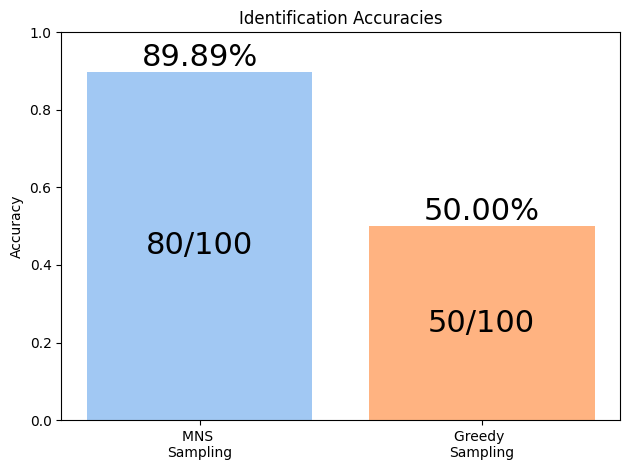

In [17]:
import matplotlib.pyplot as plt

tani_list = variables_to_save["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
greedy_correct = tani_list.count(1)
total_cases = len(tani_list)
accuracy_greedy = greedy_correct / total_cases

# Bar chart for identification accuracies
accuracies = {
    'MNS \nSampling': accuracy_with_correct,
    'Greedy \nSampling': accuracy_greedy
}

# Ratios for annotation
ratios = {
    #'MNS': f'{correct_identifications}/{total_cases_with_correct_answer}',
    'MNS': f'{correct_identifications}/{total_cases}',
    'Greedy Sampling': f'{greedy_correct}/{total_cases}'
}

fig, ax = plt.subplots()
bars = ax.bar(accuracies.keys(), accuracies.values(), color=['#A1C8F3',  '#FFB381'])  # LightBlue, LightGreen

ax.set_ylabel('Accuracy')
ax.set_title('Identification Accuracies')
ax.set_ylim(0, 1)

# Annotate bars with accuracy percentages on top of the bar
for bar, (label, ratio) in zip(bars, ratios.items()):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height,
            f'{height:.2%}',
            ha='center', va='bottom', fontsize=22)

# Annotate bars with ratios inside the bar
for bar, (label, ratio) in zip(bars, ratios.items()):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height / 2,
            f'{ratio}',
            ha='center', va='center', fontsize=22, color='black')

plt.tight_layout()

# Define the file path for saving the plot
output_path = os.path.abspath('./_FIGURES/7.0_identification_accuracies_new_2.png')

# Save the plot
plt.savefig(output_path, bbox_inches='tight')
plt.show()

#### 4.7 ZINC 4000 MNS Experiment

In [25]:
ranking_method = 'HSQC'
pkl_folder= os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000")
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
accuracies = exp_func.calculate_top_k_accuracy(all_rankings)
accuracies = accuracies[:-2]

/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000/20241022_044832_before_sim_data_3288_0.pkl
Processed 3992 unique molecules


In [24]:
all_rankings

defaultdict(list,
            {'Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1': [('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               1.0,
               0,
               0.0023562599879555584,
               0.0075867250930982885),
              ('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(C)CC(=O)N(C)CCN1CCCC1',
               0.8181818181818182,
               1,
               0.015084218603031356,
               0.017568435408505473),
              ('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(CCN(C)C)C(=O)CN1CCCC1',
               0.5490196078431373,
               2,
               0.01605203280439599,
               0.016602823031718852),
              ('Cc1ccccc1CN(C)C(=O)CN(C)CCN1CCCC1',
               'Cc1ccccc1CN(CCN1CCCC1)CC(=O)N(C)C',
               0.6666666666666666,
               3,
               0.016274793631373352,
               0.013813744589792986),
              ('Cc1ccccc1CN(C)C

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Increase default font sizes
plt.rcParams.update({'font.size': 22})  # Base font size
plt.rcParams['axes.titlesize'] = 22
plt.rcParams['axes.labelsize'] = 22
plt.rcParams['xtick.labelsize'] = 22
plt.rcParams['ytick.labelsize'] = 22

# Data
labels = ['Top 1', 'Top 3', 'Top 5', 'Top 10']

# Calculate molecules for each accuracy
total_molecules = 4000
processed_molecules = 3992
failed_molecules = total_molecules - processed_molecules
molecules = [int(acc * processed_molecules) for acc in accuracies]
all_molecules = molecules + [failed_molecules]
all_labels = labels + ['Failed']

# Different colors for each bar
colors = ['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF99CC']

# Create the bar plot
fig, ax = plt.subplots(figsize=(12, 6))
bars = ax.bar(range(len(all_molecules)), all_molecules, color=colors)

# Set black edges for all bars
for bar in bars:
    bar.set_edgecolor('black')
    
# Customize the plot
ax.set_xticks(range(len(all_labels)))
ax.set_xticklabels(all_labels, fontsize=22)
ax.set_ylabel('Number of Molecules', fontsize=22)
ax.set_title('Prediction Accuracy by Top-K (Total Molecules: 4000)', fontsize=22, pad=20)

# Add value labels on top and inside of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    if i < len(accuracies):  # For accuracy bars
        percentage = accuracies[i] * 100
        # Percentage on top
        ax.text(bar.get_x() + bar.get_width()/2., height + 50,
                f'{percentage:.1f}%',
                ha='center', va='bottom', fontsize=22)
        # Number inside bar
        ax.text(bar.get_x() + bar.get_width()/2., height/2,
                f'{int(height)}',
                ha='center', va='center', fontsize=22, color='black')
    else:  # For failed molecules bar
        percentage = (height/total_molecules) * 100
        # Percentage on top - moved higher for failed bar
        ax.text(bar.get_x() + bar.get_width()/2., height + 200,
                f'{percentage:.1f}%',
                ha='center', va='bottom', fontsize=22)
        # Number inside bar - moved higher for failed bar
        ax.text(bar.get_x() + bar.get_width()/2., height + 100,
                f'{int(height)}',
                ha='center', va='center', fontsize=22, color='black')
        
# Add grid for better readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis limit to accommodate labels
ax.set_ylim(0, max(all_molecules) + 400)
#ax.set_ylim(0, 4100)

# Adjust layout to prevent label cutoff
plt.tight_layout()

#plt.show()
# Save the plot
save_path = os.path.abspath("./_FIGURES/ZINC4000_accuracy_plot.png")
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"Plot saved to: {save_path}")

Plot saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/ZINC4000_accuracy_plot.png


#### 4.8 Probabilty analysis

##### Data processing

In [64]:
import os
import pickle
from typing import List, Tuple

def process_pkl_files(folder_path: str) -> Tuple[List[float], List[float]]:
    """
    Process PKL files in the specified folder and separate molecules based on correctness.
    
    Args:
        folder_path (str): Path to the folder containing PKL files
        
    Returns:
        Tuple[List[float], List[float]]: Two lists containing correct and incorrect molecules
    """
    # Lists to store correct and incorrect molecules
    correct_molecules = []
    incorrect_molecules = []
    
    # Get all PKL files in the folder
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl')]
    
    # Process each PKL file
    for idx, pkl_file in enumerate(pkl_files[:]):
        # print( idx, len(correct_molecules), len(incorrect_molecules), pkl_file )
        try:
            with open(pkl_file, 'rb') as f:
                data = pickle.load(f)
            
            # Access the results dictionary
            results_dict = data["results_dict_bl_ZINC"]
            
            # Process each molecule in the results
            for smiles, molecule_data in results_dict.items():
                # Get the first item's data
                first_molecule = molecule_data[0][0]
                # Check if the length is at least 6 to safely access index 4
                if len(first_molecule) >= 6:
                    correctness_value = first_molecule[4]  # Fifth item (index 4)
                    
                    # Store the tensor values based on correctness
                    tensor_values = first_molecule[3]  # Fourth item (index 3)
                    
                    # Convert tensor to list if it's a tensor
                    if hasattr(tensor_values, 'tolist'):
                        tensor_values = tensor_values.tolist()
                    
                    # Classify based on correctness value
                    if correctness_value == 1.0:
                        correct_molecules.append(first_molecule)
                        #print(idx,len(correct_molecules)+len(incorrect_molecules))
                    else:
                        incorrect_molecules.append(first_molecule)
                       # print(idx,len(correct_molecules)+len(incorrect_molecules))
                    break
        except Exception as e:
            print(f"Error processing file {pkl_file}: {str(e)}")
            continue
    
    return correct_molecules, incorrect_molecules

def analyze_results(correct_molecules: List[float], incorrect_molecules: List[float]) -> None:
    """
    Print analysis of the processed molecules.
    
    Args:
        correct_molecules (List[float]): List of correct molecule values
        incorrect_molecules (List[float]): List of incorrect molecule values
    """
    print(f"\nAnalysis Results:")
    print(f"Number of correct molecules: {len(correct_molecules)}")
    print(f"Number of incorrect molecules: {len(incorrect_molecules)}")
    
# Example usage:
if __name__ == "__main__":
    # Example folder path
    folder_path = os.path.abspath("./past_experiments/ChemXriv/4.0_Experiment_Multinomial_Sampling/Experiment_baseline_PC_ZINC/ZINC_250_350_4000")
    
    # Process the files
    correct_molecules, incorrect_molecules = process_pkl_files(folder_path)
    
    # Analyze the results
    analyze_results(correct_molecules, incorrect_molecules)


Analysis Results:
Number of correct molecules: 3622
Number of incorrect molecules: 377


In [65]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np


def extract_minimum_props(molecules_list):
    """
    Extract minimum probability values from tensor data in molecules list.
    
    Args:
        molecules_list (list): List of molecule data where each item contains a tensor
        
    Returns:
        list: List of minimum probability values
    """
    minimum_props = []
    
    for molecule in molecules_list:
        # Get the tensor (fourth item, index 3)
        tensor_data = molecule[3]
        
        # Convert tensor to list if it's not already
        if hasattr(tensor_data, 'tolist'):
            tensor_values = tensor_data.tolist()
        else:
            tensor_values = tensor_data
            
        # Get the minimum value
        min_value = min(tensor_values)
        minimum_props.append(min_value)
    
    return minimum_props

# Example usage:
correct_min_props = extract_minimum_props(correct_molecules)
incorrect_min_props = extract_minimum_props(incorrect_molecules)

# Print some basic statistics
print(f"Number of correct molecules processed: {len(correct_min_props)}")
print(f"Number of incorrect molecules processed: {len(incorrect_min_props)}")


def plot_probability_distribution(correct_props, incorrect_props, max_samples=300):
    """
    Create a box plot with enhanced styling for probability distributions.
    
    Args:
        correct_props (list): List of probability values for correct molecules
        incorrect_props (list): List of probability values for incorrect molecules
        max_samples (int): Maximum number of samples to plot for each category
    """
    # Sample data if needed
    if len(correct_props) > max_samples:
        correct_props = np.random.choice(correct_props, max_samples, replace=False)
    if len(incorrect_props) > max_samples:
        incorrect_props = np.random.choice(incorrect_props, max_samples, replace=False)
    
    # Define colors
    colors = ['#8CB0FE', '#F39878']
    
    # Create figure and axis with larger size
    plt.figure(figsize=(10, 8))
    
    # Create box plot with wider boxes
    data = [correct_props, incorrect_props]
    box_plot = plt.boxplot(data, 
                          labels=['Correct', 'Incorrect'], 
                          patch_artist=True,
                          widths=0.7,
                          medianprops=dict(color="black", linewidth=2),
                          flierprops=dict(marker='o', markerfacecolor='gray'),
                          boxprops=dict(linewidth=2))
    
    # Add more padding to the plot
    plt.margins(x=0.2)
    
    # Customize axis limits for more vertical space
    plt.ylim(0, 1.1)
    
    # Customize the plot with larger font sizes
    plt.ylabel('Minimum Token Probability', labelpad=21, fontsize=22)
    
    # Increase tick label sizes
    plt.xticks(fontsize=21)
    plt.yticks(fontsize=21)
    
    # Customize box plot colors with higher fill opacity
    for box, color in zip(box_plot['boxes'], colors):
        box.set(facecolor=color, alpha=0.8)
    
    # Add individual points with jitter, matching the box colors
    for i, (data_points, color) in enumerate(zip([correct_props, incorrect_props], colors), 1):
        # Add jitter to x-coordinates
        x = np.random.normal(i, 0.08, size=len(data_points))
        
        # Plot points with edge color
        plt.scatter(x, data_points, 
                   c=[color],  # Fill color
                   edgecolors='#404040',  # Dark gray edge
                   linewidth=1,  # Edge width
                   alpha=0.6,  # Slightly higher alpha for better visibility
                   s=100)  # Slightly larger points
    
    # Add grid for better readability
    plt.grid(True, axis='y', linestyle='--', alpha=0.3)
    
    # Adjust layout to prevent cutting off
    plt.tight_layout()
    
    # Save the plot
    save_path = os.path.abspath("./_FIGURES/ZINC4000_min_prob.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()    
    
    # Print summary statistics
    print("\nSummary Statistics (based on full dataset):")
    print("\nCorrect molecules minimum probabilities:")
    print(f"Mean: {np.mean(correct_props):.4f}")
    print(f"Median: {np.median(correct_props):.4f}")
    print(f"Std Dev: {np.std(correct_props):.4f}")
    print(f"Number of samples plotted: {len(correct_props)}")

    print("\nIncorrect molecules minimum probabilities:")
    print(f"Mean: {np.mean(incorrect_props):.4f}")
    print(f"Median: {np.median(incorrect_props):.4f}")
    print(f"Std Dev: {np.std(incorrect_props):.4f}")
    print(f"Number of samples plotted: {len(incorrect_props)}")

# Example usage:
plot_probability_distribution(correct_min_props, incorrect_min_props, max_samples=300)

Number of correct molecules processed: 3622
Number of incorrect molecules processed: 377

Summary Statistics (based on full dataset):

Correct molecules minimum probabilities:
Mean: 0.6345
Median: 0.7113
Std Dev: 0.3300
Number of samples plotted: 300

Incorrect molecules minimum probabilities:
Mean: 0.1921
Median: 0.1453
Std Dev: 0.1781
Number of samples plotted: 300


In [ ]:
ranking_method = 'HSQC'
all_rankings = exp_func.process_pkl_files_baseline(pkl_folder, ranking_method)

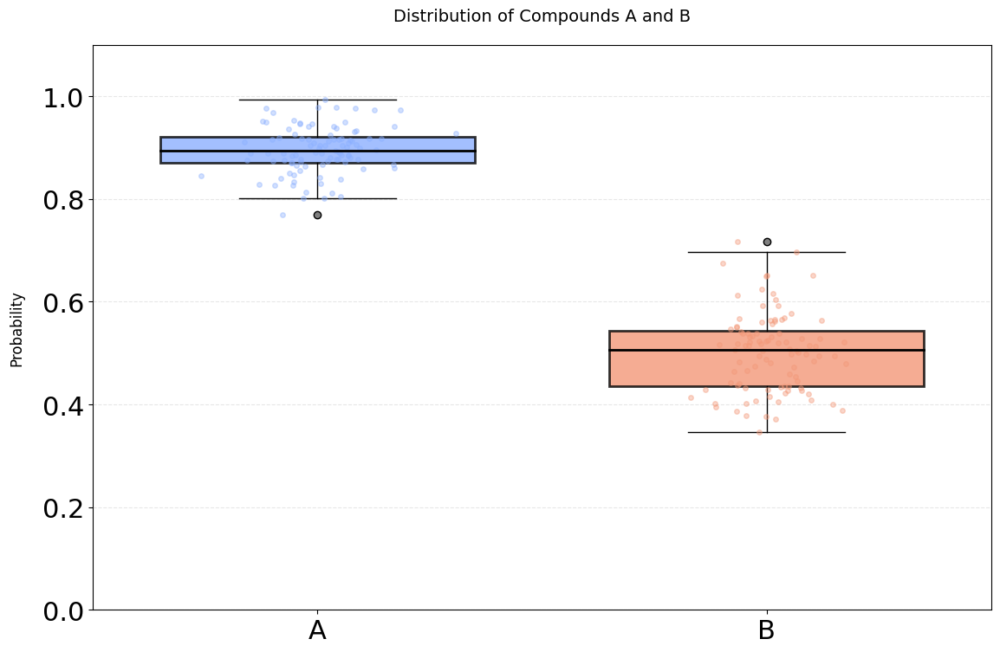


Summary Statistics:

Compound A:
Mean: 0.895
Median: 0.894
Std Dev: 0.045

Compound B:
Mean: 0.502
Median: 0.507
Std Dev: 0.076

First few rows of the generated data:
   Compound A  Compound B
0    0.924836    0.386770
1    0.893087    0.466348
2    0.932384    0.472583
3    0.976151    0.435818
4    0.888292    0.487097


In [63]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Set random seed for reproducibility
np.random.seed(42)

# Generate random data
# For compound A: mean = 0.9, std = 0.05
compound_a = np.random.normal(loc=0.9, scale=0.05, size=100)
compound_a = np.clip(compound_a, 0, 1)

# For compound B: mean = 0.5, std = 0.08
compound_b = np.random.normal(loc=0.5, scale=0.08, size=100)
compound_b = np.clip(compound_b, 0, 1)

# Define colors
colors = ['#8CB0FE', '#F39878']

# Create figure and axis with larger size
plt.figure(figsize=(12, 8))

# Create box plot with wider boxes
data = [compound_a, compound_b]
box_plot = plt.boxplot(data, 
                      labels=['A', 'B'], 
                      patch_artist=True,
                      widths=0.7,  # Make boxes wider
                      medianprops=dict(color="black", linewidth=2),  # Make median line more visible
                      flierprops=dict(marker='o', markerfacecolor='gray'),  # Customize outlier points
                      boxprops=dict(linewidth=2))  # Make box borders more visible

# Add more padding to the plot
plt.margins(x=0.2)  # Add horizontal padding

# Customize axis limits for more vertical space
plt.ylim(0, 1.1)  # Adjust vertical limits

# Customize the plot
plt.title('Distribution of Compounds A and B', pad=20, fontsize=14)
plt.ylabel('Probability', labelpad=15, fontsize=12)

# Customize box plot colors with higher fill opacity
for box, color in zip(box_plot['boxes'], colors):
    box.set(facecolor=color, alpha=0.8)  # Increased opacity
    
# Add individual points with jitter, matching the box colors
for i, (compound, color) in enumerate(zip([compound_a, compound_b], colors), 1):
    # Add jitter to x-coordinates with slightly wider spread
    x = np.random.normal(i, 0.08, size=len(compound))  # Increased jitter spread
    plt.plot(x, compound, '.', color=color, alpha=0.4, markersize=8)  # Larger points

# Add grid for better readability
plt.grid(True, axis='y', linestyle='--', alpha=0.3)

# Adjust layout to prevent cutting off
plt.tight_layout()

plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print("\nCompound A:")
print(f"Mean: {np.mean(compound_a):.3f}")
print(f"Median: {np.median(compound_a):.3f}")
print(f"Std Dev: {np.std(compound_a):.3f}")

print("\nCompound B:")
print(f"Mean: {np.mean(compound_b):.3f}")
print(f"Median: {np.median(compound_b):.3f}")
print(f"Std Dev: {np.std(compound_b):.3f}")

# Create DataFrame with the data
df = pd.DataFrame({
    'Compound A': compound_a,
    'Compound B': compound_b
})

print("\nFirst few rows of the generated data:")
print(df.head())

### 5.0 Test Improvement cycle 

#### 5.1 Fine Tune on all the molecules that I want to investigate

In [ ]:
config.project = "Improv_Cycle_v3" # Name of the project for wandb monitoring
config.csv_train_path = os.path.abspath('./data/ZINK_dataset/ML_NMR_5M_XL_1H_comb_train_V8.csv') 
config.csv_1H_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.csv_13C_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_13C_test_10x100.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_HSQC_test_10x100.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_5M_XL_COSY_test_10x100.csv')  
config.csv_path_val = os.path.abspath('./data/ZINK_dataset/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.pickle_file_path = os.path.abspath('./data/ZINK_dataset/val_data_all_moldalities/ML_NMR_1H_combined_ZINC_test_10x100_955629.pkl')

#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_185242.pkl")

# V8 Raw 
#config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/IR_data")

#config.IR_data_folder = ""
config.IR_data_folder = os.path.abspath("./data/ZINK_dataset/IR_spectra_NN")

#  8Vi Raw Drop
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")

config.data_size = 100 # config.test_size # why would I do that? 
#config.data_size = 4 # config.test_size # why would I do that? 
config.execution_type = "test_performance"
config.multinom_runs = 1
#config.multinom_runs = 3
config.temperature = 1
greedy_full = False
MW_filter = True
config.MF_generations = 50
config.MF_delta_weight = 20
config.max_scaffold_generations = 30


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)
    #model_BLIP = mrtf.load_BLIP_model(config)
    #model_MMT = model_CLIP.MT_model
    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [35]:
#Select the samples that did not succeed to get right
filtered_results = [key for key, value in results_dict_bl_ZINC.items()]
filtered_results

['CCCNC(=O)CNC(=O)c1ccc(N(CC)C(C)C)cc1',
 'O=C(NC1C2CN(C(=O)C3CC3)CC21)C1CCC(C(F)(F)F)C1',
 'CN1CCCC1c1cc(C(=O)N(CC2CC2)C2CC2)n[nH]1',
 'Cc1nc(C)c(CN(C)CC2CCN(C(=O)CC3CC3)C2)o1',
 'CCc1ccc(CN2CCCC2CNC(=O)C(C(C)C)N(C)C)cc1',
 'COc1ccc(CNCC(N2CCOCC2)C(F)(F)F)cc1O',
 'N#CCCCCNc1ccccc1S(N)(=O)=O',
 'O=C(NCC1CN(CC2CC2)CCO1)c1nc2ccccn2c1F',
 'COc1ccc2cc(C(C)Nc3ccn(CC(N)=O)n3)ccc2c1',
 'CCSCCC(=O)NC(C)C1CCN(C(=O)c2cc(F)c[nH]2)C1',
 'CC(NC(=O)C1CC1)C1CCCCN1C(=O)c1nc[nH]c2nccc1-2',
 'CCC(CNC(=O)C1(SC)CCC1)NC(=O)C1(SC)CCC1',
 'Cn1ncc2c1CC(C(=O)NCC1(NC(=O)CC3CC3)CCC1)CC2',
 'CCC(NC(=O)CCNC(=O)CC(C)C)C1CC1(C)C',
 'OC1CCCCC1C1CCCCN1Cc1nnc(C2CC2)o1',
 'CC1CC(N)CN1C(=O)Nc1ccc(C#N)c(C(F)(F)F)c1',
 'CCC(C)(C)C(=O)N1CCC(N(C)Cc2noc(CCOC)n2)C1',
 'COc1cc(Br)cnc1CN1CCCC12COC2',
 'CN1CCCCC1C(=O)NC1CCCN(Cc2ncccn2)C1',
 'O=C(NCC1CCCN1CCC1CCOC1)C1CC2CC2C1',
 'CCCCOC(C)C(=O)NCCCNCc1cn(C)nc1C',
 'CC(Cc1cnccn1)NCCCOc1ccc(C(F)(F)F)cn1',
 'CCOC1CC(CC(=O)N2CCC(CNC(=O)c3cccnc3)C2)C1',
 'CCn1cc(CC(=O)NCC(NCc2cc(C)on2)

In [ ]:
# Create a DataFrame
data = {
    "SMILES": filtered_results,
    "sample-id": [f"SOURCE_00000{i+1}" for i in range(len(filtered_results))]
}

df = pd.DataFrame(data)

# Save DataFrame to CSV
csv_file_path = os.path.abspath('./deep-molecular-optimization/deep-molecular-optimization/data/MMP/test_selection_2.csv'
df.to_csv(csv_file_path, index=False)
csv_path_val_backup = config.csv_path_val
pickle_file_path_backup = config.pickle_file_path

print(f"CSV file '{csv_file_path}' created successfully.")

CSV file '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/deep-molecular-optimization/data/MMP/test_selection_2.csv' created successfully.


In [ ]:
config.execution_type = "SMI_generation_MF"

if config.execution_type == "SMI_generation_MF":
    config.n_samples = config.data_size
    #if config.execution_type == "SMI_generation_MF":
    print("\033[1m\033[31mThis is: SMI_generation_MF\033[0m")
    config.csv_path_val  = ex.filter_invalid_criteria(config.csv_path_val)#, config.csv_path_val)
    config, results_dict_MF = ex.SMI_generation_MF(config, stoi, stoi_MF, itos, itos_MF)
    #mode = "val"

    # Iterate through the dictionary and remove 'nan' from lists
    results_dict_MF = {key: value for key, value in results_dict_MF.items() if not hf.contains_only_nan(value)}
    for key, value in results_dict_MF.items():
        results_dict_MF[key] = hf.remove_nan_from_list(value)

    combined_list_MF, html_TSNE, html_UMAP, html_PCA = cv.plot_cluster_MF(results_dict_MF, config)
    max_num = 10
    html_plot = pt.plot_molecules_from_list(combined_list_MF, max_num)
    config.execution_type = "combine_MMT_MF"
    #import IPython; IPython.embed();
    print(config.data_size)


In [38]:
config.execution_type = "combine_MMT_MF"
combined_list_MMT = []
if config.execution_type == "combine_MMT_MF":
    print("\033[1m\033[31mThis is: combine_MMT_MF\033[0m")
    all_gen_smis = combined_list_MMT + combined_list_MF
    combined_list_MF = [smiles for smiles in combined_list_MF if smiles != 'NAN']
    all_gen_smis = [smiles for smiles in all_gen_smis if smiles != 'NAN']
    
    #filter out potential hits from the real test_set
    val_data = pd.read_csv(config.csv_path_val)
    all_gen_smis = mrtf.filter_smiles(val_data, all_gen_smis)
    length_of_list = len(all_gen_smis)   
    random_number_strings = [f"GT_{str(i).zfill(7)}" for i in range(1, length_of_list + 1)]
    aug_mol_df = pd.DataFrame({'SMILES': all_gen_smis, 'sample-id': random_number_strings})
    config.execution_type = "blend_prev_train_data"


This is: combine_MMT_MF


In [39]:
config.train_data_blend = 0
config.execution_type = "blend_prev_train_data"
if config.execution_type == "blend_prev_train_data":
    print("\033[1m\033[31mThis is: blend_prev_train_data\033[0m")
    config, final_df = ex.blend_aug_with_train_data(config, aug_mol_df)
    config.execution_type = "data_generation"
    #import IPython; IPython.embed();


This is: blend_prev_train_data
/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/24_SGNN_gen_folder_2/51059.csv


In [ ]:
config.execution_type = "data_generation"
if config.execution_type == "data_generation":
    #config.csv_SMI_targets = config.csv_1H_path_SGNN
    print("\033[1m\033[31mThis is: data_generation\033[0m")
    config = ex.gen_sim_aug_data(config, IR_config)
    config.execution_type = "transformer_improvement"
    sim_data_gen = True
    #import IPython; IPython.embed();

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'all_gen_smis': all_gen_smis,
    'aug_mol_df': aug_mol_df,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240516_Improvment_Cycle_v2/6.2_imp_cyc_all_100_50.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)


In [44]:
# config.csv_SMI_targets = config.csv_1H_path_SGNN
# data_IR = irs.run_IR_simulation(config, IR_config, "target")
# config.IR_data_folder = data_IR


In [ ]:
config.blank_percentage = 0
config.weight_MW = 0
config.lr_pretraining = 1e-4
config.tr_te_split = 0.9
config.model_save_dir = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/imp_cyc_all_100_50_v2") # Folder where networks are saved
data_size = len(pd.read_csv(config.csv_1H_path_SGNN))
config.data_size = data_size
config.gpu_num = 1
config.batch_size = 64
config.num_epochs = 50

In [ ]:
config.execution_type = "transformer_improvement"
sim_data_gen = True

if config.execution_type == "transformer_improvement" and sim_data_gen == True:
    print("\033[1m\033[31mThis is: transformer_improvement, sim_data_gen == TRUE\033[0m")
    config.training_setup = "pretraining"
    mtf.run_MMT(config, stoi, stoi_MF)

    # config.execution_type = "clip_improvement"
    config.execution_type = "update_model"
    # finish_while = True
    #import IPython; IPython.embed();


In [ ]:
config.csv_train_path = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/ML_NMR_5M_XL_1H_comb_train_V8.csv') 
config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_5M_XL_13C_test_10x100.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_5M_XL_HSQC_test_10x100.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_5M_XL_COSY_test_10x100.csv')  
config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100.csv')
config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/val_data_all_modalities/ML_NMR_1H_combined_ZINC_test_10x100_909434.pkl")

#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_185242.pkl")

# V8 Raw 
#config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/IR_data")

#config.IR_data_folder = ""
config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/15_ZINC270M/IR_spectra_NN")

# V8i Raw Drop
config.checkpoint_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/V8i_MMT_Drop4/MultimodalTransformer_time_1710027004.1571195_Loss_0.112.ckpt")

config.data_size = 100 
config.execution_type = "test_performance"
config.multinom_runs = 1
config.temperature = 1
greedy_full = False
MW_filter = True
config.MF_generations = 50


In [48]:
config = ex.update_model_path(config)

/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/1_old_models/models_v2/imp_cyc_all_100_50_v2/model-epoch=49-loss=0.00.ckpt


This is: test_performance
Pickle Loaded.
Pickle Loaded.
0
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
10
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
20
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
30
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
5 0 1.4000000000000004
6 0 1.5000000000000004
1 0 1
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
40
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
5 0 1.4000000000000004
6 0 1.5000000000000004
7 0 1.6000000000000005
8 0 1.7000000000000006
9 0 1.8000000000000007
10 0 1.9000000000000008
1 0 1
1 0 1
2 0 1.1
3 0 1.2000000000000002
4 0 1.3000000000000003
5 0 1.4000000000000004
6 0 1.5000000000000004
7 0 1.6000000000000005
8 0 1.7000000000000006
9 0 1.8000000000000007
10 0 1.9000000000000008
11 0 2.000000000000001
12 0 2.100000000000001
13 0 2.20000000000

100%|██████████| 100/100 [00:00<00:00, 221101.95it/s]


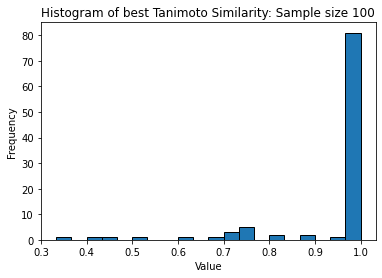

100%|██████████| 100/100 [00:46<00:00,  2.13it/s]

avg_tani, avg_tani_greedy, corr_sampleing_prob'
0.9423105742504405 0.918885 0.7095526923729778


In [49]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)

    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [50]:
# Select the samples that did not succeed to get right
filtered_results = [key for key, value in results_dict_bl_ZINC.items()]
# filtered_results

['CCCNC(=O)CNC(=O)c1ccc(N(CC)C(C)C)cc1',
 'O=C(NC1C2CN(C(=O)C3CC3)CC21)C1CCC(C(F)(F)F)C1',
 'CN1CCCC1c1cc(C(=O)N(CC2CC2)C2CC2)n[nH]1',
 'Cc1nc(C)c(CN(C)CC2CCN(C(=O)CC3CC3)C2)o1',
 'CCc1ccc(CN2CCCC2CNC(=O)C(C(C)C)N(C)C)cc1',
 'COc1ccc(CNCC(N2CCOCC2)C(F)(F)F)cc1O',
 'N#CCCCCNc1ccccc1S(N)(=O)=O',
 'O=C(NCC1CN(CC2CC2)CCO1)c1nc2ccccn2c1F',
 'COc1ccc2cc(C(C)Nc3ccn(CC(N)=O)n3)ccc2c1',
 'CCSCCC(=O)NC(C)C1CCN(C(=O)c2cc(F)c[nH]2)C1',
 'CC(NC(=O)C1CC1)C1CCCCN1C(=O)c1nc[nH]c2nccc1-2',
 'CCC(CNC(=O)C1(SC)CCC1)NC(=O)C1(SC)CCC1',
 'Cn1ncc2c1CC(C(=O)NCC1(NC(=O)CC3CC3)CCC1)CC2',
 'CCC(NC(=O)CCNC(=O)CC(C)C)C1CC1(C)C',
 'OC1CCCCC1C1CCCCN1Cc1nnc(C2CC2)o1',
 'CC1CC(N)CN1C(=O)Nc1ccc(C#N)c(C(F)(F)F)c1',
 'CCC(C)(C)C(=O)N1CCC(N(C)Cc2noc(CCOC)n2)C1',
 'COc1cc(Br)cnc1CN1CCCC12COC2',
 'CN1CCCCC1C(=O)NC1CCCN(Cc2ncccn2)C1',
 'O=C(NCC1CCCN1CCC1CCOC1)C1CC2CC2C1',
 'CCCCOC(C)C(=O)NCCCNCc1cn(C)nc1C',
 'CC(Cc1cnccn1)NCCCOc1ccc(C(F)(F)F)cn1',
 'CCOC1CC(CC(=O)N2CCC(CNC(=O)c3cccnc3)C2)C1',
 'CCn1cc(CC(=O)NCC(NCc2cc(C)on2)

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240516_Improvment_Cycle_v2/6.2_imp_cyc_all_100_50_after.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)


In [52]:

config.data_size = 100 
config.execution_type = "test_performance"
config.multinom_runs = 1
config.multinom_runs = 3
config.temperature = 1
greedy_full = False
MW_filter = True



This is: test_performance
Pickle Loaded.
Pickle Loaded.
0
1 0 1
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
1 0 1
2 1 1.1
3 1 1.2000000000000002
4 1 1.3000000000000003
5 1 1.4000000000000004
6 1 1.5000000000000004
7 1 1.6000000000000005
8 1 1.7000000000000006
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
5 2 1.4000000000000004
6 2 1.5000000000000004
1 0 1
2 1 1.1
3 1 1.2000000000000002
4 1 1.3000000000000003
5 1 1.4000000000000004
6 2 1.5000000000000004
7 2 1.6000000000000005
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
5 2 1.4000000000000004
1 0 1
1 0 1
2 1 1.1
3 1 1.2000000000000002
4 1 1.3000000000000003
5 1 1.4000000000000004
6 1 1.5000000000000004
7 1 1.6000000000000005
8 1 1.7000000000000006
9 1 1.8000000000000007
10 1 1.9000000000000008
11 1 2.000000000000001
12 1 2.100000000000001
1 0 1
2 1 1.1
3 2 1.2000000000000002
4 2 1.3000000000000003
5 2 1.4000000000000004
6 2 1.5000000000000004
1 0 1
2 2 1.1
3 2 1.2000000000000002
4 2 1.300000

100%|██████████| 100/100 [00:00<00:00, 291068.98it/s]


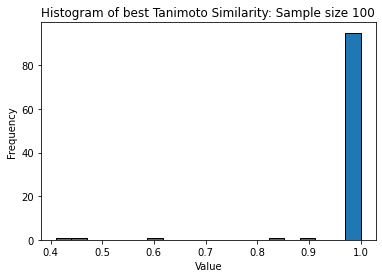

100%|██████████| 100/100 [00:50<00:00,  1.98it/s]

avg_tani, avg_tani_greedy, corr_sampleing_prob'
0.9820199972295285 0.918885 0.7095526923729778


In [53]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)

    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [54]:
#Select the samples that did not succeed to get right
filtered_results = [key for key, value in results_dict_bl_ZINC.items() if value[0][0][-2] != 1]
#filtered_results

['Cn1ncc2c1CC(C(=O)NCC1(NC(=O)CC3CC3)CCC1)CC2',
 'Cc1ccc(C(=O)N2CC(C(C)NC(=O)c3occc3C)C2)nc1C',
 'O=C1CCC(=O)N1CCC(=O)N1CCCCC1C1CCCCC1O',
 'CCc1cccc(C(=O)OCCN2C(=O)COc3ccccc32)c1O',
 'Cc1nc2cc(C(=O)N(C)C(C)CN)ccc2n1Cc1ccsc1']

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240516_Improvment_Cycle_v2/6.2_imp_cyc_all_100_50_after_MNS_3.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)


In [ ]:
#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_13C_V1_test_350_500_x1000.csv')    
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_HSQC_V1_test_350_500_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_COSY_V1_test_350_500_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_350_500_x1000/ML_NMR_2M_XL_1H_V1_test_f_350_500_x1000_185242.pkl")

#config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_13C_V1_test_0_250_x1000.csv')
#config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_HSQC_V1_test_0_250_x1000.csv')    
#config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_COSY_V1_test_0_250_x1000.csv')   
#config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000.csv')
#config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_0_250_x1000/ML_NMR_2M_XL_1H_V1_test_f_0_250_x1000_933335.pkl")


config.csv_1H_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.csv_13C_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_13C_V1_test_250_350_x1000.csv')    
config.csv_HSQC_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_HSQC_V1_test_250_350_x1000.csv')    
config.csv_COSY_path_SGNN = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_COSY_V1_test_250_350_x1000.csv')   
config.csv_path_val = os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000.csv')
config.pickle_file_path = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/val_data_250_350_x1000/ML_NMR_2M_XL_1H_V1_test_f_250_350_x1000_285005.pkl")

# V8i Raw 
config.IR_data_folder = os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/26_PubChem_dataset/IR_data"


In [ ]:

config.data_size = 100 # config.test_size # why would I do that? 
#config.data_size = 4 # config.test_size # why would I do that? 
config.execution_type = "test_performance"
config.multinom_runs = 1
config.multinom_runs = 1
config.temperature = 1
greedy_full = False
MW_filter = True



In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
if config.execution_type == "test_performance":
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    # config.csv_path_val = config.csv_SMI_targets  #this already got updated in simulate_syn_data
    
    model_MMT = mrtf.load_MMT_model(config)
    model_CLIP = mrtf.load_CLIP_model(config)
    #model_BLIP = mrtf.load_BLIP_model(config)
    #model_MMT = model_CLIP.MT_model
    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")

    
    results_dict_bl_ZINC = mrtf.run_test_mns_performance_CLIP_3(config,  
                                                        model_MMT,
                                                        model_CLIP,
                                                        val_dataloader,
                                                        stoi, 
                                                        itos,
                                                        MW_filter)
    results_dict_bl_ZINC, counter = mrtf.filter_invalid_inputs(results_dict_bl_ZINC)
    
    avg_tani_bl_ZINC, html_plot = rbgvm.plot_hist_of_results(results_dict_bl_ZINC)
    
    # Slow because also just takes one at the time
    if greedy_full == True:
        results_dict_greedy_bl_ZINC, failed_bl_ZINC = mrtf.run_test_performance_CLIP_greedy_3(config,  
                                                                stoi, 
                                                                stoi_MF, 
                                                                itos, 
                                                                itos_MF)

        avg_tani_greedy_bl_ZINC, html_plot_greedy = rbgvm.plot_hist_of_results_greedy(results_dict_greedy_bl_ZINC)

    else: 
        config, results_dict_ZINC_greedy_bl = mrtf.run_greedy_sampling(config, model_MMT, val_dataloader_multi, itos, stoi)
        avg_tani_greedy_bl_ZINC = results_dict_ZINC_greedy_bl["tanimoto_mean"]
    
    total_results_bl_ZINC = mrtf.run_test_performance_CLIP_3(config, 
                                                        model_MMT, 
                                                        val_dataloader,
                                                        stoi)
    
    corr_sampleing_prob_bl_ZINC = total_results_bl_ZINC["statistics_multiplication_avg"][0]
    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(avg_tani_bl_ZINC, avg_tani_greedy_bl_ZINC, corr_sampleing_prob_bl_ZINC)       

    

In [ ]:

# Save variables to a pickle file
variables_to_save = {
    'avg_tani_bl_ZINC': avg_tani_bl_ZINC,
    'results_dict_greedy_bl_ZINC': results_dict_greedy_bl_ZINC if greedy_full else None,
    'failed_bl_ZINC': failed_bl_ZINC if greedy_full else None,
    'avg_tani_greedy_bl_ZINC': avg_tani_greedy_bl_ZINC,
    'results_dict_ZINC_greedy_bl': results_dict_ZINC_greedy_bl if not greedy_full else None,
    'total_results_bl_ZINC': total_results_bl_ZINC,
    'corr_sampleing_prob_bl_ZINC': corr_sampleing_prob_bl_ZINC,
    'filtered_results': filtered_results,
    'results_dict_bl_ZINC': results_dict_bl_ZINC,
}

with open(os.path.abspath('/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/nmr_project/1_Dataexploration/2_paper_code/Experiments_SLURM/20.0_SLURM_MasterTransformer/Figures_Paper_2/precomputed_raw_data/20240520_Improvment_Cycle_PC_v2/6.2_PC_FT_Model_0_250.pkl', 'wb') as f:
    pickle.dump(variables_to_save, f)

#### 5.2 Load ZINC

In [69]:
def mns_tani_extraction(data):
    """
    Extracts the 4th item of the first sublist of the value for each key in the dictionary.

    Parameters:
    data (dict): The input dictionary.

    Returns:
    list: A list containing the 4th item of the first sublist for each key.
    """
    # Initialize an empty list to store the results
    result_list = []

    # Iterate over the dictionary items
    for key, value in data.items():
        # Check if the value is not None and has at least one sublist
        if value and value[0]:
            # Get the 4th item of the first sublist
            item = value[0][0][3]
            # Append the item to the result list
            result_list.append(item)

    # Return the result list
    return result_list

In [ ]:
'''
# 100_10
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
import pickle

file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.1_imp_cyc_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     
'''

##### Load ZINC data experiment

In [70]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_100_v2.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_100_after_MNS_3_v2.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_v3/6.2_imp_cyc_all_100_100_after_MNS_3_v2.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [71]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])

In [72]:
imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"].keys()

dict_keys(['gen_conv_SMI_list', 'trg_conv_SMI_list', 'tanimoto_sim', 'tanimoto_mean', 'tanimoto_std_dev', 'failed', 'prob_list', 'src_HSQC_list'])

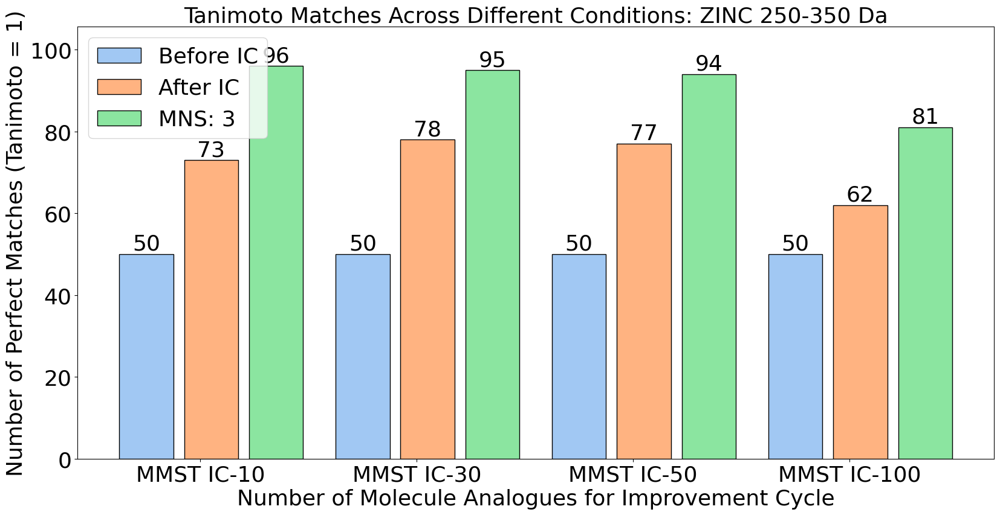

In [73]:

fontsize = 26
tani_data = [
    (tani_before_all_100_10, 'Greedy Tanomoto Before FT10'), (tani_after_all_100_10, 'Greedy Tanomoto After FT10'), (tani_after_all_100_10_mns, '3 Multinomial Sampling After FT10'),
    (tani_before_all_100_30, 'Greedy Tanomoto Before FT30'), (tani_after_all_100_30, 'Greedy Tanomoto After FT30'), (tani_after_all_100_30_mns, '3 Multinomial Sampling After FT30'),
    (tani_before_all_100_50, 'Greedy Tanomoto Before FT50'), (tani_after_all_100_50, 'Greedy Tanomoto After FT50'), (tani_after_all_100_50_mns, '3 Multinomial Sampling After FT50'), 
    (tani_before_all_100_50, 'Greedy Tanomoto Before FT100'), (tani_after_all_100_100, 'Greedy Tanomoto After FT50'), (tani_after_all_100_100_mns, '3 Multinomial Sampling After FT100')
]

# Extract numerical data (count of perfect matches)
numerical_data = [np.sum(np.array(data) == 1.0) for data, _ in tani_data]

# Labels for each group
group_labels = ['MMST IC-10', 'MMST IC-30', 'MMST IC-50', 'MMST IC-100']
condition_labels = ['Before IC', 'After IC', 'MNS: 3']

# Colors for the bars
colors = ['#A1C8F3', '#FFB381', '#8BE5A0']  # Red, Blue, Green

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.25
group_spacing = 0.05

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(3)]

# Create grouped bar plot
for i in range(3):  # Three conditions: Before, After, MNS
    ax.bar(positions[i], numerical_data[i::3], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: ZINC 250-350 Da', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvement Cycle', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + bar_width
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(numerical_data):
    ax.text(positions[i % 3][i // 3], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')
ax.tick_params(axis='y', labelsize=fontsize)
ax.set_ylim(0, max(numerical_data) * 1.1)  # Set y-axis limit to 110% of max value

# Adjust layout and display
plt.tight_layout()

# Specify the path and file name where you want to save the figure.
save_path = './_FIGURES/6.1.2_ZINC_Bar_Chart_Greedy_MNS_Tanimoto_v4.png'
plt.savefig(save_path, format='png', dpi=300)  # Save as PNG with 300 dpi

plt.show()

In [74]:
# Extract the variables

corr_sampleing_prob_bl_ZINC = imp_cyc_all_100_10_before['corr_sampleing_prob_bl_ZINC']
results_dict_ZINC_greedy_bl = imp_cyc_all_100_10_before['results_dict_ZINC_greedy_bl']
results_dict_greedy_bl_ZINC = imp_cyc_all_100_10_before['results_dict_greedy_bl_ZINC']


#avg_tani_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_bl_ZINC']
#failed_bl_ZINC = imp_cyc_all_100_10_before['failed_bl_ZINC']
#avg_tani_greedy_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_greedy_bl_ZINC']
#total_results_bl_ZINC = imp_cyc_all_100_10_before['total_results_bl_ZINC']
#filtered_results = imp_cyc_all_100_10_before['filtered_results']

In [75]:
imp_cyc_all_100_10_before.keys()

dict_keys(['avg_tani_bl_ZINC', 'results_dict_greedy_bl_ZINC', 'failed_bl_ZINC', 'avg_tani_greedy_bl_ZINC', 'results_dict_ZINC_greedy_bl', 'total_results_bl_ZINC', 'corr_sampleing_prob_bl_ZINC', 'filtered_results', 'all_gen_smis', 'aug_mol_df', 'results_dict_bl_ZINC'])

In [76]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]



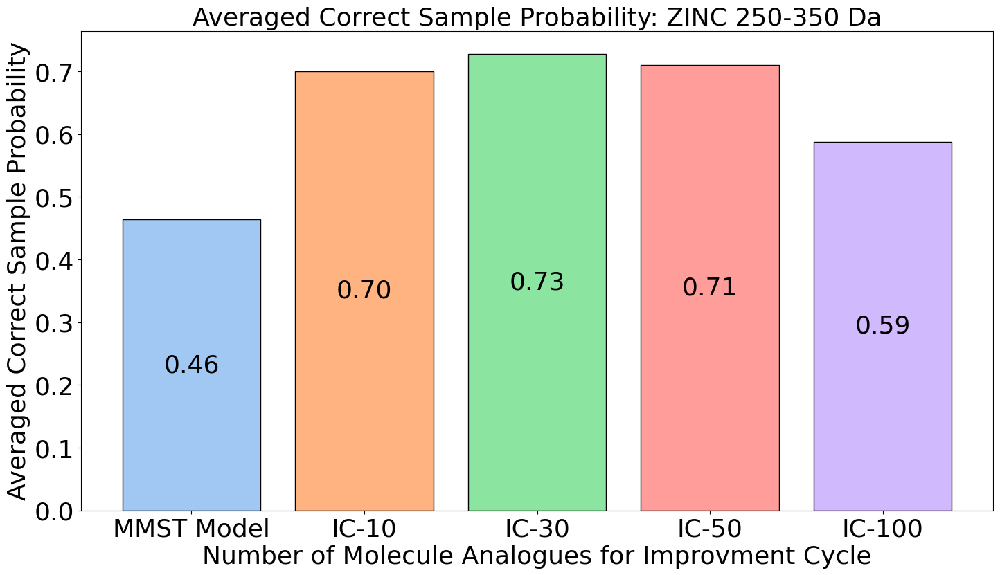

In [78]:

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_sp_after_all_100_10,   # After FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
        '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
      ]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: ZINC 250-350 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

#plt.xlabel('Stages', fontsize=16)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_ZINC_correct_sample_prob_comparison_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


##### Chemical spaces

In [79]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])

In [80]:
results_dict_bl_ZINC_before = imp_cyc_all_100_10_before["results_dict_bl_ZINC"]
filtered_results_false_before = [key for key, value in results_dict_bl_ZINC_before.items() if value[0][0][-2] == 1]
len(filtered_results_false_before)

56

In [81]:
results_dict_bl_ZINC_after = imp_cyc_all_100_10_after["results_dict_bl_ZINC"]
filtered_results_false_after = [key for key, value in results_dict_bl_ZINC_after.items() if value[0][0][-2] == 1]
len(filtered_results_false_after)

87

In [82]:
all_gen_smis = imp_cyc_all_100_10_before["all_gen_smis"]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 87/87 [00:00<00:00, 7173.13it/s]


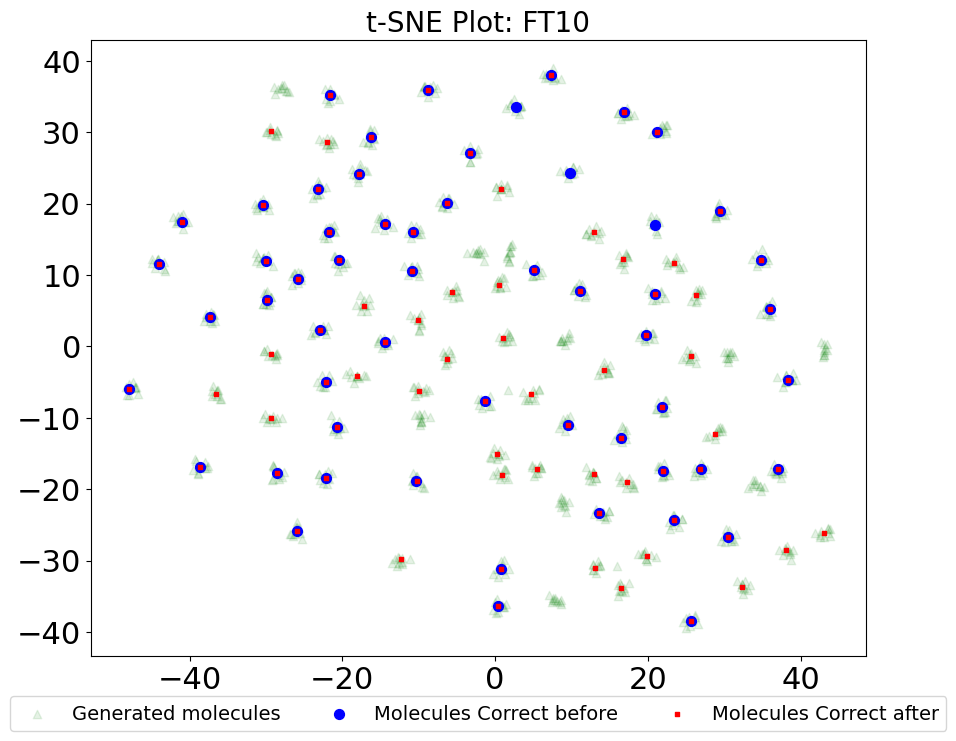

In [83]:
# Convert SMILES to fingerprints
def smiles_to_fps(smiles_list):
    fps = []
    for smiles in tqdm(smiles_list):
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=512)
            fps.append(fp)
    return np.array(fps)

fps1 = smiles_to_fps(filtered_results_false_before)
fps2 = smiles_to_fps(all_gen_smis)
fps3 = smiles_to_fps(filtered_results_false_after)

# Concatenate the two fingerprint arrays
all_fps = np.vstack([fps1, fps2, fps3])

# Dimensionality Reduction: t-SNE
tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(all_fps)

# Dimensionality Reduction: UMAP
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)
X_umap = umap_model.fit_transform(all_fps)

# Dimensionality Reduction: PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(all_fps)


# Plotting function with the legend below the graph
def plot_2D(X, title, label1='Molecules Correct before', label2='Generated molecules', label3='Molecules Correct after'):
    plt.figure(figsize=(10, 8))
    plt.scatter(X[len(fps1):len(fps1)+len(fps2), 0], X[len(fps1):len(fps1)+len(fps2), 1], c='g', marker='^', label=label2, alpha=0.1)
    plt.scatter(X[:len(fps1), 0], X[:len(fps1), 1], c='b', marker='o', label=label1, alpha=1, s=50)
    plt.scatter(X[len(fps1)+len(fps2):, 0], X[len(fps1)+len(fps2):, 1], c='r', marker='s', label=label3, alpha=1, s=10)
    plt.title(title, fontsize=20)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=14)  
    output_path = "./_FIGURES/6.1.2_t-SNE_FT10_v1.png"
    plt.savefig(output_path, bbox_inches='tight')
    plt.show()

# Plot t-SNE
plot_2D(X_tsne, 't-SNE Plot: FT10')

# Plot UMAP
#plot_2D(X_umap, 'UMAP Plot')

# Plot PCA
#plot_2D(X_pca, 'PCA Plot')

#### 6.0 Load PubChem

##### Load PubChem 0-250 v1

In [128]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)

# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [129]:
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_PC_FT_Model_0_250.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    PC_0_250_FT = pickle.load(file)     

In [130]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])
tani_PC_0_250_FT = PC_0_250_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


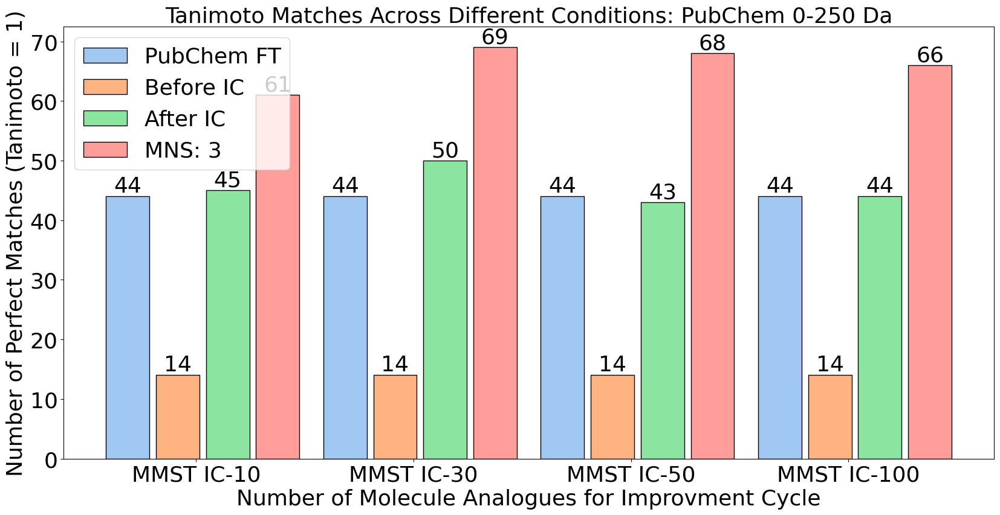

In [131]:

# Data and labels
tani_data = [
    (tani_before_all_100_10, 'FT10 Before'), (tani_after_all_100_10, 'FT10 After'), (tani_after_all_100_10_mns, 'FT10 MNS'),
    (tani_before_all_100_30, 'FT30 Before'), (tani_after_all_100_30, 'FT30 After'), (tani_after_all_100_30_mns, 'FT30 MNS'),
    (tani_before_all_100_50, 'FT50 Before'), (tani_after_all_100_50, 'FT50 After'), (tani_after_all_100_50_mns, 'FT50 MNS'), 
    (tani_before_all_100_100, 'FT100 Before'), (tani_after_all_100_100, 'FT100 After'), (tani_after_all_100_100_mns, 'FT100 MNS')
]

# Add the PubChem Fine-Tuned data
tani_PC_0_250_FT_list = [tani_PC_0_250_FT for _ in range(4)]  # Repeat the data for each group

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]
perfect_matches_pc = [np.sum(np.array(data) == 1) for data in tani_PC_0_250_FT_list]

# Combine all perfect matches
all_perfect_matches = []
for i in range(4):  # For each FT group (10, 30, 50, 100)
    all_perfect_matches.extend([perfect_matches_pc[i]] + perfect_matches[i*3:(i+1)*3])

# Colors for the bars
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]

# Labels
group_labels = ['MMST IC-10', 'MMST IC-30', 'MMST IC-50', 'MMST IC-100']
condition_labels = ['PubChem FT', 'Before IC', 'After IC', 'MNS: 3']

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.2
group_spacing = 0.03

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(4)]

# Create grouped bar plot
for i in range(4):  # Four conditions: PubChem FT, Before, After, MNS
    ax.bar(positions[i], all_perfect_matches[i::4], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem 0-250 Da', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + 1.5 * bar_width + 0.5 * group_spacing
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(all_perfect_matches):
    ax.text(positions[i % 4][i // 4], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')
ax.tick_params(axis='y', labelsize=fontsize)
#ax.set_ylim(0, 105)

# Adjust layout and display
plt.tight_layout()
save_path = os.path.abspath('./_FIGURES/6.2.2_PC_Bar_Chart_Greedy_MNS_Tanimoto_0_250_v4.png')  # Update this path as needed

# Save the figure
plt.savefig(save_path, format='png', dpi=300)  # Save as PNG with 300 dpi

plt.show()

# Uncomment to save the plot
# plt.savefig("/path/to/save/grouped_perfect_matches_bar_plot.png", dpi=300, bbox_inches='tight')

In [132]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]
corr_PC_0_250_FT = PC_0_250_FT["corr_sampleing_prob_bl_ZINC"]


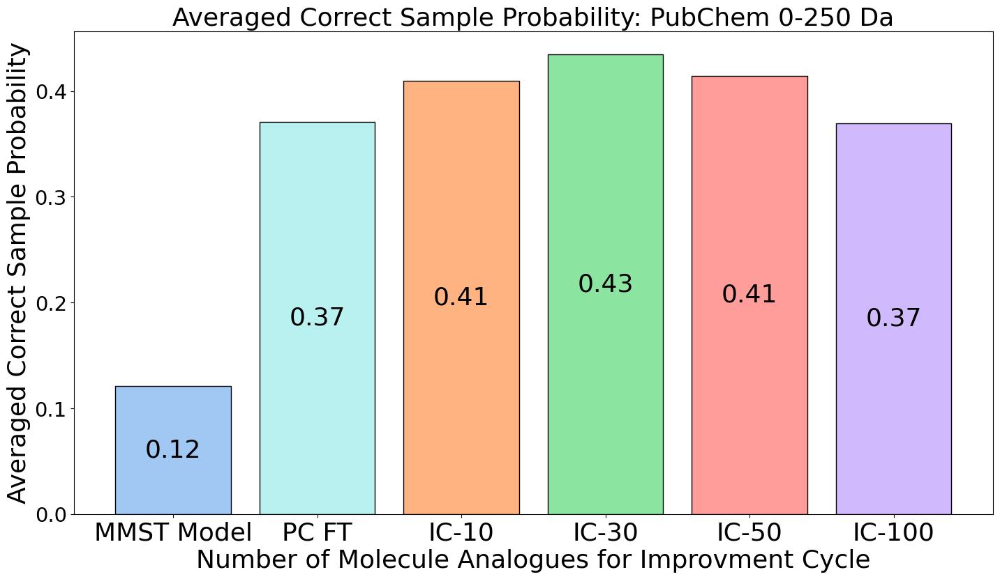

In [134]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_PC_0_250_FT,         # PC FT
    corr_sp_after_all_100_10,   # After FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'PC FT', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#B8F1EF',  # light cyan/aqua
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: PubChem 0-250 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=21)

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_0_250_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


##### Load PubChem 250-350 v2

In [102]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [104]:
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_PC_FT_Model_250_350.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    PC_250_350_FT = pickle.load(file)     

In [105]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])
tani_PC_250_350_FT = PC_250_350_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


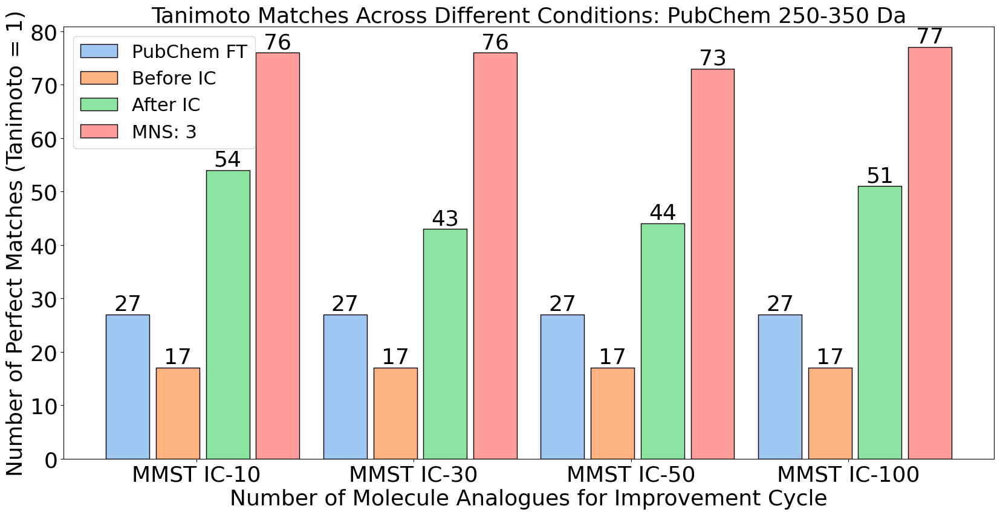

In [106]:

fontsize = 26
# Data and labels
tani_data = [
    (tani_before_all_100_10, 'FT10 Before'), (tani_after_all_100_10, 'FT10 After'), (tani_after_all_100_10_mns, 'FT10 MNS'),
    (tani_before_all_100_30, 'FT30 Before'), (tani_after_all_100_30, 'FT30 After'), (tani_after_all_100_30_mns, 'FT30 MNS'),
    (tani_before_all_100_50, 'FT50 Before'), (tani_after_all_100_50, 'FT50 After'), (tani_after_all_100_50_mns, 'FT50 MNS'), 
    (tani_before_all_100_100, 'FT100 Before'), (tani_after_all_100_100, 'FT100 After'), (tani_after_all_100_100_mns, 'FT100 MNS')
]

# Add the PubChem Fine-Tuned data
tani_PC_250_350_FT_list = [tani_PC_250_350_FT for _ in range(4)]  # Repeat the data for each group

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]
perfect_matches_pc = [np.sum(np.array(data) == 1) for data in tani_PC_250_350_FT_list]

# Combine all perfect matches
all_perfect_matches = []
for i in range(4):  # For each FT group (10, 30, 50, 100)
    all_perfect_matches.extend([perfect_matches_pc[i]] + perfect_matches[i*3:(i+1)*3])

# Colors for the bars
condition_labels = ['PubChem FT', 'Before IC', 'After IC', 'MNS: 3']

# Labels
group_labels = ['MMST IC-10', 'MMST IC-30', 'MMST IC-50', 'MMST IC-100']
colors = [ '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.2
group_spacing = 0.03

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(4)]

# Create grouped bar plot
for i in range(4):  # Four conditions: PubChem FT, Before, After, MNS
    ax.bar(positions[i], all_perfect_matches[i::4], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvement Cycle', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem 250-350 Da', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + 1.5 * bar_width + 0.5 * group_spacing
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Set y-axis tick label font size
ax.tick_params(axis='y', labelsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(all_perfect_matches):
    ax.text(positions[i % 4][i // 4], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=22, loc='upper left')

# Adjust layout and display
plt.tight_layout()

# Save the plot to a specified location
output_path = './_FIGURES/6.2.2_PC_Bar_Chart_Greedy_MNS_Tanimoto_250_350_v3.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [107]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]
corr_PC_250_350_FT = PC_250_350_FT["corr_sampleing_prob_bl_ZINC"]


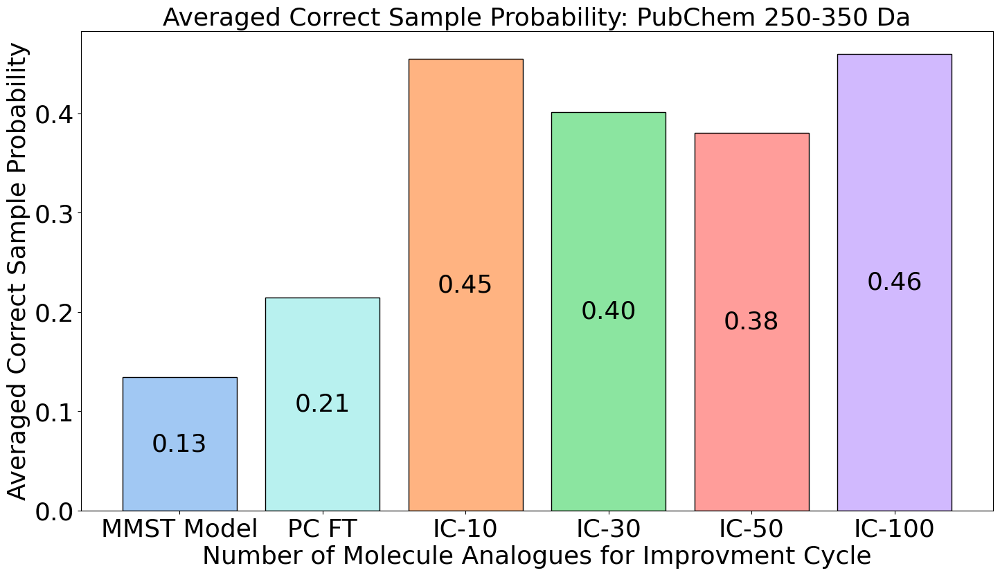

In [109]:

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_PC_250_350_FT,         # PC FT
    corr_sp_after_all_100_10,   # After FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'PC FT', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#B8F1EF',  # light cyan/aqua
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: PubChem 250-350 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_250_350_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


##### Load PubChem 350-500

In [110]:
# 100_10
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns = pickle.load(file)


# 100_30
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_30_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_30_after_mns = pickle.load(file) 
        
    
# 100_50
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_50.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_50_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_50_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_50_after_mns = pickle.load(file) 
    
# 100_100
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_100.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_before = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_100_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_100_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_100_after_mns = pickle.load(file)     

In [112]:
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_PC_FT_Model_350_500.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    PC_350_500_FT = pickle.load(file)     

In [113]:
# 100_10 second fine-tuning step
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_epoch41.pkl')
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_epoch41.pkl')
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_MNS_3.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_mns_2 = pickle.load(file)


In [114]:
tani_before_all_100_10 = imp_cyc_all_100_10_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10 = imp_cyc_all_100_10_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns = mns_tani_extraction(imp_cyc_all_100_10_after_mns["results_dict_bl_ZINC"])

tani_after_all_100_10_2 = imp_cyc_all_100_10_after_2["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_10_mns_2 = mns_tani_extraction(imp_cyc_all_100_10_after_mns_2["results_dict_bl_ZINC"])


tani_before_all_100_30 = imp_cyc_all_100_30_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30 = imp_cyc_all_100_30_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_30_mns = mns_tani_extraction(imp_cyc_all_100_30_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_50 = imp_cyc_all_100_50_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50 = imp_cyc_all_100_50_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_50_mns = mns_tani_extraction(imp_cyc_all_100_50_after_mns["results_dict_bl_ZINC"])
tani_before_all_100_100 = imp_cyc_all_100_100_before["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100 = imp_cyc_all_100_100_after["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_all_100_100_mns = mns_tani_extraction(imp_cyc_all_100_100_after_mns["results_dict_bl_ZINC"])
tani_PC_350_500_FT = PC_350_500_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


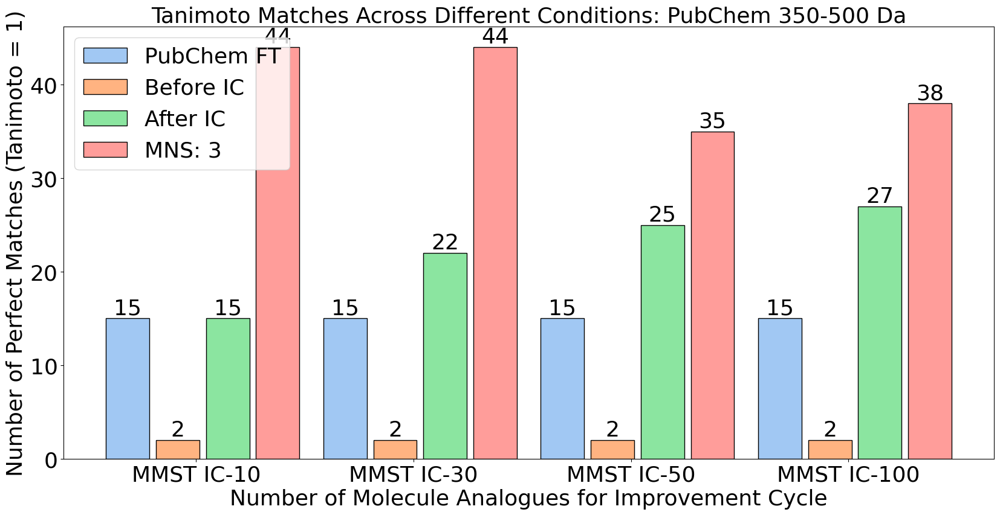

In [115]:

# Data and labels
tani_data = [
    (tani_before_all_100_10, 'FT10 Before'), (tani_after_all_100_10, 'FT10 After'), (tani_after_all_100_10_mns, 'FT10 MNS'),
    #(tani_before_all_100_10, 'FT10 2x Before'), (tani_after_all_100_10_2, 'FT10 2x After'), (tani_after_all_100_10_mns_2, 'FT10 2x MNS'),
    (tani_before_all_100_30, 'FT30 Before'), (tani_after_all_100_30, 'FT30 After'), (tani_after_all_100_30_mns, 'FT30 MNS'),
    (tani_before_all_100_50, 'FT50 Before'), (tani_after_all_100_50, 'FT50 After'), (tani_after_all_100_50_mns, 'FT50 MNS'), 
    (tani_before_all_100_100, 'FT100 Before'), (tani_after_all_100_100, 'FT100 After'), (tani_after_all_100_100_mns, 'FT100 MNS')
]

# Add the PubChem Fine-Tuned data
tani_PC_350_500_FT_list = [tani_PC_350_500_FT for _ in range(5)]  # Repeat the data for each group

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]
perfect_matches_pc = [np.sum(np.array(data) == 1) for data in tani_PC_350_500_FT_list]

# Combine all perfect matches
all_perfect_matches = []
for i in range(4):  # For each FT group (10, 10 2x, 30, 50, 100)
    all_perfect_matches.extend([perfect_matches_pc[i]] + perfect_matches[i*3:(i+1)*3])

# Colors for the bars
colors = [    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    ]

# Labels
group_labels = ['MMST IC-10',  'MMST IC-30', 'MMST IC-50', 'MMST IC-100'] #'FT10 2x',
condition_labels = ['PubChem FT', 'Before IC', 'After IC', 'MNS: 3']

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.2
group_spacing = 0.03

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(4)]

# Create grouped bar plot
for i in range(4):  # Four conditions: PubChem FT, Before, After, MNS
    ax.bar(positions[i], all_perfect_matches[i::4], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_xlabel('Number of Molecule Analogues for Improvement Cycle', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem 350-500 Da', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + 1.5 * bar_width + 0.5 * group_spacing
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Set y-axis tick label font size
ax.tick_params(axis='y', labelsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(all_perfect_matches):
    ax.text(positions[i % 4][i // 4], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')

# Adjust layout and display
plt.tight_layout()

# Save the plot to a specified location
output_path = "./_FIGURES/6.2.2_PC_Bar_Chart_Greedy_MNS_Tanimoto_350_500_v3.png"
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [134]:
# Extract the variables
"""
corr_sampleing_prob_bl_ZINC = imp_cyc_all_100_10_before['corr_sampleing_prob_bl_ZINC']
results_dict_ZINC_greedy_bl = imp_cyc_all_100_10_before['results_dict_ZINC_greedy_bl']
results_dict_greedy_bl_ZINC = imp_cyc_all_100_10_before['results_dict_greedy_bl_ZINC']
tani_PC_350_500_FT = PC_350_500_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
"""

#avg_tani_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_bl_ZINC']
#failed_bl_ZINC = imp_cyc_all_100_10_before['failed_bl_ZINC']
#avg_tani_greedy_bl_ZINC = imp_cyc_all_100_10_before['avg_tani_greedy_bl_ZINC']
#total_results_bl_ZINC = imp_cyc_all_100_10_before['total_results_bl_ZINC']
#filtered_results = imp_cyc_all_100_10_before['filtered_results']

'\ncorr_sampleing_prob_bl_ZINC = imp_cyc_all_100_10_before[\'corr_sampleing_prob_bl_ZINC\']\nresults_dict_ZINC_greedy_bl = imp_cyc_all_100_10_before[\'results_dict_ZINC_greedy_bl\']\nresults_dict_greedy_bl_ZINC = imp_cyc_all_100_10_before[\'results_dict_greedy_bl_ZINC\']\ntani_PC_350_500_FT = PC_350_500_FT["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]\n'

In [116]:
corr_sp_before_all_100_10 = imp_cyc_all_100_10_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10 = imp_cyc_all_100_10_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_10_2 = imp_cyc_all_100_10_after_2["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_30 = imp_cyc_all_100_30_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_30 = imp_cyc_all_100_30_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_50 = imp_cyc_all_100_50_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_50 = imp_cyc_all_100_50_after["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_all_100_100 = imp_cyc_all_100_100_before["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_all_100_100 = imp_cyc_all_100_100_after["corr_sampleing_prob_bl_ZINC"]
corr_PC_350_500_FT = PC_350_500_FT["corr_sampleing_prob_bl_ZINC"]


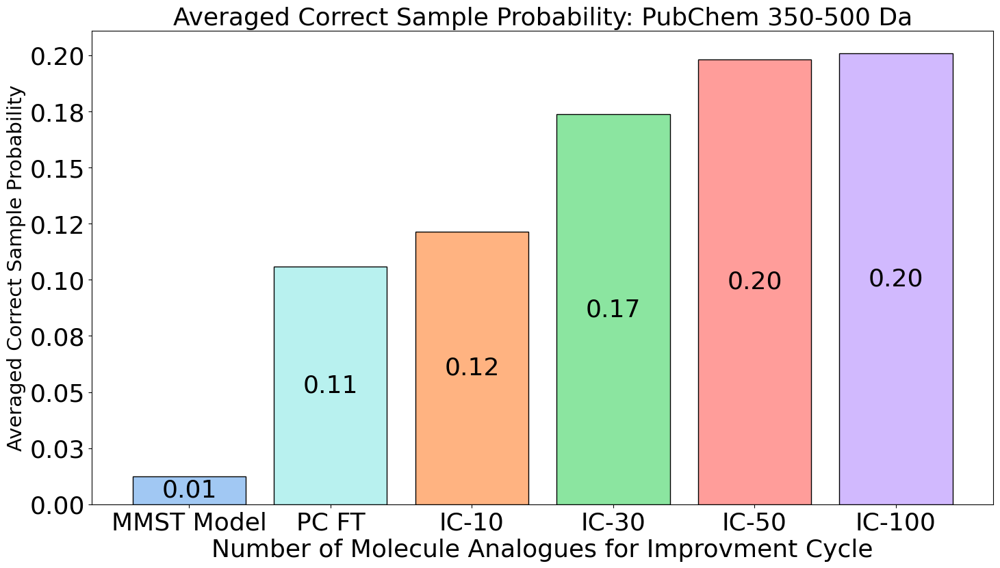

In [117]:

# Data for the bar chart
values = [
    corr_sp_before_all_100_10,  # Before (same for all)
    corr_PC_350_500_FT,         # PC FT
    corr_sp_after_all_100_10,   # After FT10
  #  corr_sp_after_all_100_10_2,  # After 2x FT10
    corr_sp_after_all_100_30,   # After FT30
    corr_sp_after_all_100_50,   # After FT50
    corr_sp_after_all_100_100   # After FT100
]

# Labels for the bars
labels = [
    'MMST Model', 
    'PC FT', 
    'IC-10', 
    'IC-30', 
    'IC-50', 
    'IC-100'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#B8F1EF',  # light cyan/aqua
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability: PubChem 350-500 Da', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=21)
ax.set_xlabel('Number of Molecule Analogues for Improvment Cycle', fontsize=fontsize)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=0)

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_350_500_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


#### PubChem Second round training

In [154]:
# 100_10 0_250
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before_0_250 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_0_250/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_0_250 = pickle.load(file)

#maybe need to take the first one    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240523_PC_Imp_Cycle_2_from_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2_0_250 = pickle.load(file)


In [155]:
# 100_10 250_350
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before_250_350 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240520_Improvment_Cycle_PC_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_250_350 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240523_PC_Imp_Cycle_2_from_250_350/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2_250_350 = pickle.load(file)

In [156]:
# 100_10 350_500
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_before_350_500 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240517_Improvment_Cycle_PC_350_500/6.2_imp_cyc_all_100_10_after.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_350_500 = pickle.load(file)
    
file_path = os.path.abspath('./past_experiments/ChemXriv/6.0_Experiment_IC/20240522_PC_Imp_Cycle_2_from_350_500/6.2_imp_cyc_all_100_10_after_v3_second_round.pkl')
# Loading results_list_b
with open(file_path, 'rb') as file:
    imp_cyc_all_100_10_after_2_350_500 = pickle.load(file)

In [157]:

tani_before_0_250 = imp_cyc_all_100_10_before_0_250["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_0_250 = imp_cyc_all_100_10_after_0_250["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_2_0_250 = imp_cyc_all_100_10_after_2_0_250["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_before_250_350 = imp_cyc_all_100_10_before_250_350["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_250_350 = imp_cyc_all_100_10_after_250_350["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_2_250_350 = imp_cyc_all_100_10_after_2_250_350["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_before_350_500 = imp_cyc_all_100_10_before_350_500["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_350_500 = imp_cyc_all_100_10_after_350_500["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]
tani_after_2_350_500 = imp_cyc_all_100_10_after_2_350_500["results_dict_ZINC_greedy_bl"]["tanimoto_sim"]


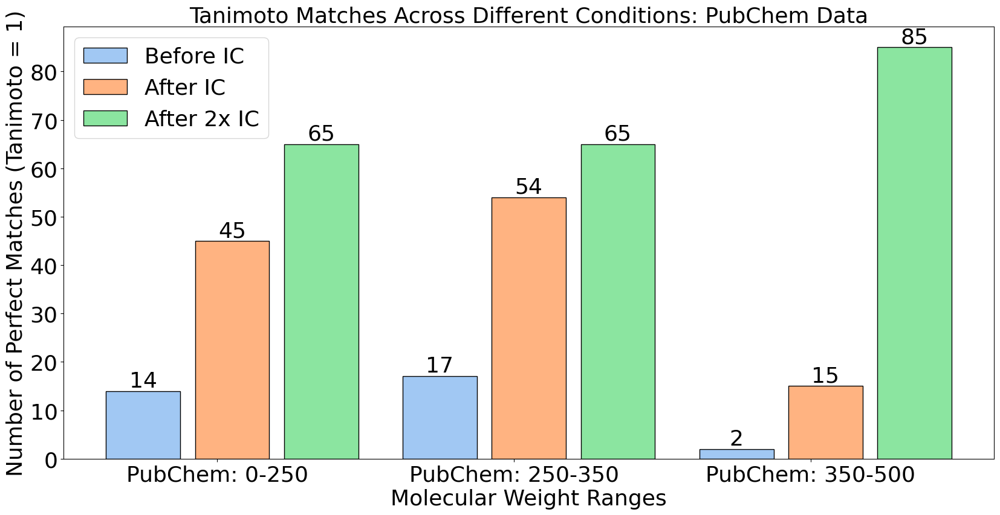

In [158]:

# Data and labels
tani_data = [
    (tani_before_0_250, 'FT0-250 Before'), (tani_after_0_250, 'FT0-250 After'), (tani_after_2_0_250, 'FT0-250 2nd Round'),
    (tani_before_250_350, 'FT250-350 Before'), (tani_after_250_350, 'FT250-350 After'), (tani_after_2_250_350, 'FT250-350 2nd Round'),
    (tani_before_350_500, 'FT350-500 Before'), (tani_after_350_500, 'FT350-500 After'), (tani_after_2_350_500, 'FT350-500 2nd Round')
]

# Count perfect matches (Tanimoto = 1) for each condition
perfect_matches = [np.sum(np.array(data) == 1) for data, _ in tani_data]

# Colors for the bars
colors = [    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
        ]

# Labels
group_labels = ['PubChem: 0-250', 'PubChem: 250-350', 'PubChem: 350-500']
condition_labels = ['Before IC', 'After IC', 'After 2x IC']

# Create the plot
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.25
group_spacing = 0.05

# Calculate positions for each bar
num_groups = len(group_labels)
indices = np.arange(num_groups)
positions = [indices + i * (bar_width + group_spacing) for i in range(3)]

# Create grouped bar plot
for i in range(3):  # Three conditions: Before, After, 2nd Round
    ax.bar(positions[i], perfect_matches[i::3], 
           width=bar_width, color=colors[i], edgecolor='black', 
           label=condition_labels[i])

# Customize the plot
ax.set_ylabel('Number of Perfect Matches (Tanimoto = 1)', fontsize=fontsize)
ax.set_xlabel('Molecular Weight Ranges', fontsize=fontsize)
ax.set_title('Tanimoto Matches Across Different Conditions: PubChem Data', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + bar_width
ax.set_xticks(group_centers)
ax.set_xticklabels(group_labels, fontsize=fontsize)

# Set y-axis tick label font size
ax.tick_params(axis='y', labelsize=fontsize)

# Add value labels on top of each bar
for i, v in enumerate(perfect_matches):
    ax.text(positions[i % 3][i // 3], v, str(v), ha='center', va='bottom', fontsize=fontsize)

# Add legend to the upper right corner
ax.legend(fontsize=fontsize, loc='upper left')

# Adjust layout and display
plt.tight_layout()

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_Bar_Chart_Greedy_second_round_v3.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

plt.show()

In [159]:

corr_sp_before_0_250 = imp_cyc_all_100_10_before_0_250["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_0_250 = imp_cyc_all_100_10_after_0_250["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_2_0_250 = imp_cyc_all_100_10_after_2_0_250["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_250_350 = imp_cyc_all_100_10_before_250_350["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_250_350 = imp_cyc_all_100_10_after_250_350["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_2_250_350 = imp_cyc_all_100_10_after_2_250_350["corr_sampleing_prob_bl_ZINC"]
corr_sp_before_350_500 = imp_cyc_all_100_10_before_350_500["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_350_500 = imp_cyc_all_100_10_after_350_500["corr_sampleing_prob_bl_ZINC"]
corr_sp_after_2_350_500 = imp_cyc_all_100_10_after_2_350_500["corr_sampleing_prob_bl_ZINC"]


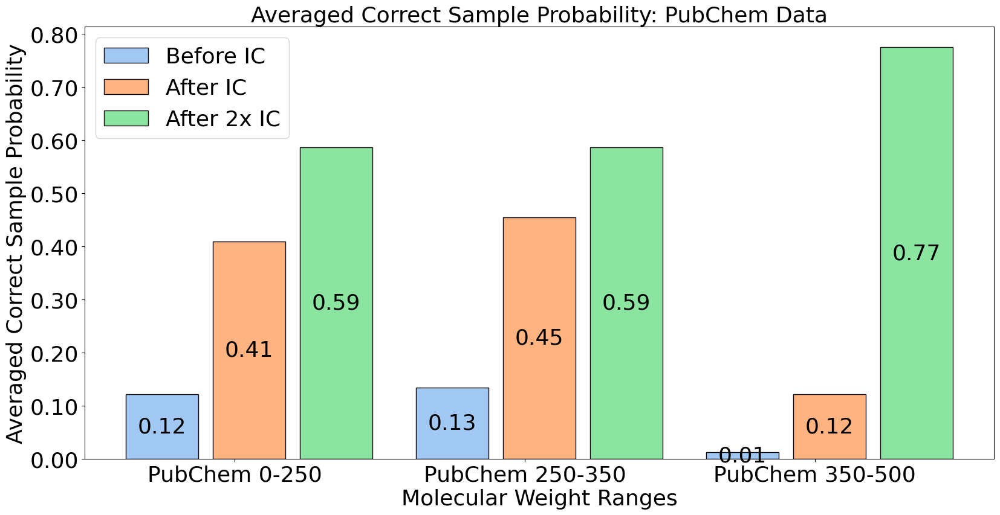

In [160]:

# Data for the bar chart
values = [
    np.mean(corr_sp_before_0_250), np.mean(corr_sp_after_0_250), np.mean(corr_sp_after_2_0_250),
    np.mean(corr_sp_before_250_350), np.mean(corr_sp_after_250_350), np.mean(corr_sp_after_2_250_350),
    np.mean(corr_sp_before_350_500), np.mean(corr_sp_after_350_500), np.mean(corr_sp_after_2_350_500)
]

# Colors for the bars
colors = ['#E57373', '#A2A37E', '#64B689']
colors = [    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',]  # coral pink]  # Red, Blue, Orange, Green

# Create a bar chart
fig, ax = plt.subplots(figsize=(17, 9))

# Set the width of each bar and the spacing between groups
bar_width = 0.25
group_spacing = 0.05

# Calculate positions for each bar
indices = np.arange(3)
positions = [indices + i * (bar_width + group_spacing) for i in range(3)]

# Create grouped bar plot
for i in range(3):  # Three conditions: Before, After, 2nd Round
    bars = ax.bar(positions[i], values[i::3], 
                  width=bar_width, color=colors[i], edgecolor='black', 
                  label=['Before IC', 'After IC', 'After 2x IC'][i])
    
    # Add numbers inside the bars
    for bar, value in zip(bars, values[i::3]):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, 
                f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Customize the plot
ax.set_ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
ax.set_title('Averaged Correct Sample Probability: PubChem Data', fontsize=fontsize)
ax.set_xlabel('Molecular Weight Ranges', fontsize=fontsize)

# Set x-ticks in the middle of each group
group_centers = indices + bar_width
ax.set_xticks(group_centers)
ax.set_xticklabels(['PubChem 0-250', 'PubChem 250-350', 'PubChem 350-500'], fontsize=fontsize)

# Set y-axis to display two decimal places
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.2f}'))

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Add legend
ax.legend(fontsize=fontsize, loc='upper left')

# Adjust layout
plt.tight_layout()

# Save the plot to a specified location
output_path = os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_second_ro_v3.png")
plt.savefig(output_path, dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

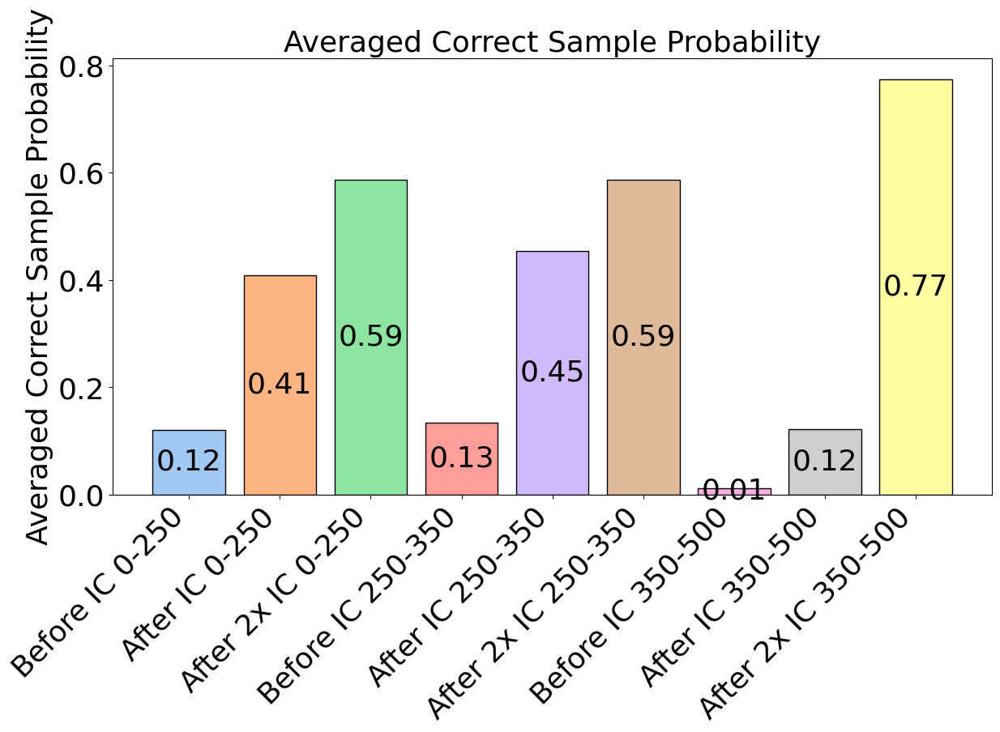

In [161]:
# Data for the bar chart
values = [
    np.mean(corr_sp_before_0_250),  # Before (0-250)
    np.mean(corr_sp_after_0_250),   # After 0-250
    np.mean(corr_sp_after_2_0_250), # 2nd Round After 0-250
    np.mean(corr_sp_before_250_350),  # Before (250-350)
    np.mean(corr_sp_after_250_350),   # After 250-350
    np.mean(corr_sp_after_2_250_350), # 2nd Round After 250-350
    np.mean(corr_sp_before_350_500),  # Before (350-500)
    np.mean(corr_sp_after_350_500),   # After 350-500
    np.mean(corr_sp_after_2_350_500)  # 2nd Round After 350-500
]

# Labels for the bars
labels = [
    'Before IC 0-250', 
    'After IC 0-250', 
    'After 2x IC 0-250',
    'Before IC 250-350', 
    'After IC 250-350', 
    'After 2x IC 250-350',
    'Before IC 350-500', 
    'After IC 350-500', 
    'After 2x IC 350-500'
]

# Colors for the bars (based on provided image)
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    '#FF9D9A',  # coral pink
    '#D1B9FE',  # lavender
    '#DEBA9A',  # beige/tan
    '#FCAEE3',  # pink
    '#CFCECE',  # light gray
    '#FEFDA2',  # pale yellow
    '#B8F1EF',  # light cyan/aqua
]

# Create a bar chart
fig, ax = plt.subplots(figsize=(14, 7))
bars = ax.bar(labels, values, color=colors, edgecolor='black')

# Add numbers inside the bars
for bar, value in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, f'{value:.2f}', ha='center', va='center', fontsize=fontsize, color='black')

# Add title and labels
plt.title('Averaged Correct Sample Probability', fontsize=fontsize)
plt.ylabel('Averaged Correct Sample Probability', fontsize=fontsize)
#plt.xlabel('Stages', fontsize=16)

# Increase the size of the labels on the x-axis
ax.set_xticklabels(labels, fontsize=fontsize, rotation=45, ha='right')

# Increase the size of the ticks on the y-axis
ax.tick_params(axis='y', labelsize=fontsize)

# Save the plot to a specified location
output_path =    os.path.abspath("./_FIGURES/6.2.2_PC_correct_sample_prob_comparison_second_ro_v3.png")
plt.savefig(output_path, bbox_inches='tight')

# Show the plot
plt.show()


### 7.0 Experimental vs Simulated Data

In [ ]:
def plot_comparison_bars(data_dict, colors, figsize=(12, 6), save_path=None):
    """
    Create a bar plot comparing different metrics across all categories.
    Shows accuracy as percentages and adds rotated value labels above bars.
    
    Parameters:
    -----------
    data_dict : dict
        Dictionary with categories and their accuracy values (0-1 scale)
    colors : list
        List of colors for the bars
    figsize : tuple
        Figure size as (width, height)
    save_path : str, optional
        Full path where to save the figure
    """
    
    # Create the figure with specified figsize
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    
    # Calculate positions for bars
    categories = list(data_dict.keys())
    n_categories = len(categories)
    n_metrics = len(list(data_dict.values())[0])
    
    # Set width of bars and positions of the bars
    total_width = 0.8
    width = total_width / n_metrics
    x = np.arange(n_categories)
    
    # Create bars for each metric
    metric_names = ['top-1', 'top-3', 'top-10']
    
    # Set y-axis limit first to properly position labels
    ax.set_ylim(0, 1.1)  # Set y-axis limit from 0 to 110%
    
    for i in range(n_metrics):
        values = [data_dict[cat][i] for cat in categories]
        offset = width * i - (total_width/2) + (width/2)
        bars = ax.bar(x + offset, values, width, label=metric_names[i], color=colors[i], edgecolor='black')
        
        # Add value labels above bars with more spacing
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, 
                   height + 0.03,  # Add more space between bar and label
                   f'{height*100:.0f}%',
                   ha='center', 
                   va='bottom',
                   rotation=90,
                   fontsize=10)
    
    # Customize the plot
    ax.set_xlabel('')
    ax.set_ylabel('Accuracy (%)', fontsize=14)
    ax.set_title('Comparison Across Categories', fontsize=16, pad=20)
    
    # Set x-ticks
    ax.set_xticks(x)
    ax.set_xticklabels(categories, rotation=45, ha='right', fontsize=12)
    
    # Set y-ticks and convert to percentages
    ax.tick_params(axis='y', labelsize=12)
    y_ticks = np.arange(0, 1.2, 0.2)  # Create ticks at 0%, 20%, 40%, 60%, 80%, 100%
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{x*100:.0f}%' for x in y_ticks])
    
    # Add grid
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add legend
    ax.legend(fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save if path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Plot saved to: {save_path}")
    
    plt.show()

# Example usage
if __name__ == "__main__":
    colors = [
        '#A1C8F3',  # light blue/periwinkle
        '#B8F1EF',  # light cyan/aqua
        '#FFB381',  # salmon/peach
        #'#8BE5A0',  # mint green
        #'#D1B9FE',  # lavender
    ]
    
    # Example save path
    save_path = os.path.abspath("./_FIGURES/7.0_IC_comparison_exp_sim_aug_plot.png")
    
    # Call with dummy data
    #plot_comparison_bars({}, colors, save_path=save_path)

In [163]:

def plot_comparison_bars(data_dict, colors, figsize=(12, 6), save_path=None):
    """
    Create a bar plot comparing different metrics across all categories.
    Shows accuracy as percentages with labels inside bars (except for BL Experimental).
    X-axis labels are split into two rows.
    Axis labels: font size 18
    All other text: font size 20
    """
    
    # Create the figure with specified figsize
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111)
    
    # Calculate positions for bars
    categories = list(data_dict.keys())
    n_categories = len(categories)
    n_metrics = len(list(data_dict.values())[0])
    
    # Set width of bars and positions of the bars
    total_width = 0.8
    width = total_width / n_metrics
    x = np.arange(n_categories)
    
    # Create bars for each metric
    metric_names = ['top-1', 'top-3', 'top-10']
    
    # Set y-axis limit first to properly position labels
    ax.set_ylim(0, 1.1)
    
    for i in range(n_metrics):
        values = [data_dict[cat][i] for cat in categories]
        offset = width * i - (total_width/2) + (width/2)
        bars = ax.bar(x + offset, values, width, label=metric_names[i], color=colors[i], edgecolor='black')
        
        # Add value labels
        for j, bar in enumerate(bars):
            height = bar.get_height()
            
            # Special case for BL Experimental (target) where height is very small
            if categories[j] == 'BL Experimental (target)' and height < 0.1:
                # Place label above the bar
                ax.text(bar.get_x() + bar.get_width()/2, 
                       height + 0.03,
                       f'{height*100:.0f}%',
                       ha='center', 
                       va='bottom',
                       rotation=90,
                       fontsize=20)
            else:
                # Place label inside the bar
                ax.text(bar.get_x() + bar.get_width()/2, 
                       height/2,  # Center vertically inside bar
                       f'{height*100:.0f}%',
                       ha='center', 
                       va='center',
                       rotation=90,
                       fontsize=20)
    
    # Customize the plot
    ax.set_xlabel('')
    ax.set_ylabel('Accuracy (%)', fontsize=18)  # Changed to 18
    ax.set_title('Comparison Across Categories', fontsize=20, pad=20)
    
    # Create two-line labels
    def split_category(category):
        if '(target)' in category or '(analogue)' in category:
            main_part = category.split(' (')[0]
            suffix = f'({category.split("(")[1]}'
            return f'{main_part}\n{suffix}'
        return category
    
    # Set x-ticks
    ax.set_xticks(x)
    ax.set_xticklabels([split_category(cat) for cat in categories], 
                       ha='center',  # Center align
                       fontsize=18)  # Changed to 18
    
    # Set y-ticks and convert to percentages
    ax.tick_params(axis='y', labelsize=18)  # Changed to 18
    y_ticks = np.arange(0, 1.2, 0.2)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([f'{x*100:.0f}%' for x in y_ticks])
    
    # Add grid
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add legend inside the plot in the upper right corner
    ax.legend(fontsize=20, loc='upper right')
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    
    # Save if path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
        print(f"Plot saved to: {save_path}")
    
    plt.show()

    
# Example usage
if __name__ == "__main__":
    colors = [
        '#A1C8F3',  # light blue/periwinkle
        '#B8F1EF',  # light cyan/aqua
        '#FFB381',  # salmon/peach
    ]
    
    # Example save path
    save_path = os.path.abspath("./_FIGURES/7.0_IC_comparison_exp_sim_aug_plot.png")
    
    # Call with dummy data
    #plot_comparison_bars({}, colors, save_path=save_path)

#### Extracting the data for the plotting

In [164]:

def process_pkl_files_new(folder_path, file_type, ranking_method):
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl') and file_type in f]
    all_rankings = defaultdict(list)
    for file_path in pkl_files:
        file_data = load_data(file_path)
        
        for trg_smi, value_list in file_data.items():
            for sublist in value_list[0]:
                
                gen_smi = sublist[0]
                tanimoto = sublist[4]
                errors = sublist[5]
                if errors == 9:  # Check if both errors are 9
                    errors = [9, 9]  # Keep it as is
                try:
                    all_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, 0, errors[0], errors[1]))
                except:
                    import IPython; IPython.embed();           
    all_rankings = rank_all_molecules(all_rankings, ranking_method)
    
    return all_rankings


def rank_all_molecules(all_rankings, ranking_method):
    new_rankings = defaultdict(list)
    
    for trg_smi, molecule_list in all_rankings.items():
        molecule_data = []
        seen_gen_smiles = set()
        
        for molecule in molecule_list:
            gen_smi = molecule[1]
            if gen_smi in seen_gen_smiles:
                continue
            seen_gen_smiles.add(gen_smi)
            
            tanimoto = molecule[2]
            errors = molecule[4:6]
            if errors == (9, 9):  # Check if both errors are 9
                errors = [9, 9]  # Keep it as is
            molecule_data.append((gen_smi, errors[0], errors[1], tanimoto))
        
        if not molecule_data:
            continue
        
        molecule_array = np.array(molecule_data, dtype=[('gen_smi', 'U100'), 
                                                        ('error1', float), ('error2', float), 
                                                        ('tanimoto', float)])
        
        if ranking_method == 'HSQC & COSY':
            rank1 = molecule_array.argsort(order='error1')
            rank2 = molecule_array.argsort(order='error2')
            average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                             np.arange(len(rank2))[np.argsort(rank2)]) / 2
            sorted_indices = average_ranks.argsort()
            
        elif ranking_method == 'HSQC':
            sorted_indices = molecule_array.argsort(order='error1')
        elif ranking_method == 'COSY':
            sorted_indices = molecule_array.argsort(order='error2')
        else:
            raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")
        
        for new_rank, i in enumerate(sorted_indices):
            gen_smi = molecule_array['gen_smi'][i]
            tanimoto = molecule_array['tanimoto'][i]
            error1 = molecule_array['error1'][i]
            error2 = molecule_array['error2'][i]
            
            new_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, new_rank, error1, error2))
    
    return new_rankings

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]

def process_experimental_data(base_folder_path, ic_folder_path, analogue_folder_path):
    """
    Process experimental data from different sources and prepare it for plotting.
    
    Parameters:
    -----------
    base_folder_path : str
        Path to the folder containing base experiment data (without IC)
    ic_folder_path : str
        Path to the folder containing IC experiment data
    analogue_folder_path : str
        Path to the folder containing analogue experiment data
    
    Returns:
    --------
    dict
        Dictionary with processed data ready for plotting
    """
    # Define constants
    ranking_method = "HSQC"
    file_types = ["exp_sim_data", "sim_sim_data"]
    
    plot_data = {}
    
    # Process IC experiments
    for file_type in file_types:
        IC_rankings = process_pkl_files_new(ic_folder_path, file_type, ranking_method)
        IC_rankings, _ = exp_func.deduplicate_smiles_from_ranking(IC_rankings)
        IC_rankings, _ = exp_func.filter_rankings_by_molecular_formula(IC_rankings)
        accuracies = exp_func.calculate_top_k_accuracy(IC_rankings, k_range=[1, 3, 10])
        accuracies = [round(acc, 3) for acc in accuracies][:3]

        if file_type == "exp_sim_data":
            plot_data['IC Experimental (target)'] = accuracies
        else:
            plot_data['IC Simulated (target)'] = accuracies
            
    # Process base experiments (without IC)
    for file_type in file_types:
        if file_type == "exp_sim_data":
            input_dict = {"exp_sim_data" : base_pkl_dicts["exp_sim_data"]}
            rankings = exp_func.process_pkl_files_BL(input_dict, ranking_method)
            accuracies = exp_func.calculate_top_k_accuracy_BL(rankings["exp_sim_data"],k_range=[1, 3, 10])
            accuracies = [round(acc, 3) for acc in accuracies][:3]
            plot_data['BL Experimental (target)'] = accuracies

        elif file_type == "sim_sim_data":
            input_dict = {"sim_sim_data" : base_pkl_dicts["sim_sim_data"]}
            rankings = exp_func.process_pkl_files_BL(input_dict, ranking_method)
            accuracies = exp_func.calculate_top_k_accuracy_BL(rankings["sim_sim_data"],k_range=[1, 3, 10])       
            accuracies = [round(acc, 3) for acc in accuracies][:3]
            plot_data['BL Simulated (target)'] = accuracies

            
    # Process analogue experiments
    for file_type in file_types:
        analogue_rankings = process_pkl_files_new(analogue_folder_path, file_type, ranking_method)
        analogue_rankings, _ = exp_func.deduplicate_smiles_from_ranking(analogue_rankings)
        analogue_rankings, _ = exp_func.filter_rankings_by_molecular_formula(analogue_rankings)
        accuracies = exp_func.calculate_top_k_accuracy(analogue_rankings, k_range=[1, 3, 10])
        accuracies = [round(acc, 3) for acc in accuracies][:3]
        
        if file_type == "exp_sim_data":
            plot_data['IC Experimental (analogue)'] = accuracies
        else:
            plot_data['IC Simulated (analogue)'] = accuracies
            
    return plot_data

def reorder_data_dict(data_dict):
    """
    Reorders the data dictionary to group simulated and experimental results together.
    """
    # Define the desired order
    desired_order = [
        'BL Simulated (target)',
        'IC Simulated (target)',
        'IC Simulated (analogue)',
        'BL Experimental (target)',
        'IC Experimental (target)',
        'IC Experimental (analogue)'
    ]
    
    # Create new ordered dictionary
    ordered_dict = {key: data_dict[key] for key in desired_order if key in data_dict}
    
    return ordered_dict

# Helper functions remain the same as in previous version

In [ ]:
# Define your folder paths
base_folder = ""
ic_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1/")
base_pkl_dicts = {
        "sim_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.0_sim_real_data_before_FT_MMTi_v0.pkl"),
        "exp_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.3_real_data_before_FT_MMTi_v0.pkl")
        }    
analogue_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/Sim_ACD_Exp_aug/test_on_aug_data_34_v3/")

#file_paths_dict = {
#    "sim_sim_data": os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_d1_baseline/8.0_sim_real_data_before_FT_MMT_v0.pkl"),
#    "ACD_sim_data": os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_d1_baseline/8.2_simACD_real_data_before_FT_MMT_v0.pkl"),
#    "exp_sim_data": os.path.abspath("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_d1_baseline/8.3_real_data_before_FT_MMT_v0.pkl")
#}    

# Process the data
data = process_experimental_data(base_pkl_dicts, ic_folder, analogue_folder)
data = reorder_data_dict(data)
# Plot with your color scheme
colors = [
    '#A1C8F3',  # light blue/periwinkle
    '#FFB381',  # salmon/peach
    '#8BE5A0',  # mint green
    #'#FF9D9A',  # coral pink
    #'#D1B9FE',  # lavender
    #'#DEBA9A',  # beige/tan
]
save_path = os.path.abspath("./_FIGURES/7.0_IC_comparison_exp_sim_aug_plot.png")

plot_comparison_bars( data_dict=data,     colors=colors,     save_path=save_path,    figsize=(12, 6))

FileNotFoundError: [Errno 2] No such file or directory: '/projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/7.0_Experiment/Sim_ACD_Exp_aug/test_on_aug_data_34_v3'

#### Extract Top 1 and top 3 correct Molecules

In [166]:
def extract_correct_smiles_analogues(analogue_folder_path, file_type="exp_sim_data", ranking_method="HSQC"):
    """
    Extract SMILES of molecules that are correct matches in top 1 and top 3 rankings
    for experimental analogues.
    
    Parameters:
    -----------
    analogue_folder_path : str
        Path to the folder containing analogue experiment data
    file_type : str
        Type of file to process ('exp_sim_data' or 'sim_sim_data')
    ranking_method : str
        Method used for ranking ('HSQC', 'COSY', or 'HSQC & COSY')
        
    Returns:
    --------
    tuple
        (correct_top1_pairs, correct_top3_pairs) where each is a list of tuples containing
        (target_smiles, generated_smiles, rank) where rank indicates which position (1,2,3)
        had the correct match
    """
    # Process the rankings
    analogue_rankings = process_pkl_files_new(analogue_folder_path, file_type, ranking_method)
    
    # Deduplicate and filter rankings
    analogue_rankings, _ = exp_func.deduplicate_smiles_from_ranking(analogue_rankings)
    analogue_rankings, _ = exp_func.filter_rankings_by_molecular_formula(analogue_rankings)
    
    correct_top1_pairs = []
    correct_top3_pairs = []
    
    # For each target molecule
    for target_smi, rankings in analogue_rankings.items():
        # Sort rankings by rank
        sorted_rankings = sorted(rankings, key=lambda x: x[3])  # x[3] is the rank
        
        # Check top 1 match
        if sorted_rankings:
            top1_gen_smi = sorted_rankings[0][1]  # x[1] is generated SMILES
            if top1_gen_smi == target_smi:  # Only append if it's a correct match
                correct_top1_pairs.append((target_smi, top1_gen_smi, 1))
        
        # Check each of the top 3 matches individually
        for idx, ranking in enumerate(sorted_rankings[:3], 1):  # idx will be 1, 2, or 3
            gen_smi = ranking[1]
            if gen_smi == target_smi:  # If we find a match at any position
                correct_top3_pairs.append((target_smi, gen_smi, idx))
    
    return correct_top1_pairs, correct_top3_pairs

def save_correct_smiles_to_file(smiles_pairs, output_path, include_rank=False):
    """
    Save correct SMILES pairs to a text file.
    
    Parameters:
    -----------
    smiles_pairs : list
        List of (target_smiles, generated_smiles, rank) tuples that are correct matches
    output_path : str
        Path where to save the file
    include_rank : bool
        If True, includes which position (1,2,3) had the correct match
    """
    with open(output_path, 'w') as f:
        if include_rank:
            f.write("SMILES\tRank\n")
            for target_smi, _, rank in smiles_pairs:  # We can use either SMILES since they're identical
                f.write(f"{target_smi}\t{rank}\n")
        else:
            f.write("SMILES\n")
            for target_smi, _, _ in smiles_pairs:
                f.write(f"{target_smi}\n")


In [169]:
### with Analogues
# Example usage:

analogue_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3/")

# Extract only correct SMILES matches
correct_top1_pairs, correct_top3_pairs = extract_correct_smiles_analogues(
    analogue_folder,
    file_type="exp_sim_data",
    ranking_method="HSQC"
)

# Save to files (only correct matches)
# For top 1, we don't need the rank
save_correct_smiles_to_file(correct_top1_pairs, "correct_top1_experimental_analogues.txt", include_rank=False)
# For top 3, we might want to know which position had the match
save_correct_smiles_to_file(correct_top3_pairs, "correct_top3_experimental_analogues.txt", include_rank=True)

# Optional: Print some statistics
print(f"Number of correct top 1 matches: {len(correct_top1_pairs)}")
print(f"Number of correct top 3 matches: {len(correct_top3_pairs)}")
print("\nBreakdown of top 3 matches by position:")
for rank in [1, 2, 3]:
    count = sum(1 for _, _, r in correct_top3_pairs if r == rank)
    print(f"Position {rank}: {count} matches")


Number of correct top 1 matches: 4
Number of correct top 3 matches: 13

Breakdown of top 3 matches by position:
Position 1: 4 matches
Position 2: 7 matches
Position 3: 2 matches


In [171]:
analogue_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1/")

# Extract only correct SMILES matches
correct_top1_pairs, correct_top3_pairs = extract_correct_smiles_analogues(
    analogue_folder,
    file_type="exp_sim_data",
    ranking_method="HSQC"
)

# Save to files (only correct matches)
# For top 1, we don't need the rank
save_correct_smiles_to_file(correct_top1_pairs, "correct_top1_experimental_analogues.txt", include_rank=False)
# For top 3, we might want to know which position had the match
save_correct_smiles_to_file(correct_top3_pairs, "correct_top3_experimental_analogues.txt", include_rank=True)


# Optional: Print some statistics
print(f"Number of correct top 1 matches: {len(correct_top1_pairs)}")
print(f"Number of correct top 3 matches: {len(correct_top3_pairs)}")
print("\nBreakdown of top 3 matches by position:")
for rank in [1, 2, 3]:
    count = sum(1 for _, _, r in correct_top3_pairs if r == rank)
    print(f"Position {rank}: {count} matches")


Number of correct top 1 matches: 11
Number of correct top 3 matches: 18

Breakdown of top 3 matches by position:
Position 1: 11 matches
Position 2: 3 matches
Position 3: 4 matches


### 8.0 Simulated, Experimental results

#### Plotting

In [172]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from rdkit import Chem
from rdkit.Chem import AllChem, Draw, Descriptors
import pandas as pd
import random
import string
import rdkit
from rdkit import Chem

colors = [
    '#E57373', '#A2A37E', '#64B689', '#4DA6A9', '#5C95CC', '#9574D0', '#EB6CC2'
]

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]


def process_pkl_files_new(folder_path, file_type, ranking_method):
    pkl_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) 
                 if f.endswith('.pkl') and file_type in f]
    all_rankings = defaultdict(list)
    for file_path in pkl_files:
        file_data = load_data(file_path)
        
        for trg_smi, value_list in file_data.items():
            for sublist in value_list[0]:
                
                gen_smi = sublist[0]
                tanimoto = sublist[4]
                errors = sublist[5]
                if errors == 9:  # Check if both errors are 9
                    errors = [9, 9]  # Keep it as is
                try:
                    all_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, 0, errors[0], errors[1]))
                except:
                    import IPython; IPython.embed();           
    all_rankings = rank_all_molecules(all_rankings, ranking_method)
    
    return all_rankings


def calculate_top_k_accuracy(all_rankings, k_range=[1, 3, 5, 10, 20]):
    accuracies = []
    total_molecules = 34 #len(all_rankings)
    for k in k_range:
        correct_count = sum(
            any(molecule[2] == 1 for molecule in rankings[:k])
            for rankings in all_rankings.values()
        )
        accuracy = correct_count / total_molecules
        accuracies.append(accuracy)
    correct_count = sum(
        any(molecule[2] == 1 for molecule in rankings[:])
        for rankings in all_rankings.values()
    )
    accuracy = correct_count / total_molecules
    accuracies.append(accuracy)    
    return accuracies


def plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path=None, total_samples=34):
    fontsize = 30
    k_values = [1, 3, 5, 10, 20]
    labels = [f'Top {k}' for k in k_values] + ['Total']
    
    plt.figure(figsize=(12, 8))  # Slightly wider to accommodate longer labels
    bars = plt.bar(range(len(labels)), accuracies, color=colors[:len(labels)])
    
    plt.ylabel('Accuracy', fontsize=fontsize)
    plt.title(f'{data_type} Data and {ranking_method} Ranking', fontsize=fontsize+4)
    
    plt.xticks(range(len(labels)), labels, fontsize=fontsize, rotation=0, ha='center')
    plt.yticks(fontsize=fontsize)
    plt.ylim(0, 1.1)
    
    for bar in bars:
        height = bar.get_height()
        correct_samples = int(height * total_samples)
        
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.2f}',
                 ha='center', va='bottom', fontsize=fontsize)
        
        plt.text(bar.get_x() + bar.get_width()/2., height/2,
                 f'{correct_samples}',
                 ha='center', va='center', fontsize=fontsize, color='black')
    
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to {save_path}")
    
    plt.close()
    

def main_normal():
    folder_path = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1/")
    model_type = "MMT"
    ranking_methods = [ "HSQC"]
    file_types = ["exp_sim_data", "sim_sim_data"]

    data_type_map = {
        "exp_sim_data": "Experimental",
        "sim_sim_data": "Our Simulated",
    }
    filtered_out = []
    all_rankings_list = []
    for ranking_method in ranking_methods:
        for file_type in file_types:
            all_rankings = process_pkl_files_new(folder_path, file_type, ranking_method)
            #import IPython; IPython.embed();
            all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
            all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
            #filtered_out.append(filtered_out_rankings)
            all_rankings_list.append(all_rankings)
            print("second_breakout")
            #import IPython; IPython.embed();

            accuracies = calculate_top_k_accuracy(all_rankings)
            sim_rank_one_count = exp_func.count_molecules_with_sim_rank_one(all_rankings)

            data_type = data_type_map[file_type]
            save_path = f"./_FIGURES/top_k_accuracy_MMTi_{file_type}_{ranking_method}_va_FINAL_2.png"

            plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path, total_samples=len(all_rankings.keys()))

            print(f"Completed plot for {ranking_method} - {data_type}")
    return all_rankings_list, filtered_out


In [173]:

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]


def rank_molecules_in_file(file_data, ranking_method):
    molecule_data = []
    for trg_smi, value_list in file_data.items():
        for sublist in value_list[0]:
            gen_smi = sublist[0]
            tanimoto = sublist[4]
            errors = sublist[5]
            if errors == 9:
                errors = [9,9] ### Necessary if it doesn't manage to calculate HSQC or COSY to calculate the errors
                                ## Basically put it last then
            molecule_data.append((trg_smi, gen_smi, errors[0], errors[1], tanimoto))

    if not molecule_data:
        return []

    molecule_array = np.array(molecule_data, dtype=[('trg_smi', 'U100'), ('gen_smi', 'U100'), 
                                                    ('error1', float), ('error2', float), 
                                                    ('tanimoto', float)])
    
    if ranking_method == 'HSQC & COSY':
        rank1 = molecule_array.argsort(order='error1')
        rank2 = molecule_array.argsort(order='error2')
        average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                         np.arange(len(rank2))[np.argsort(rank2)]) / 2
        sorted_indices = average_ranks.argsort()
        
    elif ranking_method == 'HSQC':
        sorted_indices = molecule_array.argsort(order='error1')
    elif ranking_method == 'COSY':
        sorted_indices = molecule_array.argsort(order='error2')
    else:
        raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")

    sorted_molecules = [(molecule_array['trg_smi'][i], 
                         molecule_array['gen_smi'][i],
                         molecule_array["tanimoto"][i],
                         new_rank,  # Use index as rank
                         molecule_array['error1'][i], 
                         molecule_array['error2'][i]) 
                        for new_rank, i  in enumerate(sorted_indices)]
    return sorted_molecules


def rank_all_molecules(all_rankings, ranking_method):
    new_rankings = defaultdict(list)
    
    for trg_smi, molecule_list in all_rankings.items():
        molecule_data = []
        seen_gen_smiles = set()
        
        for molecule in molecule_list:
            gen_smi = molecule[1]
            if gen_smi in seen_gen_smiles:
                continue
            seen_gen_smiles.add(gen_smi)
            
            tanimoto = molecule[2]
            errors = molecule[4:6]
            if errors == (9, 9):  # Check if both errors are 9
                errors = [9, 9]  # Keep it as is
            molecule_data.append((gen_smi, errors[0], errors[1], tanimoto))
        
        if not molecule_data:
            continue
        
        molecule_array = np.array(molecule_data, dtype=[('gen_smi', 'U100'), 
                                                        ('error1', float), ('error2', float), 
                                                        ('tanimoto', float)])
        
        if ranking_method == 'HSQC & COSY':
            rank1 = molecule_array.argsort(order='error1')
            rank2 = molecule_array.argsort(order='error2')
            average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                             np.arange(len(rank2))[np.argsort(rank2)]) / 2
            sorted_indices = average_ranks.argsort()
            
        elif ranking_method == 'HSQC':
            sorted_indices = molecule_array.argsort(order='error1')
        elif ranking_method == 'COSY':
            sorted_indices = molecule_array.argsort(order='error2')
        else:
            raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")
        
        for new_rank, i in enumerate(sorted_indices):
            gen_smi = molecule_array['gen_smi'][i]
            tanimoto = molecule_array['tanimoto'][i]
            error1 = molecule_array['error1'][i]
            error2 = molecule_array['error2'][i]
            
            new_rankings[trg_smi].append((trg_smi, gen_smi, tanimoto, new_rank, error1, error2))
    
    return new_rankings


def prepare_mol(smiles):
    mol = Chem.MolFromSmiles(smiles)
    AllChem.Compute2DCoords(mol)
    return mol

def get_mol_weight(mol):
    return round(Descriptors.ExactMolWt(mol), 2)


In [174]:
all_rankings_list, filtered_out = main_normal()


second_breakout
Plot saved to ./_FIGURES/top_k_accuracy_MMTi_exp_sim_data_HSQC_va_FINAL_2.png
Completed plot for HSQC - Experimental
second_breakout
Plot saved to ./_FIGURES/top_k_accuracy_MMTi_sim_sim_data_HSQC_va_FINAL_2.png
Completed plot for HSQC - Our Simulated


#### Plot baseline performance

In [177]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

colors = [
    '#E57373', '#A2A37E', '#64B689', '#4DA6A9', '#5C95CC', '#9574D0', '#EB6CC2'
]

def load_data(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)
    return data["results_dict_bl_ZINC"]

def rank_molecules(file_data, ranking_method):
    all_rankings = {}
    for trg_smi, value_list in file_data.items():
        molecule_data = []
        for sublist in value_list[0]:
            try:
                gen_smi = sublist[0]
                tanimoto = sublist[4]
                errors = sublist[5]
                molecule_data.append((gen_smi, errors[0], errors[1], tanimoto))
            except:
                print(f"Error processing sublist for {trg_smi}: {sublist}")
                continue

        if not molecule_data:
            continue

        molecule_array = np.array(molecule_data, dtype=[('gen_smi', 'U100'), 
                                                        ('error1', float), ('error2', float), 
                                                        ('tanimoto', float)])
        
        if ranking_method == 'HSQC & COSY':
            rank1 = molecule_array.argsort(order='error1')
            rank2 = molecule_array.argsort(order='error2')
            average_ranks = (np.arange(len(rank1))[np.argsort(rank1)] + 
                             np.arange(len(rank2))[np.argsort(rank2)]) / 2
            sorted_indices = average_ranks.argsort()
        elif ranking_method == 'HSQC':
            sorted_indices = molecule_array.argsort(order='error1')
        elif ranking_method == 'COSY':
            sorted_indices = molecule_array.argsort(order='error2')
        else:
            raise ValueError("Invalid ranking method. Choose 'HSQC & COSY', 'HSQC', or 'COSY'.")

        sorted_molecules = [(trg_smi,
                             molecule_array['gen_smi'][i],
                             molecule_array["tanimoto"][i],
                             new_rank,  # Use index as rank
                             molecule_array['error1'][i], 
                             molecule_array['error2'][i]) 
                            for  new_rank, i in enumerate(sorted_indices)]
        
        all_rankings[trg_smi] = sorted_molecules
    
    return all_rankings


def plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path=None, total_samples=34):
    fontsize = 30
    k_values = [1, 3, 5, 10, 20]
    labels = [f'Top {k}' for k in k_values] + ['Total']
    
    
    plt.figure(figsize=(12, 8))  # Slightly wider to accommodate longer labels
    # print(range(len(labels)), all_values, colors[:len(labels)])
    # bars = plt.bar(range(len(labels)), all_values, color=colors[:len(labels)])
    #bars = plt.bar(range(len(labels)), accuracies + [sim_rank_one_count / total_samples], color=colors[:len(labels)])
    bars = plt.bar(range(len(labels)), accuracies, color=colors[:len(labels)])
    
    plt.ylabel('Accuracy', fontsize=fontsize)
    plt.title(f'{data_type} Data and {ranking_method} Ranking', fontsize=fontsize+4)
    
    plt.xticks(range(len(labels)), labels, fontsize=fontsize, rotation=0, ha='center')
    plt.yticks(fontsize=fontsize)
    plt.ylim(0, 1.1)
    
    for bar in bars:
        height = bar.get_height()
        correct_samples = int(height * total_samples)
        
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.2f}',
                 ha='center', va='bottom', fontsize=fontsize)
        
        plt.text(bar.get_x() + bar.get_width()/2., height/2,
                 f'{correct_samples}',
                 ha='center', va='center', fontsize=fontsize, color='black')
    
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Plot saved to {save_path}")
    
    plt.close()
    
def main_BL():
    #folder_path = "/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/precomputed_raw_data/20240724_IC_batched_MMT_a1_baseline/"
    model_type = "MMT"
    ranking_methods = ["HSQC"] #, "HSQC & COSY"
    file_types = ["sim_sim_data", "exp_sim_data"]
    
    
    file_paths_dict = {
        "sim_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.0_sim_real_data_before_FT_MMTi_v0.pkl"),
        "exp_sim_data": os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/20240724_IC_batched_MMT_a1_baseline/8.3_real_data_before_FT_MMTi_v0.pkl")
    }    
    
    
    data_type_map = {
        "sim_sim_data": "Our Simulated",
        "exp_sim_data": "Experimental"
    }
    for ranking_method in ranking_methods:
        all_rankings = exp_func.process_pkl_files_BL(file_paths_dict, ranking_method)
        
        for data_type, rankings in all_rankings.items():
            #import IPython; IPython.embed();
            accuracies = calculate_top_k_accuracy(rankings)
            sim_rank_one_count = exp_func.count_molecules_with_sim_rank_one(rankings)
            
            save_path = os.path.abspath(f"./_FIGURES/top_k_accuracy_MMTi_baseline_{data_type}_{ranking_method}_FINAL_2.png")
            #save_path = f"/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/___FIGURES_PAPERS/Figures_Paper_2/top_k_accuracy_MMT_baseline_{data_type}_{ranking_method}_v8.png"
            plot_top_k_accuracy(accuracies, data_type_map[data_type], model_type, ranking_method, sim_rank_one_count, save_path, total_samples=34)

            print(f"Completed plot for {ranking_method} - {data_type_map[data_type]}")



In [178]:
main_BL()

Plot saved to /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/top_k_accuracy_MMTi_baseline_sim_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Our Simulated
Plot saved to /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/top_k_accuracy_MMTi_baseline_exp_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Experimental


#### Plot all molecules

Saved molecules_row_aug_1.svg


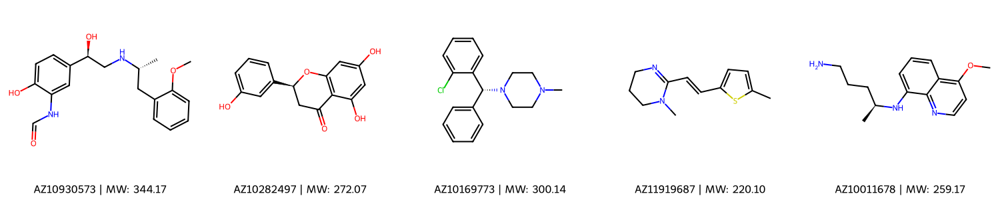

Saved molecules_row_aug_2.svg


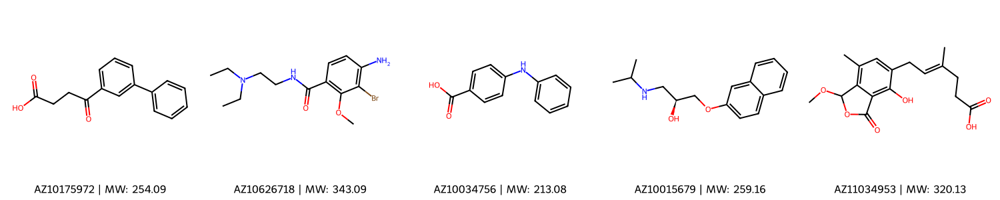

Saved molecules_row_aug_3.svg


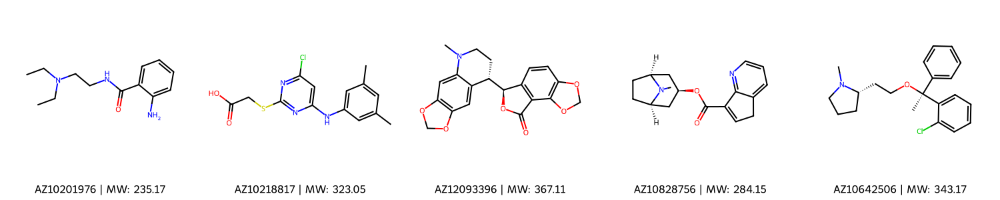

Saved molecules_row_aug_4.svg


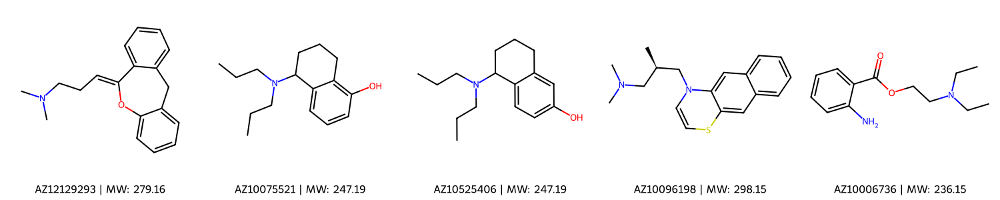

Saved molecules_row_aug_5.svg


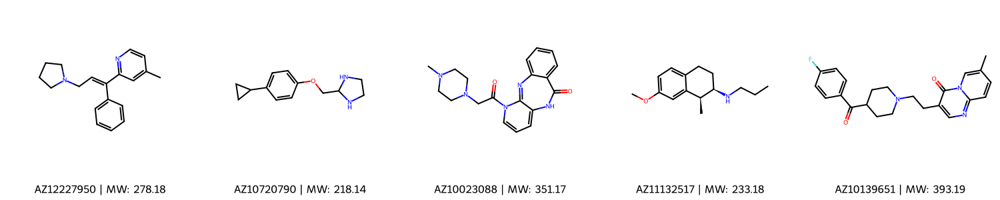

Saved molecules_row_aug_6.svg


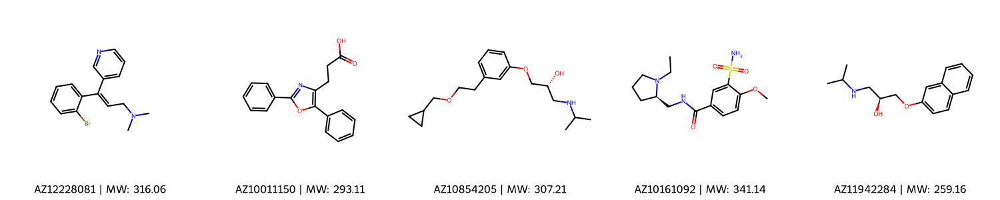

Saved molecules_row_aug_7.svg


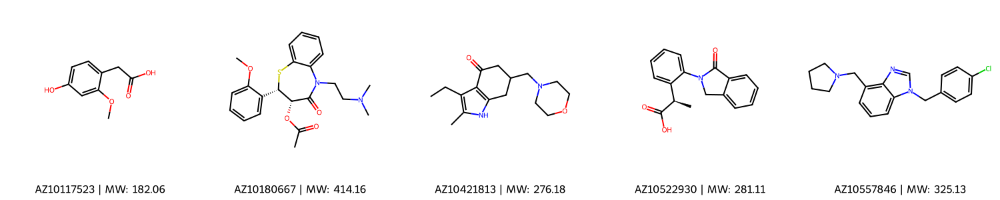

In [179]:

def plot_molecules_from_df(df, smiles_col, id_col, mols_per_row=5, output_folder='molecule_images'):
    """
    Plot molecules from a DataFrame with SMILES and sample ID columns and save images to a folder.
    
    Args:
    df (pd.DataFrame): DataFrame containing SMILES and sample ID columns
    smiles_col (str): Name of the column containing SMILES strings
    id_col (str): Name of the column containing sample IDs
    mols_per_row (int): Number of molecules to display per row (default: 5)
    output_folder (str): Name of the folder to save images (default: 'molecule_images')
    """
    mols = []
    legends = []
    
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    for _, row in df.iterrows():
        mol = Chem.MolFromSmiles(row[smiles_col])
        if mol is not None:
            mols.append(mol)
            mol_weight = Descriptors.ExactMolWt(mol)
            legend = f"{row[id_col]} | MW: {mol_weight:.2f}"
            legends.append(legend)
    
    n_rows = ceil(len(mols) / mols_per_row)
    
    for i in range(n_rows):
        start_idx = i * mols_per_row
        end_idx = min((i + 1) * mols_per_row, len(mols))
        
        img = Draw.MolsToGridImage(
            mols[start_idx:end_idx],
            molsPerRow=mols_per_row,
            subImgSize=(300, 300),
            legends=[legends[j] for j in range(start_idx, end_idx)],
            useSVG=True
        )
        
        # Save the SVG image
        filename = f'molecules_row_aug_{i+1}.svg'
        filepath = os.path.join(output_folder, filename)
        with open(filepath, 'w') as f:
            f.write(img.data)
        
        print(f"Saved {filename}")
        
        # Display the image (optional, comment out if not needed)
        display(SVG(img.data))


from rdkit.Chem.Draw import IPythonConsole
IPythonConsole.drawOptions.addAtomIndices = False 

#df = pd.read_csv("/projects/cc/se_users/knlr326/1_NMR_project/1_NMR_data_AZ/37_Richard_ACD_sim_data/ACD_1H_with_SN_filtered_v3.csv")
df = pd.read_csv(os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv"))
output_folder = os.path.abspath("./_FIGURES")

plot_molecules_from_df(df, 'SMILES_regio_isomers', 'sample-id', output_folder=output_folder)
#plot_molecules_from_df(df, 'SMILES', 'sample-id', output_folder=output_folder)


In [180]:

def find_duplicate_smiles(df, smiles_col, id_col):
    """
    Find duplicate SMILES in a DataFrame after canonicalization.
    
    Args:
    df (pd.DataFrame): DataFrame containing SMILES and sample ID columns
    smiles_col (str): Name of the column containing SMILES strings
    id_col (str): Name of the column containing sample IDs
    
    Returns:
    pd.DataFrame: A DataFrame containing duplicate SMILES, their IDs, and count
    """
    # Create a dictionary to store canonical SMILES and their corresponding IDs
    canonical_smiles_dict = {}
    
    for _, row in df.iterrows():
        smiles = row[smiles_col]
        mol_id = row[id_col]
        
        # Generate canonical SMILES
        mol = Chem.MolFromSmiles(smiles)
        if mol is not None:
            canonical_smiles = Chem.MolToSmiles(mol, canonical=True)
            
            # Add to dictionary
            if canonical_smiles in canonical_smiles_dict:
                canonical_smiles_dict[canonical_smiles].append((mol_id, smiles))
            else:
                canonical_smiles_dict[canonical_smiles] = [(mol_id, smiles)]
    
    # Filter for duplicates and create a list of results
    duplicates = []
    for canonical_smiles, id_smiles_list in canonical_smiles_dict.items():
        if len(id_smiles_list) > 1:
            for mol_id, original_smiles in id_smiles_list:
                duplicates.append({
                    'Canonical_SMILES': canonical_smiles,
                    'Original_SMILES': original_smiles,
                    'ID': mol_id,
                    'Duplicate_Count': len(id_smiles_list)
                })
    
    # Create a DataFrame from the list of duplicates
    duplicates_df = pd.DataFrame(duplicates)
    
    # Sort by Duplicate_Count (descending) and Canonical_SMILES
    duplicates_df = duplicates_df.sort_values(['Duplicate_Count', 'Canonical_SMILES'], ascending=[False, True])
    
    return duplicates_df

# Example usage:
df = pd.read_csv(os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv"))
duplicate_smiles = find_duplicate_smiles(df, 'SMILES', 'sample-id')
print(duplicate_smiles)
print(f"Total number of duplicate entries: {len(duplicate_smiles)}")
print(f"Number of unique molecules with duplicates: {duplicate_smiles['Canonical_SMILES'].nunique()}")

                  Canonical_SMILES                  Original_SMILES  \
0  CC(C)NC[C@H](O)COc1cccc2ccccc12  CC(C)NC[C@H](O)COc1cccc2ccccc12   
1  CC(C)NC[C@H](O)COc1cccc2ccccc12  CC(C)NC[C@H](O)COc1cccc2ccccc12   

           ID  Duplicate_Count  
0  AZ10015679                2  
1  AZ11942284                2  
Total number of duplicate entries: 2
Number of unique molecules with duplicates: 1


### 9.0 Improvement Cycle on Similar Molecules

In [181]:

def split_dataset(config, chunk_size: int) -> List[pd.DataFrame]:
    df = pd.read_csv(config.SGNN_csv_gen_smi)
    return [df[i:i+chunk_size] for i in range(0, len(df), chunk_size)]


def create_chunk_folder(config, idx: int) -> str:
    base_dir = config.model_save_dir
    current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")
    chunk_folder_name = f"chunk_{idx:03d}_{current_datetime}"
    chunk_folder_path = os.path.join(base_dir, chunk_folder_name)
    
    os.makedirs(chunk_folder_path, exist_ok=True)
    print(f"Created folder for chunk {idx}: {chunk_folder_path}")
    
    return chunk_folder_path

def test_pretrained_model_on_sim_data_before(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, idx):
    MW_filter, greedy_full = True, False
    
    print("prepare_data")
    config = prepare_data(config, chunk)
    print("generate_simulated_data")
    config = generate_simulated_data(config, IR_config)

    print("load_model_and_data")
    model_MMT, val_dataloader, val_dataloader_multi = load_model_and_data(config, stoi, stoi_MF)

    print("run_model_analysis")
    prob_dict_results_1c_, results_dict_1c_ = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

    results = test_model_performance(config, model_MMT, val_dataloader, val_dataloader_multi, stoi, itos, stoi_MF, itos_MF)

    save_results_before(results, config, idx)

    return config

def prepare_data(config: Any, chunk: pd.DataFrame) -> Any:
    chunk_csv_path = os.path.join(config.pkl_save_folder, "SGNN_csv_gen_smi.csv")
    chunk.to_csv(chunk_csv_path)
    config.SGNN_csv_gen_smi = chunk_csv_path 
    config.data_size = len(chunk)
    return config

def generate_simulated_data(config: Any, IR_config: Any) -> Any:
    config.execution_type = "data_generation"
    if config.execution_type == "data_generation":
        print("\033[1m\033[31mThis is: data_generation\033[0m")
        #import IPython; IPython.embed();

        config = ex.gen_sim_aug_data(config, IR_config)
        backup_config_paths(config)
    return config

def backup_config_paths(config: Any) -> None:
    config.csv_1H_path_SGNN_backup = copy.deepcopy(config.csv_1H_path_SGNN)
    config.csv_13C_path_SGNN_backup = copy.deepcopy(config.csv_13C_path_SGNN)
    config.csv_HSQC_path_SGNN_backup = copy.deepcopy(config.csv_HSQC_path_SGNN)
    config.csv_COSY_path_SGNN_backup = copy.deepcopy(config.csv_COSY_path_SGNN)
    config.IR_data_folder_backup = copy.deepcopy(config.IR_data_folder)

def save_results_before(results: Dict[str, Any], config: Any, idx: int) -> None:
    variables_to_save = {
        'avg_tani_bl_ZINC': results['avg_tani_bl_ZINC_'],
        'results_dict_greedy_bl_ZINC': results.get('results_dict_greedy_bl_ZINC_'),
        'failed_bl_ZINC': results.get('failed_bl_ZINC_'),
        'avg_tani_greedy_bl_ZINC': results['avg_tani_greedy_bl_ZINC_'],
        'results_dict_ZINC_greedy_bl': results.get('results_dict_ZINC_greedy_bl_'),
        'total_results_bl_ZINC': results['total_results_bl_ZINC_'],
        'corr_sampleing_prob_bl_ZINC': results['corr_sampleing_prob_bl_ZINC_'],
        'results_dict_bl_ZINC': results['results_dict_bl_ZINC_'],
    }
    save_data_with_datetime_index(variables_to_save, config.pkl_save_folder, "before_sim_data", idx)

def create_run_folder(chunk_folder, idx):
    current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")
    run_folder_name = f"run_{idx}_{current_datetime}"
    run_folder_path = os.path.join(chunk_folder, run_folder_name)
    
    os.makedirs(run_folder_path, exist_ok=True)
    print(f"Created folder for run {idx}: {run_folder_path}")
    
    return run_folder_path

def fine_tune_model_aug_mol(config, stoi, stoi_MF, chunk, idx):
    #import IPython; IPython.embed();
    config, all_gen_smis, aug_mol_df = generate_augmented_molecules_from_aug_mol(config, chunk, idx)
    
    config.parent_model_save_dir = config.model_save_dir
    config.model_save_dir = config.current_run_folder 
    
    if config.execution_type == "transformer_improvement":
        print("\033[1m\033[31mThis is: transformer_improvement, sim_data_gen == TRUE\033[0m")
        config.training_setup = "pretraining"
        mtf.run_MMT(config, stoi, stoi_MF)
    
    config.model_save_dir = config.parent_model_save_dir
    #config = ex.update_model_path(config)

    return config, aug_mol_df, all_gen_smis


def generate_augmented_molecules_from_aug_mol(config, chunk, idx):

    ############# THis is just relevant for the augmented molecules #############
    chunk.rename(columns={'SMILES': 'SMILES_orig', 'SMILES_regio_isomers': 'SMILES'}, inplace=True)
    #############################################################################
    
    script_dir = os.getcwd()
    
    base_path = os.path.abspath(os.path.join(script_dir, 'deep-molecular-optimization'))

    csv_file_path = f'{base_path}/data/MMP/test_selection_2.csv'
    chunk.to_csv(csv_file_path, index=False)
    print(f"CSV file '{csv_file_path}' created successfully.")

    config.data_size = len(chunk)
    config.n_samples = config.data_size

    config, results_dict_MF = generate_smiles_mf(config)

    combined_list_MF = process_generated_smiles(results_dict_MF, config)

    all_gen_smis = filter_and_combine_smiles(combined_list_MF)

    aug_mol_df = create_augmented_dataframe(all_gen_smis)

    config, final_df = ex.blend_aug_with_train_data(config, aug_mol_df)

    config = ex.gen_sim_aug_data(config, IR_config)
    config.execution_type = "transformer_improvement"

    return config, all_gen_smis, aug_mol_df


def fine_tune_model(config, stoi, stoi_MF, chunk, idx):
    """
    Fine-tune the model on a chunk of data.
    """
    config, aug_mol_df, all_gen_smis = generate_augmented_molecules(config, chunk, idx)
    
    config.parent_model_save_dir = config.model_save_dir
    new_model_save_dir = create_model_save_dir(config.parent_model_save_dir, idx)
    config.model_save_dir = new_model_save_dir
    
    # Fine-tune the model
    if config.execution_type == "transformer_improvement":
        print("\033[1m\033[31mThis is: transformer_improvement, sim_data_gen == TRUE\033[0m")
        config.training_setup = "pretraining"
        mtf.run_MMT(config, stoi, stoi_MF)
        
    #config = ex.update_model_path(config)
    config.model_save_dir = config.parent_model_save_dir
    
    return config, aug_mol_df, all_gen_smis

def generate_augmented_molecules(config, chunk, idx):
    #import IPython; IPython.embed();
    script_dir = os.getcwd()
    
    base_path = os.path.abspath(os.path.join(script_dir, 'deep-molecular-optimization'))

    csv_file_path = f'{base_path}/data/MMP/test_selection_2.csv'
    chunk.to_csv(csv_file_path, index=False)
    print(f"CSV file '{csv_file_path}' created successfully.")

    config.data_size = len(chunk)
    config.n_samples = config.data_size

    config, results_dict_MF = generate_smiles_mf(config)

    combined_list_MF = process_generated_smiles(results_dict_MF, config)

    all_gen_smis = filter_and_combine_smiles(combined_list_MF)

    aug_mol_df = create_augmented_dataframe(all_gen_smis)

    config, final_df = ex.blend_aug_with_train_data(config, aug_mol_df)

    config = ex.gen_sim_aug_data(config, IR_config)
    config.execution_type = "transformer_improvement"

    return config, all_gen_smis, aug_mol_df


def generate_smiles_mf(config):
    print("\033[1m\033[31mThis is: SMI_generation_MF\033[0m")
    return ex.SMI_generation_MF(config, stoi, stoi_MF, itos, itos_MF)

def process_generated_smiles(results_dict_MF, config):
    results_dict_MF = {key: value for key, value in results_dict_MF.items() if not hf.contains_only_nan(value)}
    for key, value in results_dict_MF.items():
        results_dict_MF[key] = hf.remove_nan_from_list(value)

    combined_list_MF, _, _, _ = cv.plot_cluster_MF(results_dict_MF, config)
    return combined_list_MF

def filter_and_combine_smiles(combined_list_MF):
    print("\033[1m\033[31mThis is: combine_MMT_MF\033[0m")
    all_gen_smis = combined_list_MF
    all_gen_smis = [smiles for smiles in all_gen_smis if smiles != 'NAN']

    val_data = pd.read_csv(config.csv_path_val)
    all_gen_smis = mrtf.filter_smiles(val_data, all_gen_smis)
    return all_gen_smis

def create_augmented_dataframe(all_gen_smis):
    length_of_list = len(all_gen_smis)
    random_number_strings = [f"GT_{str(i).zfill(7)}" for i in range(1, length_of_list + 1)]
    return pd.DataFrame({'SMILES': all_gen_smis, 'sample-id': random_number_strings})

def setup_data_paths(config):
    
    base_path_exp = os.path.abspath("./past_experiments/ChemXriv/8.0_Experimenta_Data/")
    config.csv_1H_path_exp = f"{base_path_exp}real_1H_with_AZ_SMILES_v3.csv"
    config.csv_13C_path_exp = f"{base_path_exp}real_13C_with_AZ_SMILES_v3.csv"
    config.csv_HSQC_path_exp = f"{base_path_exp}real_HSQC_with_AZ_SMILES_v3.csv"
    config.csv_COSY_path_exp = f"{base_path_exp}real_COSY_with_AZ_SMILES_v3.csv"
    config.IR_data_folder_exp = f"{base_path_exp}IR_data"
    return config

def test_model_on_datasets(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, composite_idx, aug_mol_df, all_gen_smis):
    checkpoint_path_backup = config.checkpoint_path    
    for data_type in ['exp', 'sim']:
        print(f"Testing on {data_type} data")
        config.pickle_file_path = ""
        config.training_mode = "1H_13C_HSQC_COSY_IR_MF_MW"
        config = test_on_data(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, composite_idx, data_type, aug_mol_df, all_gen_smis)
    config.checkpoint_path = checkpoint_path_backup
    return config

def test_on_data(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, composite_idx, data_type, aug_mol_df, all_gen_smis):
    if data_type == 'sim':
        restore_backup_configs(config)
    else:
        sample_ids = chunk['sample-id'].tolist()
        process_spectrum_data(config, sample_ids, data_type)
    #import IPython; IPython.embed();

    update_config_settings(config)
    last_checkpoint = get_last_checkpoint(config.current_run_folder)
    config.checkpoint_path = last_checkpoint
    
    model_MMT, val_dataloader, val_dataloader_multi = load_model_and_data(config, stoi, stoi_MF)
    
    prob_dict_results_1c_, results_dict_1c_ = mrtf.run_model_analysis(config, model_MMT, val_dataloader_multi, stoi, itos)

    results = test_model_performance(config, model_MMT, val_dataloader, val_dataloader_multi,
                                     stoi, itos, stoi_MF, itos_MF)
    
    if data_type == 'sim':
        results['aug_mol_df'] = aug_mol_df
        results['all_gen_smis'] = all_gen_smis
    
    save_results_acd_exp(results, config, data_type, composite_idx)
    return config

def restore_backup_configs(config):
    config.csv_1H_path_SGNN = config.csv_1H_path_SGNN_backup
    config.csv_13C_path_SGNN = config.csv_13C_path_SGNN_backup
    config.csv_HSQC_path_SGNN = config.csv_HSQC_path_SGNN_backup
    config.csv_COSY_path_SGNN = config.csv_COSY_path_SGNN_backup
    config.IR_data_folder = config.IR_data_folder_backup 
    config.csv_path_val = config.csv_1H_path_SGNN_backup
    config.pickle_file_path = ""

def process_spectrum_data(config: Any, sample_ids: List[str], data_type: str) -> None:
    spectrum_types = ['1H', '13C', 'HSQC', 'COSY']
    for spectrum in spectrum_types:
        csv_path = getattr(config, f'csv_{spectrum}_path_{data_type}')
        df_data = pd.read_csv(csv_path)
        df_data['sample-id'] = df_data['AZ_Number']
        data = select_relevant_samples(df_data, sample_ids)
        dummy_path, config = save_and_update_config(config, data_type, spectrum, data)
        print(f"Saved {spectrum} data to: {dummy_path}")
    if data_type == "ACD" or data_type == "sim":
        config.IR_data_folder = config.IR_data_folder_backup 
    elif  data_type == "exp":
        config.IR_data_folder = config.IR_data_folder_exp 

    
    
def select_relevant_samples(df: pd.DataFrame, sample_ids: List[str]) -> pd.DataFrame:
    return df[df['sample-id'].isin(sample_ids)]

def save_and_update_config(config, data_type: str, spectrum_type: str, data: pd.DataFrame) -> Tuple[str, Any]:
    temp_dir = tempfile.mkdtemp()
    dummy_path = os.path.join(temp_dir, f"{data_type}_{spectrum_type}_selected_samples.csv")
    
    data.to_csv(dummy_path, index=False)
    
    config_key = f'csv_{spectrum_type}_path_SGNN'
    setattr(config, config_key, dummy_path)
    
    return dummy_path, config

def update_config_settings(config: Any) -> None:
    config.csv_path_val = config.csv_1H_path_SGNN
    config.pickle_file_path = ""

def get_last_checkpoint(model_folder: str) -> str:
    checkpoints = [f for f in os.listdir(model_folder) if f.endswith('.ckpt')]
    if not checkpoints:
        raise ValueError(f"No checkpoints found in {model_folder}")
    
    last_checkpoint = max(checkpoints, key=lambda x: os.path.getmtime(os.path.join(model_folder, x)))
    return os.path.join(model_folder, last_checkpoint)

def load_model_and_data(config: Any, stoi: Dict, stoi_MF: Dict) -> Tuple[Any, Any, Any]:
    #import IPython; IPython.embed();

    val_dataloader = mrtf.load_data(config, stoi, stoi_MF, single=True, mode="val")
    val_dataloader_multi = mrtf.load_data(config, stoi, stoi_MF, single=False, mode="val")
    model_MMT = mrtf.load_MMT_model(config)
    return model_MMT, val_dataloader, val_dataloader_multi

def test_model_performance(config: Any, model_MMT: Any, val_dataloader: Any, val_dataloader_multi: Any, 
                           stoi: Dict, itos: Dict, stoi_MF: Dict, itos_MF: Dict) -> Dict[str, Any]:
    print("\033[1m\033[31mThis is: test_performance\033[0m")
    
    MW_filter = True
    greedy_full = False
    
    model_CLIP = mrtf.load_CLIP_model(config)
    
    results = {}
    
    results['results_dict_bl_ZINC_'] = mrtf.run_test_mns_performance_CLIP_3(
        config, model_MMT, model_CLIP, val_dataloader, stoi, itos, MW_filter)
    results['results_dict_bl_ZINC_'], counter = mrtf.filter_invalid_inputs(results['results_dict_bl_ZINC_'])

    results['avg_tani_bl_ZINC_'], html_plot = rbgvm.plot_hist_of_results(results['results_dict_bl_ZINC_'])

    if greedy_full:
        results['results_dict_greedy_bl_ZINC_'], results['failed_bl_ZINC_'] = mrtf.run_test_performance_CLIP_greedy_3(
            config, stoi, stoi_MF, itos, itos_MF)
        results['avg_tani_greedy_bl_ZINC_'], html_plot_greedy = rbgvm.plot_hist_of_results_greedy(
            results['results_dict_greedy_bl_ZINC_'])
    else:
        config, results['results_dict_ZINC_greedy_bl_'] = mrtf.run_greedy_sampling(
            config, model_MMT, val_dataloader_multi, itos, stoi)
        results['avg_tani_greedy_bl_ZINC_'] = results['results_dict_ZINC_greedy_bl_']["tanimoto_mean"]

    results['total_results_bl_ZINC_'] = mrtf.run_test_performance_CLIP_3(
        config, model_MMT, val_dataloader, stoi)
    results['corr_sampleing_prob_bl_ZINC_'] = results['total_results_bl_ZINC_']["statistics_multiplication_avg"][0]

    print("avg_tani, avg_tani_greedy, corr_sampleing_prob'")
    print(results['avg_tani_bl_ZINC_'], results['avg_tani_greedy_bl_ZINC_'], results['corr_sampleing_prob_bl_ZINC_'])
    print("Greedy tanimoto results")
    rbgvm.plot_hist_of_results_greedy_new(results['results_dict_ZINC_greedy_bl_'])

    return results

def save_results_acd_exp(results: Dict[str, Any], config: Any, data_type: str, composite_idx: str) -> None:
    variables_to_save = {
        'avg_tani_bl_ZINC': results['avg_tani_bl_ZINC_'],
        'results_dict_greedy_bl_ZINC': results.get('results_dict_greedy_bl_ZINC_'),
        'failed_bl_ZINC': results.get('failed_bl_ZINC_'),
        'avg_tani_greedy_bl_ZINC': results['avg_tani_greedy_bl_ZINC_'],
        'results_dict_ZINC_greedy_bl': results.get('results_dict_ZINC_greedy_bl_'),
        'total_results_bl_ZINC': results['total_results_bl_ZINC_'],
        'corr_sampleing_prob_bl_ZINC': results['corr_sampleing_prob_bl_ZINC_'],
        'results_dict_bl_ZINC': results['results_dict_bl_ZINC_'],
        'checkpoint_path': config.checkpoint_path,
    }
    
    if data_type == 'sim':
        variables_to_save['aug_mol_df'] = results.get('aug_mol_df')
        variables_to_save['all_gen_smis'] = results.get('all_gen_smis')
    
    save_data_with_datetime_index(
        variables_to_save, 
        config.pkl_save_folder, 
        f"{data_type}_sim_data", 
        composite_idx
    )

def save_data_with_datetime_index(data: Any, base_folder: str, name: str, idx: Union[int, str]) -> None:
    current_datetime = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{current_datetime}_{name}_{idx}.pkl"
    os.makedirs(base_folder, exist_ok=True)
    file_path = os.path.join(base_folder, filename)

    
    with open(file_path, 'wb') as f:
        pickle.dump(data, f)
    
    print(f"Data saved to: {file_path}")

In [183]:

def main_IC(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, num_training_runs=3):
    chunks = split_dataset(config, chunk_size)
    config.model_save_dir = config.pkl_save_folder
    model_save_dir_backup = config.model_save_dir
    original_checkpoint_path = config.checkpoint_path  # Store the original checkpoint path

    for chunk_idx, chunk in enumerate(chunks):
        print(f"Processing chunk {chunk_idx+1} of {len(chunks)}")
        
        chunk_folder = create_chunk_folder(config, chunk_idx)
        config.current_chunk_folder = chunk_folder
            
        config.blank_percentage = 0
        config = test_pretrained_model_on_sim_data_before(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{0}")
        print(config.csv_1H_path_SGNN)
        for run_idx in range(num_training_runs):
            print(f"Starting training run {run_idx+1} of {num_training_runs}")
            
            run_folder = create_run_folder(config.current_chunk_folder, f"{chunk_idx}_{run_idx}")
            config.current_run_folder = run_folder
            config.model_save_dir = run_folder

            config.blank_percentage = 50
            config, aug_mol_df, all_gen_smis = fine_tune_model_aug_mol(config, stoi, stoi_MF, chunk, f"{chunk_idx}_{run_idx}")
            #import IPython; IPython.embed();

            ### Retrun the labelling of the smiles to test it on the correct one
            #chunk.rename(columns={'SMILES': 'SMILES_regio_isomers', 'SMILES_orig': 'SMILES'}, inplace=True)

            config.blank_percentage = 0
            config = setup_data_paths(config)
            config = test_model_on_datasets(config, IR_config, stoi, itos, stoi_MF, itos_MF, chunk, f"{chunk_idx}_{run_idx}", aug_mol_df, all_gen_smis)

            config.checkpoint_path = original_checkpoint_path
        
        print(f"Chunk {chunk_idx+1} completed. All training runs finished.")
        config.model_save_dir = model_save_dir_backup


In [184]:
### RUN a1
config.checkpoint_path = os.path.abspath("./models/mmst/base_models/1_0_V8i_MMTi_RAW_DROP_Loss_0.112.ckpt")
config.pkl_save_folder = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3_")
config.SGNN_csv_gen_smi = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv")

config.MF_generations = 30
config.MF_delta_weight = 100
config.max_scaffold_generations = 300
config.blank_percentage = 50
config.weight_MW = 100
config.lr_pretraining = 3e-4
config.tr_te_split = 0.9
config.batch_size = 64
config.num_epochs = 30
config.temperature = 1
config.multinom_runs = 20 
config.train_data_blend = 0

chunk_size = 1

main_IC(chunk_size, config, IR_config, stoi, itos, stoi_MF, itos_MF, 3)

Processing chunk 1 of 35
Created folder for chunk 0: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3_/chunk_000_20250611_132809
prepare_data
generate_simulated_data
This is: data_generation
outside ran_num
873803
873803
Using existing ran_num: 873803
0
 run_sgnn: DONE
 run_1H_generation: DONE
1H CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_1H_873803.csv
 run_13C_generation: DONE
13C CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_13C_873803.csv
 run_COSY_generation: DONE
COSY CSV saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/experiments/exp_1/SGNN_gen_folder/data_COSY_873803.csv
 run_HSQC_generation: DONE
HSQC CSV saved to:

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.57it/s]


evaluate_greedy_2


1it [00:00,  2.39it/s]


generate_df_for_HSQC_calculations
run_sgnn_sim_calculations_if_possible_return_spectra
run_sgnn_sim_calculations_if_possible_return_spectra
This is: test_performance
0
1 0 1


KeyboardInterrupt: 

In [185]:
def main_aug():
    folder_path = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3/")
    model_type = "MMT"
    ranking_methods = ["HSQC"] #"COSY", "HSQC & COSY"
    file_types = ["sim_sim_data", "exp_sim_data"]

    data_type_map = {
        "sim_sim_data": "Our Simulated",
        "exp_sim_data": "Experimental"
    }
    filtered_out = []
    all_rankings_list = []
    for ranking_method in ranking_methods:
        for file_type in file_types:
            all_rankings = process_pkl_files_new(folder_path, file_type, ranking_method)
            #import IPython; IPython.embed();
            all_rankings, removed_smiles = exp_func.deduplicate_smiles_from_ranking(all_rankings)
            all_rankings, filtered_out_rankings = exp_func.filter_rankings_by_molecular_formula(all_rankings)
            filtered_out.append(filtered_out_rankings)
            all_rankings_list.append(all_rankings)
            
            accuracies = calculate_top_k_accuracy(all_rankings)
            sim_rank_one_count = exp_func.count_molecules_with_sim_rank_one(all_rankings)

            data_type = data_type_map[file_type]
            save_path = f"./_FIGURES/similar_starting_top_k_accuracy_MMT_{file_type}_{ranking_method}_FINAL_2.png"
            print(len(all_rankings.keys()))
            plot_top_k_accuracy(accuracies, data_type, model_type, ranking_method, sim_rank_one_count, save_path, total_samples=len(all_rankings.keys()))

            print(f"Completed plot for {ranking_method} - {data_type}")
    return all_rankings_list, filtered_out



In [186]:
all_rankings_list, filtered_out = main_aug()

34
Plot saved to ./_FIGURES/similar_starting_top_k_accuracy_MMT_sim_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Our Simulated
34
Plot saved to ./_FIGURES/similar_starting_top_k_accuracy_MMT_exp_sim_data_HSQC_FINAL_2.png
Completed plot for HSQC - Experimental


Original SMILES:


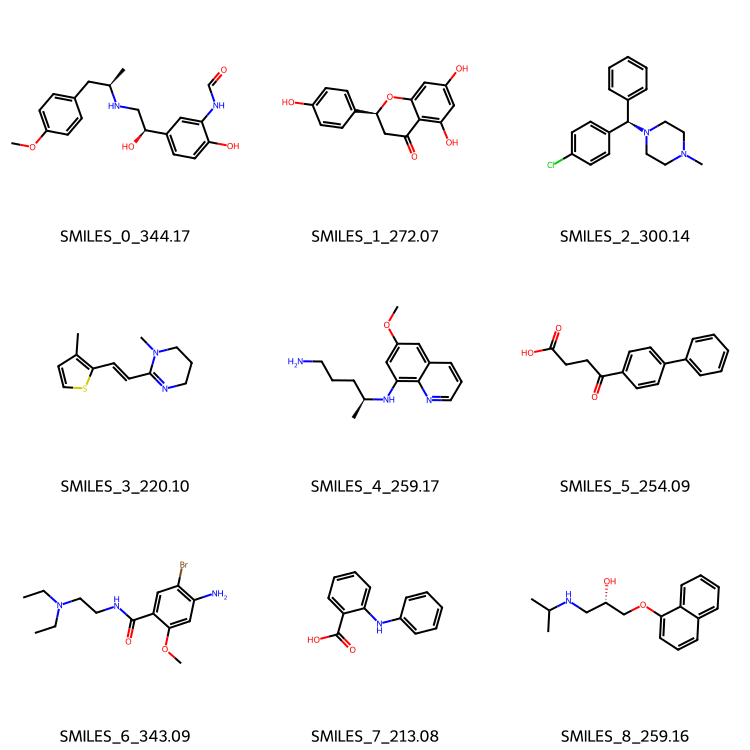

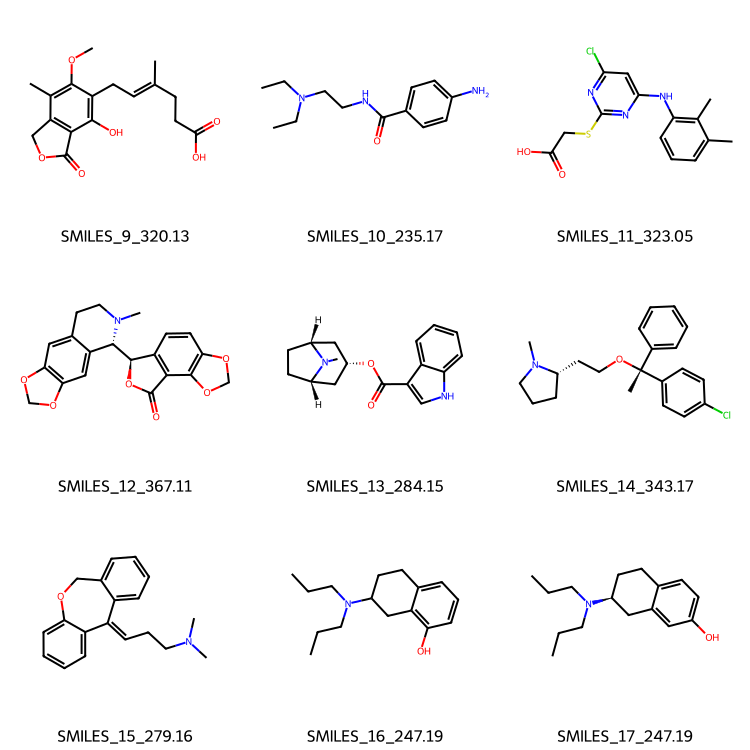

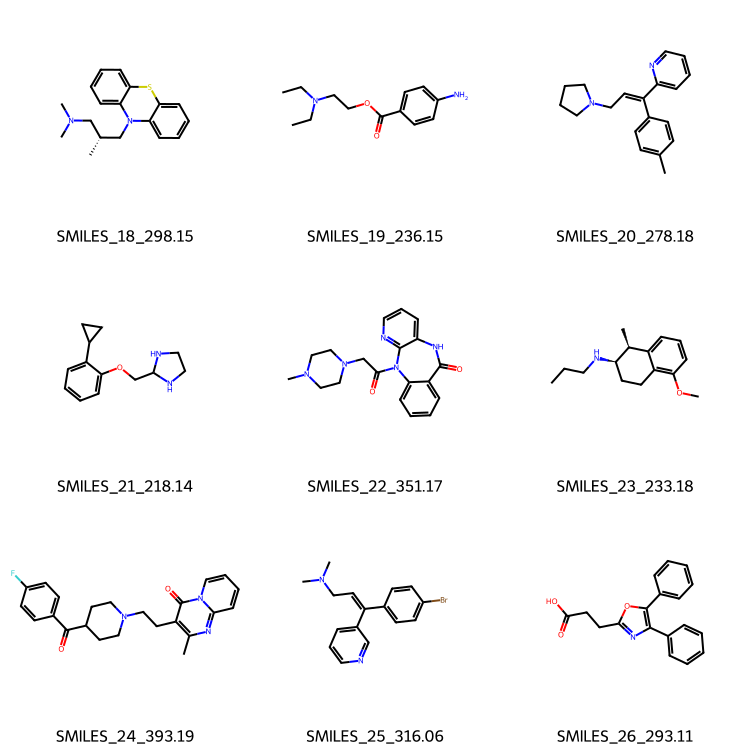

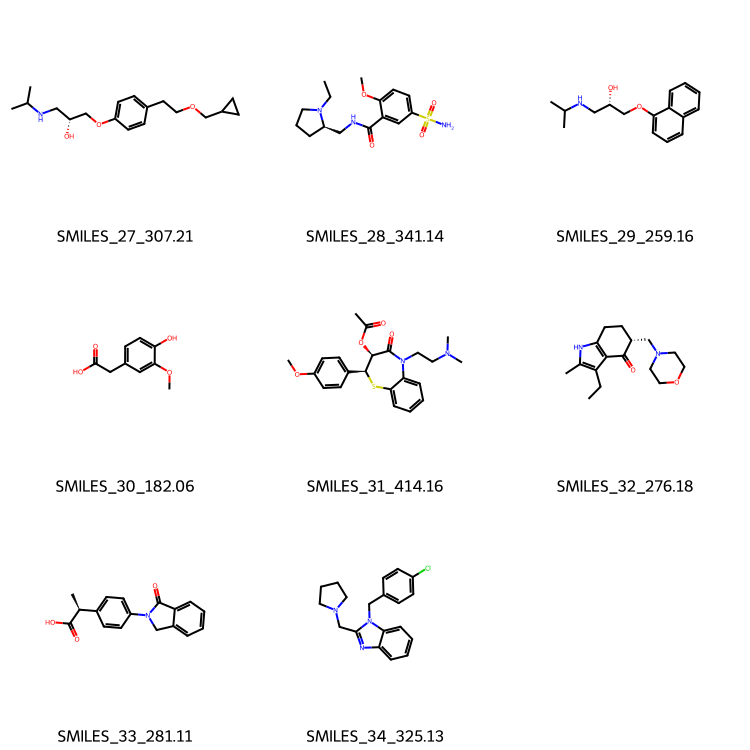


Regio Isomer SMILES:


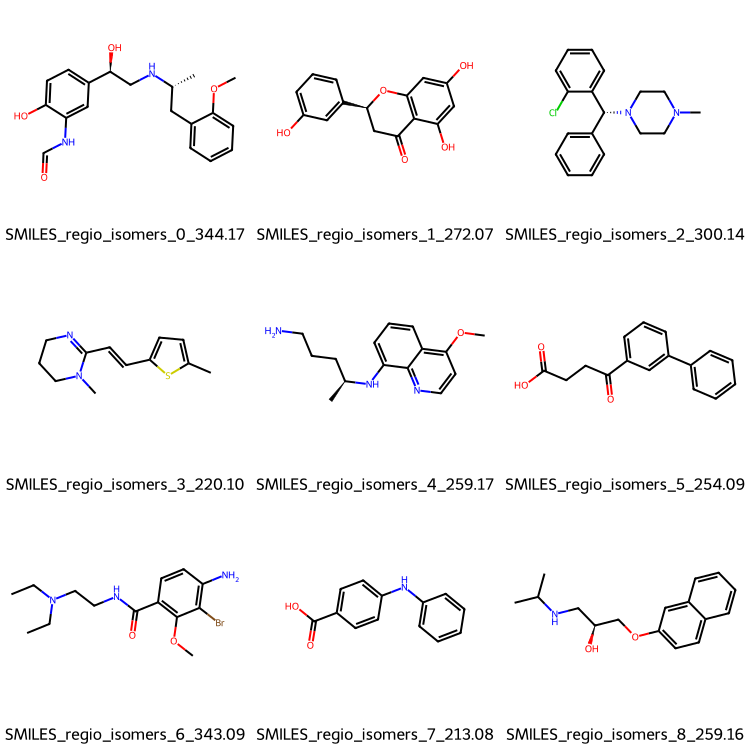

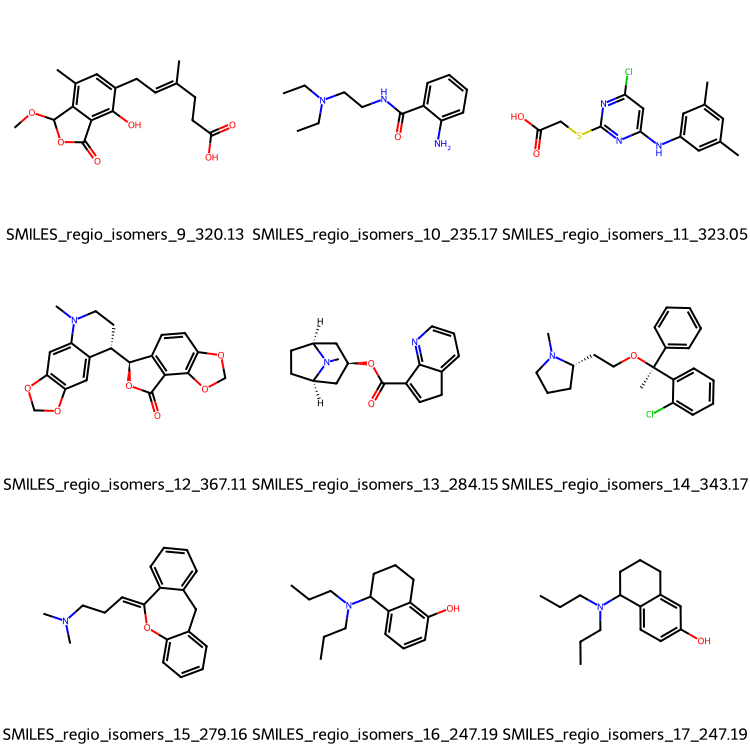

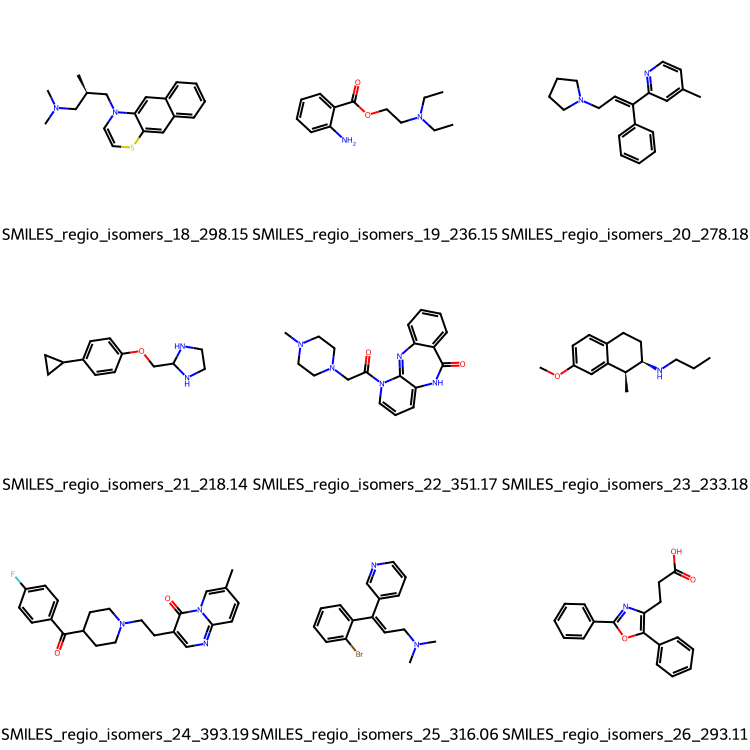

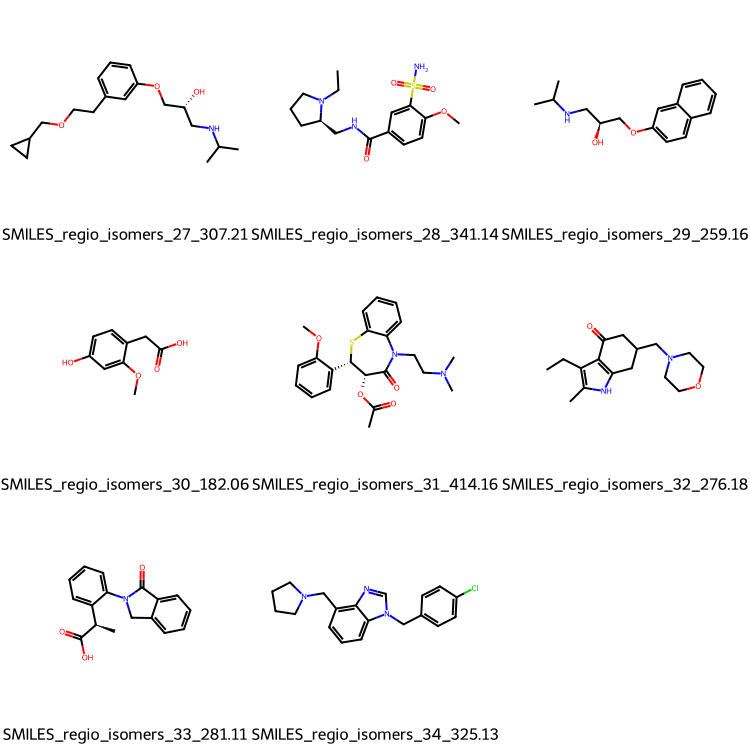


Side-by-side comparison:


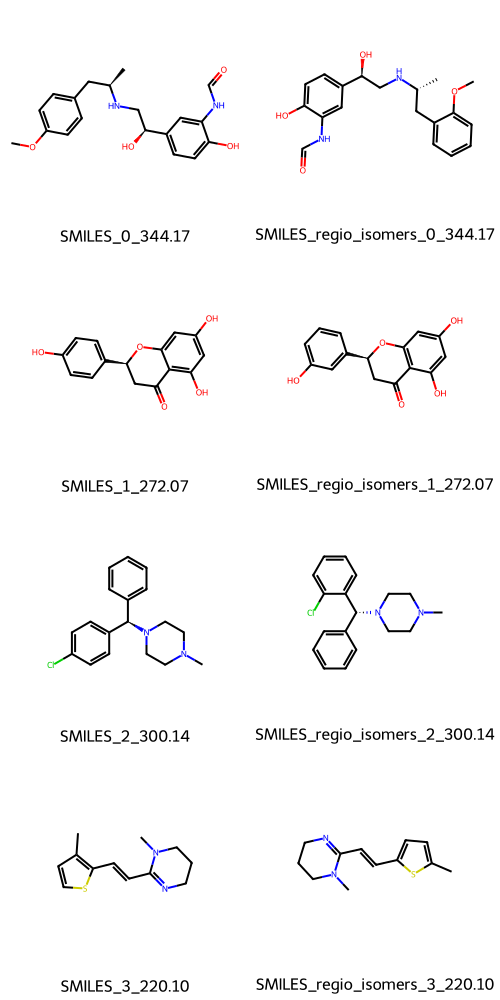

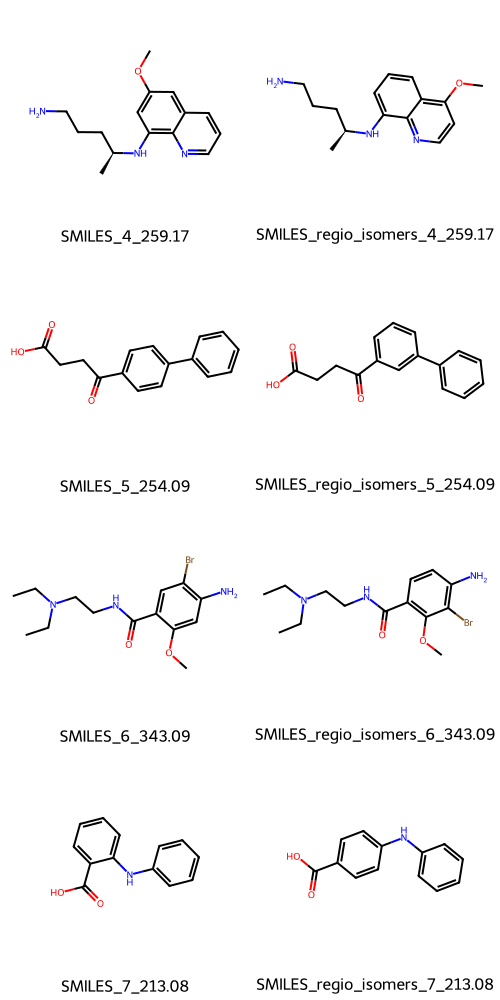

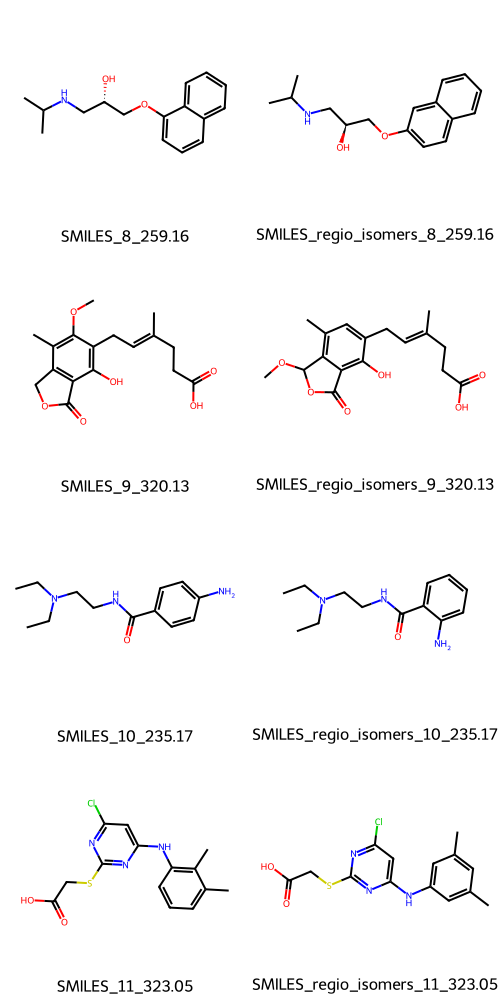

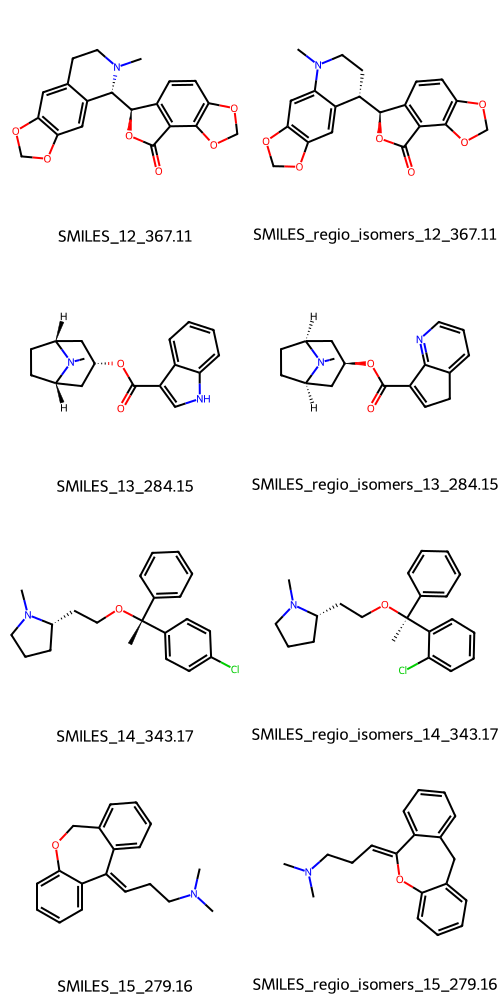

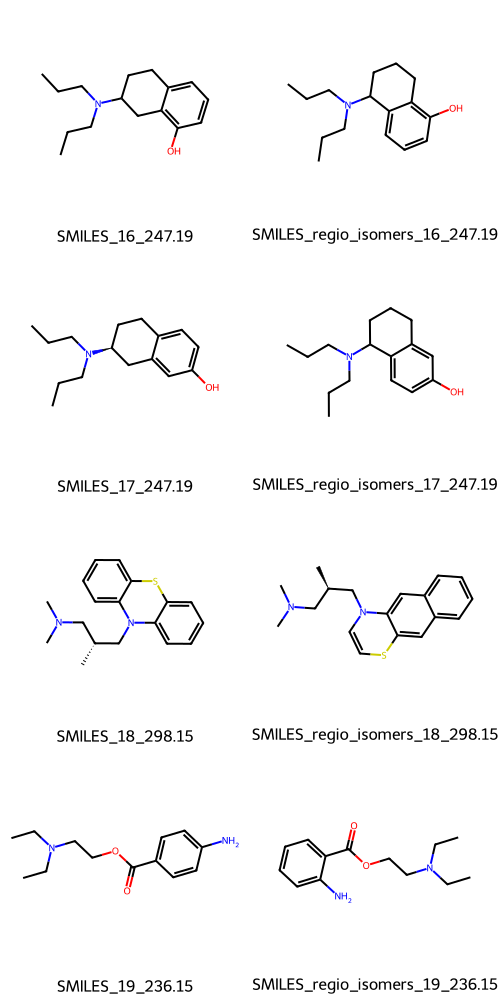

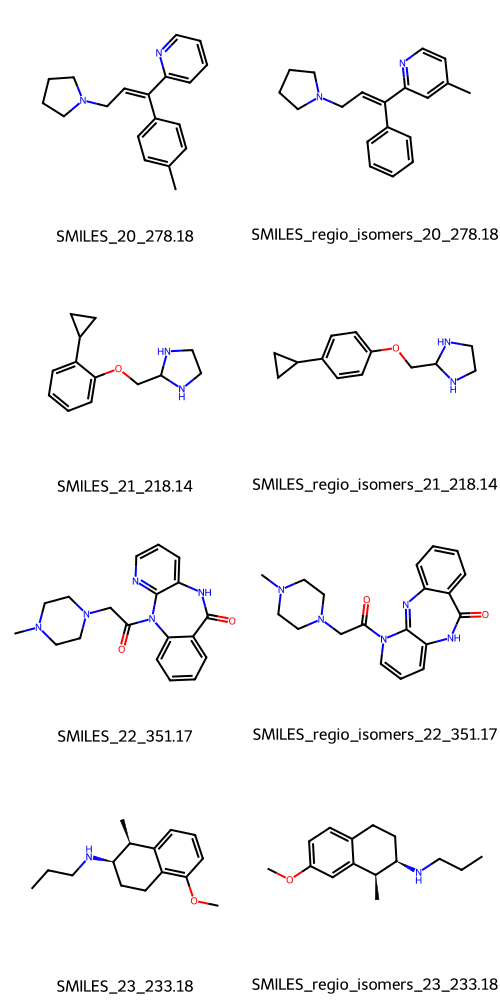

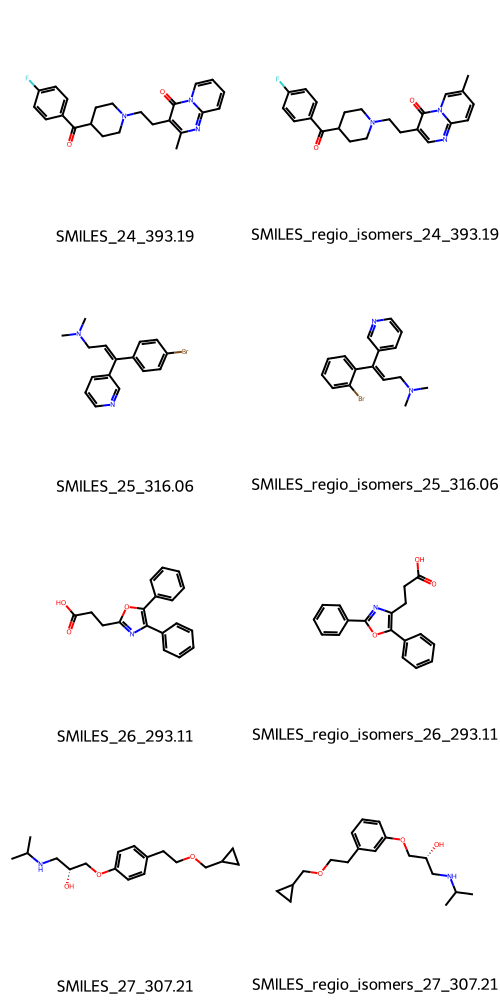

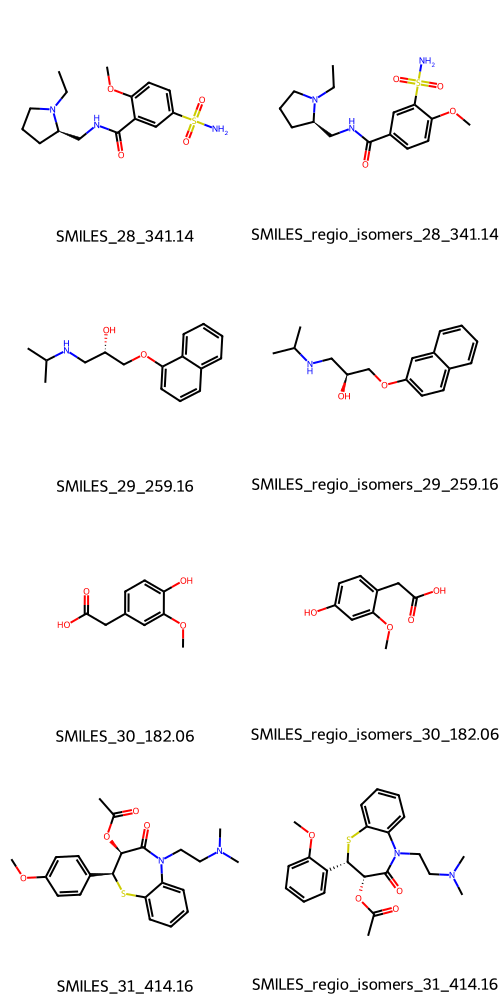

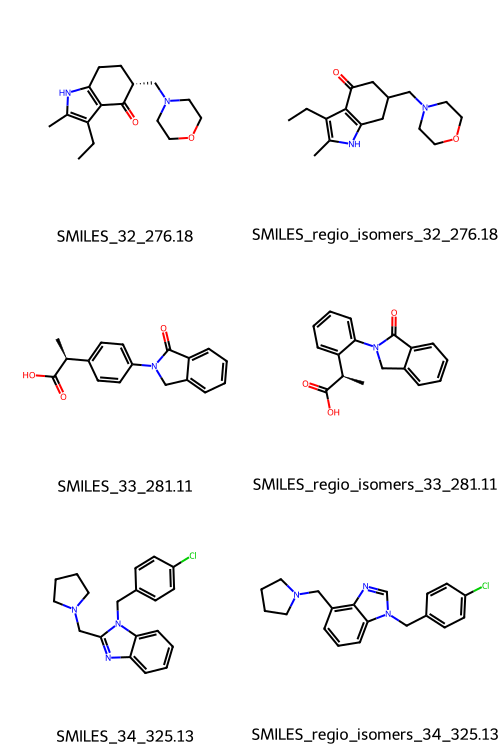

In [187]:

# Helper function to calculate molecular weight
def calculate_weight(smiles):
    mol = Chem.MolFromSmiles(smiles)
    return Chem.Descriptors.ExactMolWt(mol)

def plot_smiles_from_df(data_sorted, column_name):
    list_smiles = []
    sample_id_list = []
    for idx, smiles in enumerate(data_sorted[column_name]):
        weight = calculate_weight(smiles)
        string = f"{column_name}_{idx}_{weight:.2f}"
        sample_id_list.append(string)
        list_smiles.append(Chem.MolFromSmiles(smiles))
        if len(list_smiles) == 9 or idx == len(data_sorted) - 1:
            pic = Draw.MolsToGridImage(list_smiles, subImgSize=(250, 250), legends=sample_id_list)
            display(pic)
            list_smiles = []
            sample_id_list = []

# Read the CSV file
df = pd.read_csv(os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/ACD_1H_with_SN_filtered_v3_regio_aug.csv"))

# Plot SMILES from both columns
print("Original SMILES:")
plot_smiles_from_df(df, 'SMILES')

print("\nRegio Isomer SMILES:")
plot_smiles_from_df(df, 'SMILES_regio_isomers')

# Plotting both columns side by side
def plot_smiles_side_by_side(data_sorted, column1, column2):
    list_smiles1 = []
    list_smiles2 = []
    sample_id_list1 = []
    sample_id_list2 = []
    for idx, (smiles1, smiles2) in enumerate(zip(data_sorted[column1], data_sorted[column2])):
        weight1 = calculate_weight(smiles1)
        weight2 = calculate_weight(smiles2)
        string1 = f"{column1}_{idx}_{weight1:.2f}"
        string2 = f"{column2}_{idx}_{weight2:.2f}"
        sample_id_list1.append(string1)
        sample_id_list2.append(string2)
        list_smiles1.append(Chem.MolFromSmiles(smiles1))
        list_smiles2.append(Chem.MolFromSmiles(smiles2))
        if len(list_smiles1) == 4 or idx == len(data_sorted) - 1:
            combined_smiles = [mol for pair in zip(list_smiles1, list_smiles2) for mol in pair]
            combined_legends = [legend for pair in zip(sample_id_list1, sample_id_list2) for legend in pair]
            pic = Draw.MolsToGridImage(combined_smiles, molsPerRow=2, subImgSize=(250, 250), legends=combined_legends)
            display(pic)
            list_smiles1 = []
            list_smiles2 = []
            sample_id_list1 = []
            sample_id_list2 = []

print("\nSide-by-side comparison:")
plot_smiles_side_by_side(df, 'SMILES', 'SMILES_regio_isomers')

Number of SMILES: 11

First few SMILES:
CC(NCC(O)c1ccc(O)c(NC=O)c1)c1cc(C=O)ccc1O
COc1ccc(C(C)OCc2ccc(O)c(NC=O)c2)cc1NC=O
COc1cc(NCC(O)c2ccc(O)c(NC=O)c2)cc(C=O)c1C
COc1ccc(C(C)C(O)c2ccc(O)c(NC=O)c2)cc1NC=O
C=C(O)c1cccc(OC)c1NCC(O)c1ccc(O)c(NC=O)c1

Plotting SMILES grid:


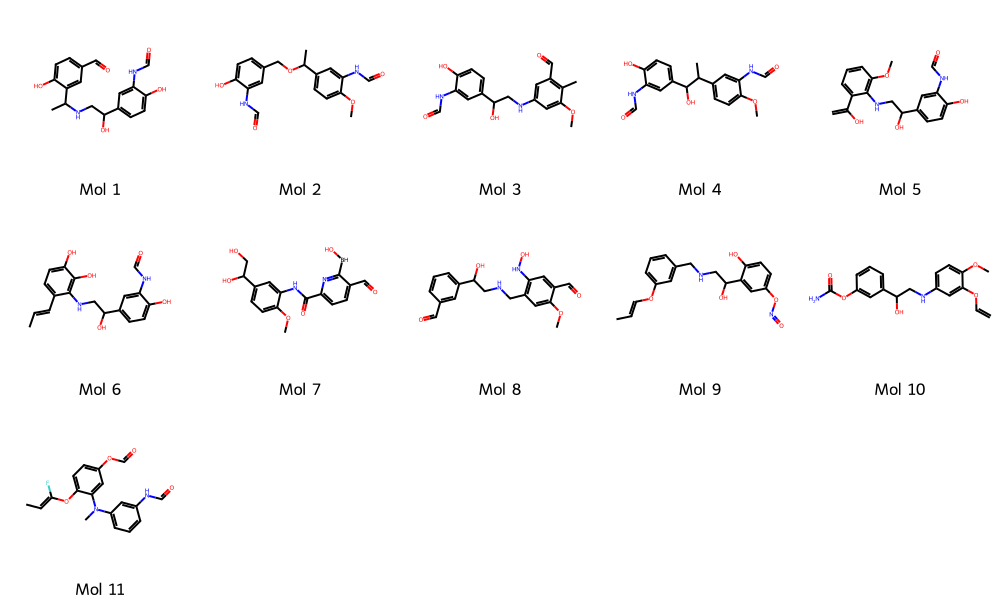

In [188]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display

def plot_smiles_grid(smiles_list, molsPerRow=5, subImgSize=(200, 200)):
    """
    Plot a list of SMILES as a grid with a specified number of molecules per row.
    
    :param smiles_list: List of SMILES strings to plot
    :param molsPerRow: Number of molecules per row in the grid (default: 5)
    :param subImgSize: Size of each molecule image (default: (200, 200))
    """
    mols = [Chem.MolFromSmiles(smiles) for smiles in smiles_list]
    
    # Generate labels (you can customize this if needed)
    legends = [f"Mol {i+1}" for i in range(len(mols))]
    
    # Create the grid image
    img = Draw.MolsToGridImage(mols, molsPerRow=molsPerRow, subImgSize=subImgSize, legends=legends)
    
    # Display the image
    display(img)

# Read the pickle file
file_path = os.path.abspath("./past_experiments/ChemXriv/7.0_Experiment/test_on_aug_data_34_v3/20240927_094958_exp_sim_data_0_0.pkl")
df = pd.read_pickle(file_path)

# Extract the SMILES list
results_dict_bl_ZINC = df['results_dict_bl_ZINC']
smiles_list = [value[0] for value in list(results_dict_bl_ZINC.values())[0][0]]

# Print the number of SMILES
print(f"Number of SMILES: {len(smiles_list)}")

# Print the first few SMILES for verification
print("\nFirst few SMILES:")
for smiles in smiles_list[:5]:
    print(smiles)

# Plot the SMILES grid
print("\nPlotting SMILES grid:")
plot_smiles_grid(smiles_list)

# Optionally, you can adjust the grid layout or image size like this:
# plot_smiles_grid(smiles_list, molsPerRow=4, subImgSize=(150, 150))

### Plot Guess Molecule in SVG

In [189]:


# SMILES string of the molecule
smiles = "OC(CNC(C)Cc1ccc(OC)cc1)c1cc(ccc1O)NC=O"

# Create a RDKit molecule object from the SMILES string
mol = Chem.MolFromSmiles(smiles)

# Generate 2D coordinates for the molecule
AllChem.Compute2DCoords(mol)

# Create a drawer object
d = Draw.MolDraw2DSVG(300, 300)

# Draw the molecule
d.DrawMolecule(mol)

# End the drawing
d.FinishDrawing()

# Get the SVG as a string
svg = d.GetDrawingText()

# Specify the path where you want to save the SVG file
save_path = os.path.abspath("./_FIGURES/20240927_094958_exp_sim_data_0_0.svg")

# Ensure the directory exists
os.makedirs(os.path.dirname(save_path), exist_ok=True)

# Save the SVG to a file_k_accuracy_MMTi_baseline_sim_sim_data_COSY_FINAL_2_k_accuracy_MMTi_baseline_sim_sim_data_COSY_FINAL_2
with open(save_path, 'w') as f:
    f.write(svg)

print(f"SVG has been saved to: {save_path}")

SVG has been saved to: /projects/cc/se_users/knlr326/1_NMR_project/2_Notebooks/MultiModalSpectralTransformer_cleaned/_FIGURES/20240927_094958_exp_sim_data_0_0.svg
